<a href="https://colab.research.google.com/github/mooniewexx/DL/blob/main/dl_06_2_image_segmentation_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#  Сегментация изображений

__Автор задач: Блохин Н.В. (NVBlokhin@fa.ru)__

Материалы:
* https://www.kaggle.com/datasets/rajkumarl/people-clothing-segmentation/data
* https://pyimagesearch.com/2021/11/08/u-net-training-image-segmentation-models-in-pytorch/
* https://amaarora.github.io/posts/2020-09-13-unet.html
* https://pytorch.org/docs/stable/generated/torch.nn.ConvTranspose2d.html
* https://medium.com/apache-mxnet/transposed-convolutions-explained-with-ms-excel-52d13030c7e8
* https://github.com/vdumoulin/conv_arithmetic/blob/master/README.md
* https://huggingface.co/docs/transformers/model_doc/segformer
* https://www.kaggle.com/code/damianpanek/segformerb0-people-clothing-segmentation

## Задачи для совместного разбора

1\. Рассмотрите пример работы слоя `ConvTranspose2d`.

In [ ]:
import torch
import torch.nn as nn

conv_transpose_layer = nn.ConvTranspose2d(in_channels=3, out_channels=1, kernel_size=3, stride=2, padding=1, output_padding=1)

input_tensor = torch.rand(1, 3, 4, 4) # тензор размера (batch_size=1, channels=3, height=4, width=4)

output_tensor = conv_transpose_layer(input_tensor) # прямое прохождение

print("Размер входного тензора:", input_tensor.shape)
print("Размер выходного тензора:", output_tensor.shape)

Размер входного тензора: torch.Size([1, 3, 4, 4])
Размер выходного тензора: torch.Size([1, 1, 8, 8])


## Задачи для самостоятельного решения

#### Загрузка датасета

In [ ]:
!pip install kaggle

In [ ]:
# Загрузка файла kaggle.json
from google.colab import files
files.upload()  # Загрузите файл kaggle.json здесь

# Перемещаем файл в нужную директорию
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Проверяем доступность Kaggle API
!kaggle datasets list

Saving kaggle.json to kaggle.json
ref                                                         title                                          size  lastUpdated          downloadCount  voteCount  usabilityRating  
----------------------------------------------------------  --------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
bhadramohit/customer-shopping-latest-trends-dataset         Customer Shopping (Latest Trends) Dataset      76KB  2024-11-23 15:26:12           6698        124  1.0              
mujtabamatin/air-quality-and-pollution-assessment           Air Quality and Pollution Assessment           84KB  2024-12-04 15:29:51           1830         41  1.0              
hopesb/student-depression-dataset                           Student Depression Dataset.                   454KB  2024-11-22 17:56:03           3711         58  0.9411765        
steve1215rogg/student-lifestyle-dataset                     student lifestyl

In [ ]:
# Загружаем датасет
!kaggle datasets download -d rajkumarl/people-clothing-segmentation

# Разархивируем датасет
!unzip people-clothing-segmentation.zip -d clothing_segmentation_data

Dataset URL: https://www.kaggle.com/datasets/rajkumarl/people-clothing-segmentation
License(s): CC0-1.0
100% 616M/616M [00:28<00:00, 24.7MB/s]
100% 616M/616M [00:28<00:00, 22.8MB/s]
Archive:  people-clothing-segmentation.zip
  inflating: clothing_segmentation_data/jpeg_images/IMAGES/img_0001.jpeg  
  inflating: clothing_segmentation_data/jpeg_images/IMAGES/img_0002.jpeg  
  inflating: clothing_segmentation_data/jpeg_images/IMAGES/img_0003.jpeg  
  inflating: clothing_segmentation_data/jpeg_images/IMAGES/img_0004.jpeg  
  inflating: clothing_segmentation_data/jpeg_images/IMAGES/img_0005.jpeg  
  inflating: clothing_segmentation_data/jpeg_images/IMAGES/img_0006.jpeg  
  inflating: clothing_segmentation_data/jpeg_images/IMAGES/img_0007.jpeg  
  inflating: clothing_segmentation_data/jpeg_images/IMAGES/img_0008.jpeg  
  inflating: clothing_segmentation_data/jpeg_images/IMAGES/img_0009.jpeg  
  inflating: clothing_segmentation_data/jpeg_images/IMAGES/img_0010.jpeg  
  inflating: clothing_seg

In [ ]:
import os

data_dir = "clothing_segmentation_data"

print("Содержимое папки:")
print(os.listdir(data_dir))

Содержимое папки:
['png_masks', 'labels (1).csv', 'jpeg_masks', 'labels.csv', 'png_images', 'jpeg_images']


In [ ]:
train_dataset_path = "/content/clothing_segmentation_data/png_images/IMAGES/"
val_dataset_path = "/content/clothing_segmentation_data/png_masks/MASKS/"

print("Примеры изображений:")
print(os.listdir(train_dataset_path)[:5])

print("Примеры масок:")
print(os.listdir(val_dataset_path)[:5])

Примеры изображений:
['img_0096.png', 'img_0989.png', 'img_0190.png', 'img_0847.png', 'img_0628.png']
Примеры масок:
['seg_0862.png', 'seg_0736.png', 'seg_0348.png', 'seg_0898.png', 'seg_0858.png']


<p class="task" id="1"></p>

#### 1\. Опишите датасет `ClothesSegmentationDataset`. Реализуйте `__getitem__` таким образом, чтобы он возвращал два элемента: тензор с изображением и тензор с маской. Маска должна быть представлена трехмерным тензором целых чисел. Предусмотрите возможность передавать извне при создании датасета набор преобразований для изображений и масок. Создайте объект датасета и выведите на экран форму и типы одного изображения и его маски.

- [ ] Проверено на семинаре

In [ ]:
import os
import torch
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image
import numpy as np


class ClothesSegmentationDataset(Dataset):
    def __init__(self, image_dir, mask_dir, image_transforms=None, mask_transforms=None):

        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.image_transforms = image_transforms
        self.mask_transforms = mask_transforms

        self.image_files = sorted(os.listdir(image_dir)) # список всех файлов изображений
        self.mask_files = sorted(os.listdir(mask_dir))

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        image_path = os.path.join(self.image_dir, self.image_files[idx]) # загружаем изображение
        image = Image.open(image_path).convert("RGB")

        mask_path = os.path.join(self.mask_dir, self.mask_files[idx]) # маску
        mask = Image.open(mask_path)

        if self.image_transforms: # преобразования
            image = self.image_transforms(image)
        if self.mask_transforms:
            mask = self.mask_transforms(mask)
        else:
            mask = torch.tensor(np.array(mask), dtype=torch.long).unsqueeze(0)

        return image, mask

In [ ]:
image_transforms = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
])
# ((64, 64)),#((128, 128)),
mask_transforms = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor()
])

train_dataset_path = "/content/clothing_segmentation_data/png_images/IMAGES/"
val_dataset_path = "/content/clothing_segmentation_data/png_masks/MASKS/" # mask_dir

dataset = ClothesSegmentationDataset(
    image_dir = train_dataset_path,
    mask_dir = val_dataset_path,
    image_transforms = image_transforms,
    mask_transforms = mask_transforms
)

In [ ]:
image, mask = dataset[1]
print("Форма изображения:", image.shape)
print("Форма маски:", mask.shape)

Форма изображения: torch.Size([3, 128, 128])
Форма маски: torch.Size([1, 128, 128])


<p class="task" id="2"></p>

#### 2\. Напишите функцию `show_image_with_mask`, которая выводит рядом два изображения: фотографию и маску. Продемонстрируйте работу функции, взяв один пример из созданного датасета.

- [ ] Проверено на семинаре

In [ ]:
def show_image_with_mask(image, mask):
    pass

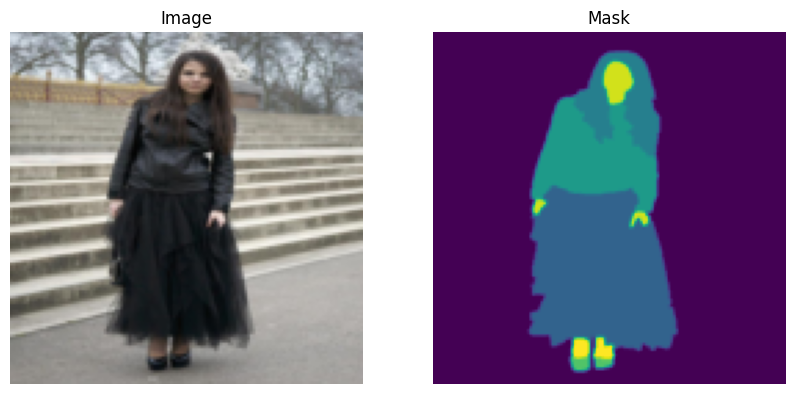

In [ ]:
import matplotlib.pyplot as plt

def show_image_with_mask(image, mask):
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(image.permute(1, 2, 0))  # перестановка осей для отображения
    axes[0].set_title("Image")
    axes[0].axis("off")

    axes[1].imshow(mask.squeeze(), cmap="viridis")  # убираем лишний размер
    axes[1].set_title("Mask")
    axes[1].axis("off")

    plt.show()

image, mask = dataset[1]
show_image_with_mask(image, mask)

<p class="task" id="3"></p>

#### 3\. Реализуйте архитектуру U-Net. Реализуйте модель таким образом, чтобы на выходе для каждого изображения получался тензор размера `n_classes x h x w`, где `n_classes` - количество уникальных значений в масках, а `h` и `w` - размер исходного изображения. Возьмите один пример из набора данных и пропустите его через сеть. Выведите форму полученного результата на экран.

- [ ] Проверено на семинаре

In [ ]:
'''import torch
import torch.nn as nn

class UNet(nn.Module):
    def __init__(self, n_classes):
        super(UNet, self).__init__()

        # Encoder
        self.enc1 = self.conv_block(3, 64)
        self.enc2 = self.conv_block(64, 128)
        self.enc3 = self.conv_block(128, 256)
        self.enc4 = self.conv_block(256, 512)

        # Bottleneck
        self.bottleneck = self.conv_block(512, 1024)

        # Decoder
        self.upconv4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.dec4 = self.conv_block(1024, 512)

        self.upconv3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec3 = self.conv_block(512, 256)

        self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = self.conv_block(256, 128)

        self.upconv1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = self.conv_block(128, 64)

        # Final layer
        self.final = nn.Conv2d(64, n_classes, kernel_size=1)

    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        # Encoding path
        enc1 = self.enc1(x)
        enc2 = self.enc2(nn.MaxPool2d(2)(enc1))
        enc3 = self.enc3(nn.MaxPool2d(2)(enc2))
        enc4 = self.enc4(nn.MaxPool2d(2)(enc3))

        # Bottleneck
        bottleneck = self.bottleneck(nn.MaxPool2d(2)(enc4))

        # Decoding path
        dec4 = self.upconv4(bottleneck)
        dec4 = self.dec4(torch.cat((dec4, enc4), dim=1))

        dec3 = self.upconv3(dec4)
        dec3 = self.dec3(torch.cat((dec3, enc3), dim=1))

        dec2 = self.upconv2(dec3)
        dec2 = self.dec2(torch.cat((dec2, enc2), dim=1))

        dec1 = self.upconv1(dec2)
        dec1 = self.dec1(torch.cat((dec1, enc1), dim=1))

        # Final segmentation map
        return self.final(dec1)


In [ ]:
from torch.utils.data import DataLoader
import numpy as np

def get_unique_classes(dataset):
    classes = set()
    for _, mask in DataLoader(dataset):
        unique_vals = torch.unique(mask).cpu().numpy()
        classes.update(unique_vals)
    return len(classes), classes

n_classes, classes = get_unique_classes(dataset)
print(f"Количество классов: {n_classes}")
print(f"Уникальные классы: {classes}")


Количество классов: 59
Уникальные классы: {0.0, 0.003921569, 0.015686275, 0.007843138, 0.011764706, 0.019607844, 0.023529412, 0.02745098, 0.03137255, 0.03529412, 0.039215688, 0.043137256, 0.047058824, 0.050980393, 0.05490196, 0.05882353, 0.11372549, 0.11764706, 0.12156863, 0.1254902, 0.12941177, 0.13333334, 0.13725491, 0.101960786, 0.105882354, 0.10980392, 0.07058824, 0.06666667, 0.0627451, 0.07450981, 0.078431375, 0.08235294, 0.08627451, 0.09019608, 0.09411765, 0.09803922, 0.18039216, 0.18431373, 0.1882353, 0.19215687, 0.19607843, 0.2, 0.20392157, 0.20784314, 0.21176471, 0.21568628, 0.21960784, 0.22352941, 0.22745098, 0.14117648, 0.14509805, 0.14901961, 0.15294118, 0.15686275, 0.16078432, 0.16470589, 0.16862746, 0.17254902, 0.1764706}


In [ ]:
import torch
import torch.nn as nn

class UNet(nn.Module):
    def __init__(self, n_classes):
        super(UNet, self).__init__()

        # Encoder
        self.enc1 = self.conv_block(3, 64)
        self.enc2 = self.conv_block(64, 128)
        self.enc3 = self.conv_block(128, 256)
        self.enc4 = self.conv_block(256, 512)

        # Bottleneck
        self.bottleneck = self.conv_block(512, 1024)

        # Decoder
        self.upconv4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.dec4 = self.conv_block(1024, 512)  # concat w cropped enc4

        self.upconv3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec3 = self.conv_block(512, 256)  # concat w cropped enc3

        self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = self.conv_block(256, 128)  # concat wcropped enc2

        self.upconv1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = self.conv_block(128, 64)  # concat w cropped enc1

        # Final
        self.final = nn.Conv2d(64, n_classes, kernel_size=1)

    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def crop_and_concat(self, upsampled, bypass):
        _, _, H, W = upsampled.size() # pазмер апсемплированного тензора decod
        _, _, H_b, W_b = bypass.size() # Размер тензора из кодировщика encod

        # Разница в размерах (высоте и ширине) делится на 2, чтобы сделать обрезку симметричной по обеим сторонам
        crop_h = (H_b - H) // 2
        crop_w = (W_b - W) // 2

        # Тензор обрезается так, чтобы его высота и ширина совпадали с тензором из декодировщика (upsampled)
        bypass = bypass[:, :, crop_h:crop_h + H, crop_w:crop_w + W]

        # После обрезки тензоры конкатенируются вдоль оси каналов (dim=1)
        return torch.cat((upsampled, bypass), dim=1)

    def forward(self, x):
        # Encoding
        enc1 = self.enc1(x)
        enc2 = self.enc2(nn.MaxPool2d(2)(enc1))
        enc3 = self.enc3(nn.MaxPool2d(2)(enc2))
        enc4 = self.enc4(nn.MaxPool2d(2)(enc3))

        # Bottleneck
        bottleneck = self.bottleneck(nn.MaxPool2d(2)(enc4))

        # Decoding
        dec4 = self.upconv4(bottleneck)
        dec4 = self.dec4(self.crop_and_concat(dec4, enc4))

        dec3 = self.upconv3(dec4)
        dec3 = self.dec3(self.crop_and_concat(dec3, enc3))

        dec2 = self.upconv2(dec3)
        dec2 = self.dec2(self.crop_and_concat(dec2, enc2))

        dec1 = self.upconv1(dec2)
        dec1 = self.dec1(self.crop_and_concat(dec1, enc1))

        return self.final(dec1)

In [ ]:
# Создаем модель
model = UNet(n_classes=n_classes)
#model = model.to("cuda")

# Тест на одном батче
image, mask = dataset[1]
image = image.unsqueeze(0)
#image = image.unsqueeze(0).to("cuda")  # Добавляем размер батча
output = model(image)

print("Форма входного изображения:", image.shape)
print("Форма выхода модели:", output.shape)  # Должно быть [batch_size, n_classes, h, w]

Форма входного изображения: torch.Size([1, 3, 128, 128])
Форма выхода модели: torch.Size([1, 59, 128, 128])


In [ ]:
model = UNet(n_classes = n_classes)

example_image = torch.rand(1, 3, 128, 128)  # тестовый вход

output = model(example_image)
print("Форма выходного тензора:", output.shape)  # (batch_size, n_classes, height, width)

Форма выходного тензора: torch.Size([1, 59, 128, 128])


#### старый ответ:

In [ ]:
import torch.nn as nn

class UNet(nn.Module):
    def __init__(self, n_classes):
        super(UNet, self).__init__()

        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2)
        )

        # Bottleneck
        self.bottleneck = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, n_classes, kernel_size=3, padding=1)
        )

    def forward(self, x):
        enc = self.encoder(x)
        bottleneck = self.bottleneck(enc)
        dec = self.decoder(bottleneck)
        return dec

In [ ]:
n_classes = 59
model = UNet(n_classes = n_classes)

example_image = torch.rand(1, 3, 128, 128)  # тестовый вход

output = model(example_image)
print("Форма выходного тензора:", output.shape)  # (batch_size, n_classes, height, width)

Форма выходного тензора: torch.Size([1, 59, 128, 128])


In [ ]:
output = model(image) # передаю второе изображение
print("Форма выходного тензора:", output.shape)  # (n_classes, height, width)

Форма выходного тензора: torch.Size([59, 128, 128])


In [ ]:
!pip install torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 926.4/926.4 kB 41.7 MB/s eta 0:00:00


<p class="task" id="4"></p>

#### 4\.  Разбейте набор данных на обучающее и валидационное множество. Обучите модель U-Net для сегментации изображения. Во время обучения выводите на экран значения функции потерь и точности прогнозов на обучающем и валидационном множестве. Обратите внимание, что выборка является несбалансированной. При расчете функции потерь примените любую известную вам технику для работы с несбалансированными выборками.

При создании датасета допускается использовать преобразования, уменьшающие размер изображений (для ускорения процесса обучения).

Используя обученную модель, получите предсказания для нескольких изображений и отрисуйте их.
- [ ] Проверено на семинаре

In [ ]:
import torch
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, Subset, random_split
from torchvision import transforms
import torch.optim as optim
import torch.nn as nn
from tqdm import tqdm

'''
# Разделяем данные на train и val
all_indices = list(range(len(dataset)))
train_indices, val_indices = train_test_split(all_indices, test_size=0.2, random_state=42)

train_dataset = Subset(dataset, train_indices)
val_dataset = Subset(dataset, val_indices)

'''

# 1. Настройка датасета с уменьшением размера изображений
image_transforms = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
])

mask_transforms = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor()
])

dataset = ClothesSegmentationDataset(
    image_dir=train_dataset_path,
    mask_dir=val_dataset_path,
    image_transforms=image_transforms,
    mask_transforms=None  # Маски не нормализуются
)

# 2. Разделение на обучающую и валидационную выборку
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=8)


In [ ]:
import torch.nn.functional as F

# Взвешенный кросс-энтропийный лосс
def calculate_class_weights(dataset, n_classes):
    total_counts = torch.zeros(n_classes)
    for _, mask in dataset:
        unique, counts = torch.unique(mask, return_counts=True)
        for cls, count in zip(unique, counts):
            total_counts[cls] += count
    weights = 1.0 / (total_counts + 1e-5)  # Добавляем небольшую константу, чтобы избежать деления на 0
    return weights

# Метрика IoU
def iou(preds, masks, n_classes):
    preds = torch.argmax(preds, dim=1)
    intersection = torch.zeros(n_classes)
    union = torch.zeros(n_classes)

    for cls in range(n_classes):
        pred_class = (preds == cls)
        mask_class = (masks == cls)
        intersection[cls] += (pred_class & mask_class).sum().item()
        union[cls] += (pred_class | mask_class).sum().item()

    iou_per_class = intersection / (union + 1e-5)
    return iou_per_class.mean().item()


def train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=10):
    for epoch in range(num_epochs):
        # Обучение
        model.train()
        train_loss = 0
        train_iou = 0

        for images, masks in tqdm(train_loader, desc=f"Training Epoch {epoch + 1}/{num_epochs}"):
            images, masks = images.to(device), masks.to(device)

            optimizer.zero_grad()
            outputs = model(images)

            masks = masks.squeeze(1)
            masks = F.interpolate(masks.unsqueeze(1).float(), size=outputs.shape[2:], mode="nearest").squeeze(1).long()


            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            train_iou += iou(outputs, masks, n_classes)  # Функция IoU должна быть определена

        # Валидация
        val_loss = 0
        val_iou = 0
        model.eval()
        with torch.no_grad():
            for images, masks in tqdm(val_loader, desc="Validation"):
                images, masks = images.to(device), masks.to(device)

                outputs = model(images)

                masks = masks.squeeze(1)
                masks = F.interpolate(masks.unsqueeze(1).float(), size=outputs.shape[2:], mode="nearest").squeeze(1).long()


                loss = criterion(outputs, masks)
                val_loss += loss.item()
                val_iou += iou(outputs, masks, n_classes)

        # Печать результатов
        print(f"Epoch {epoch + 1}/{num_epochs}")
        print(f"Train Loss: {train_loss / len(train_loader):.4f}, Train IoU: {train_iou / len(train_loader):.4f}")
        print(f"Val Loss: {val_loss / len(val_loader):.4f}, Val IoU: {val_iou / len(val_loader):.4f}")

In [ ]:
train_losses = []
train_ious = []
val_losses = []
val_ious = []

def train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=10):
    # Списки для хранения метрик

    for epoch in range(num_epochs):
        # Обучение
        model.train()
        train_loss = 0
        train_iou = 0

        for images, masks in tqdm(train_loader, desc=f"Epoch {epoch + 1}/{num_epochs}"):
            images, masks = images.to(device), masks.to(device)

            optimizer.zero_grad()
            outputs = model(images)

            masks = masks.squeeze(1)
            masks = F.interpolate(masks.unsqueeze(1).float(), size=outputs.shape[2:], mode="nearest").squeeze(1).long()

            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            train_iou += iou(outputs, masks, n_classes)

        # Валидация
        val_loss = 0
        val_iou = 0
        model.eval()
        with torch.no_grad():
            for images, masks in val_loader: #tqdm(val_loader):#, desc="Validation"):
                images, masks = images.to(device), masks.to(device)

                outputs = model(images)

                masks = masks.squeeze(1)
                masks = F.interpolate(masks.unsqueeze(1).float(), size=outputs.shape[2:], mode="nearest").squeeze(1).long()

                loss = criterion(outputs, masks)
                val_loss += loss.item()
                val_iou += iou(outputs, masks, n_classes)

        # Средние значения для метрик
        train_loss /= len(train_loader)
        train_iou /= len(train_loader)
        val_loss /= len(val_loader)
        val_iou /= len(val_loader)

        # Сохраняем метрики
        train_losses.append(train_loss)
        train_ious.append(train_iou)
        val_losses.append(val_loss)
        val_ious.append(val_iou)

        # Печать результатов
        #print(f"Epoch {epoch + 1}/{num_epochs}")
        print(f"Train Loss: {train_loss:.4f}, Train IoU: {train_iou:.4f}")
        print(f"Val Loss: {val_loss:.4f}, Val IoU: {val_iou:.4f}\n\n")

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Модель
n_classes = 59
model = UNet(n_classes).to(device)
#model = model.cuda()

# Оптимизатор
optimizer = optim.Adam(model.parameters(), lr=0.001)

class_weights = calculate_class_weights(dataset, n_classes=n_classes).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights)

In [ ]:
train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=10)

Epoch 1/10: 100%|██████████| 100/100 [00:23<00:00,  4.26it/s]


Train Loss: 4.0535, Train IoU: 0.0036
Val Loss: 3.9806, Val IoU: 0.0131




Epoch 2/10: 100%|██████████| 100/100 [00:22<00:00,  4.44it/s]


Train Loss: 3.9688, Train IoU: 0.0053
Val Loss: 3.8839, Val IoU: 0.0142




Epoch 3/10: 100%|██████████| 100/100 [00:22<00:00,  4.46it/s]


Train Loss: 3.8691, Train IoU: 0.0083
Val Loss: 3.8008, Val IoU: 0.0034




Epoch 4/10: 100%|██████████| 100/100 [00:23<00:00,  4.26it/s]


Train Loss: 3.7707, Train IoU: 0.0078
Val Loss: 3.7238, Val IoU: 0.0079




Epoch 5/10: 100%|██████████| 100/100 [00:22<00:00,  4.54it/s]


Train Loss: 3.7125, Train IoU: 0.0091
Val Loss: 3.7179, Val IoU: 0.0101




Epoch 6/10: 100%|██████████| 100/100 [00:22<00:00,  4.47it/s]


Train Loss: 3.6512, Train IoU: 0.0100
Val Loss: 3.6528, Val IoU: 0.0135




Epoch 7/10: 100%|██████████| 100/100 [00:22<00:00,  4.39it/s]


Train Loss: 3.6271, Train IoU: 0.0124
Val Loss: 3.6285, Val IoU: 0.0152




Epoch 8/10: 100%|██████████| 100/100 [00:22<00:00,  4.41it/s]


Train Loss: 3.5840, Train IoU: 0.0142
Val Loss: 3.6053, Val IoU: 0.0132




Epoch 9/10: 100%|██████████| 100/100 [00:22<00:00,  4.43it/s]


Train Loss: 3.5367, Train IoU: 0.0161
Val Loss: 3.5656, Val IoU: 0.0156




Epoch 10/10: 100%|██████████| 100/100 [00:23<00:00,  4.31it/s]


Train Loss: 3.4922, Train IoU: 0.0167
Val Loss: 3.5553, Val IoU: 0.0184




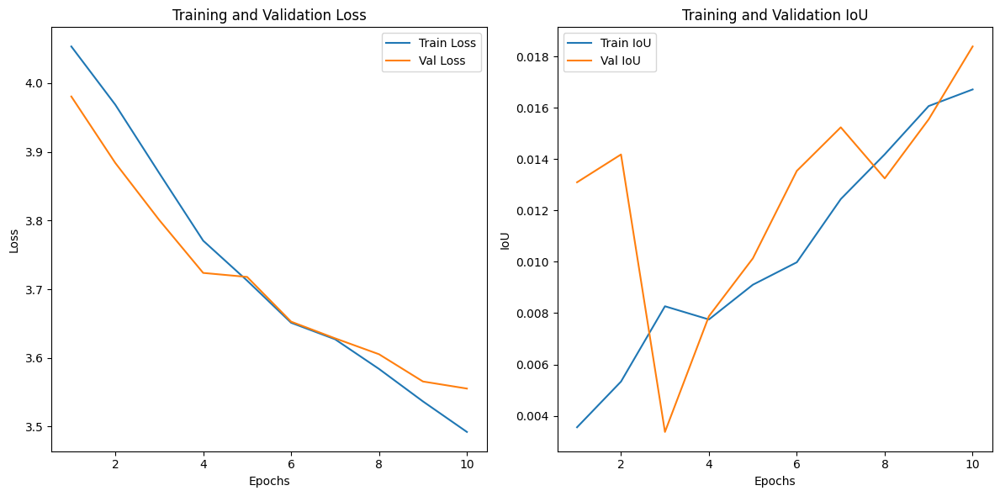

In [ ]:
def plot_metrics(num_epochs, train_losses, val_losses, train_ious, val_ious):
    """Функция для построения графиков потерь и IoU."""
    plt.figure(figsize=(12, 6))

    # График потерь
    plt.subplot(1, 2, 1)
    plt.plot(range(1, num_epochs + 1), train_losses, label="Train Loss")
    plt.plot(range(1, num_epochs + 1), val_losses, label="Val Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Training and Validation Loss")
    plt.legend()

    # График IoU
    plt.subplot(1, 2, 2)
    plt.plot(range(1, num_epochs + 1), train_ious, label="Train IoU")
    plt.plot(range(1, num_epochs + 1), val_ious, label="Val IoU")
    plt.xlabel("Epochs")
    plt.ylabel("IoU")
    plt.title("Training and Validation IoU")
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_metrics(num_epochs=10, train_losses=train_losses, val_losses=val_losses, train_ious=train_ious, val_ious=val_ious)


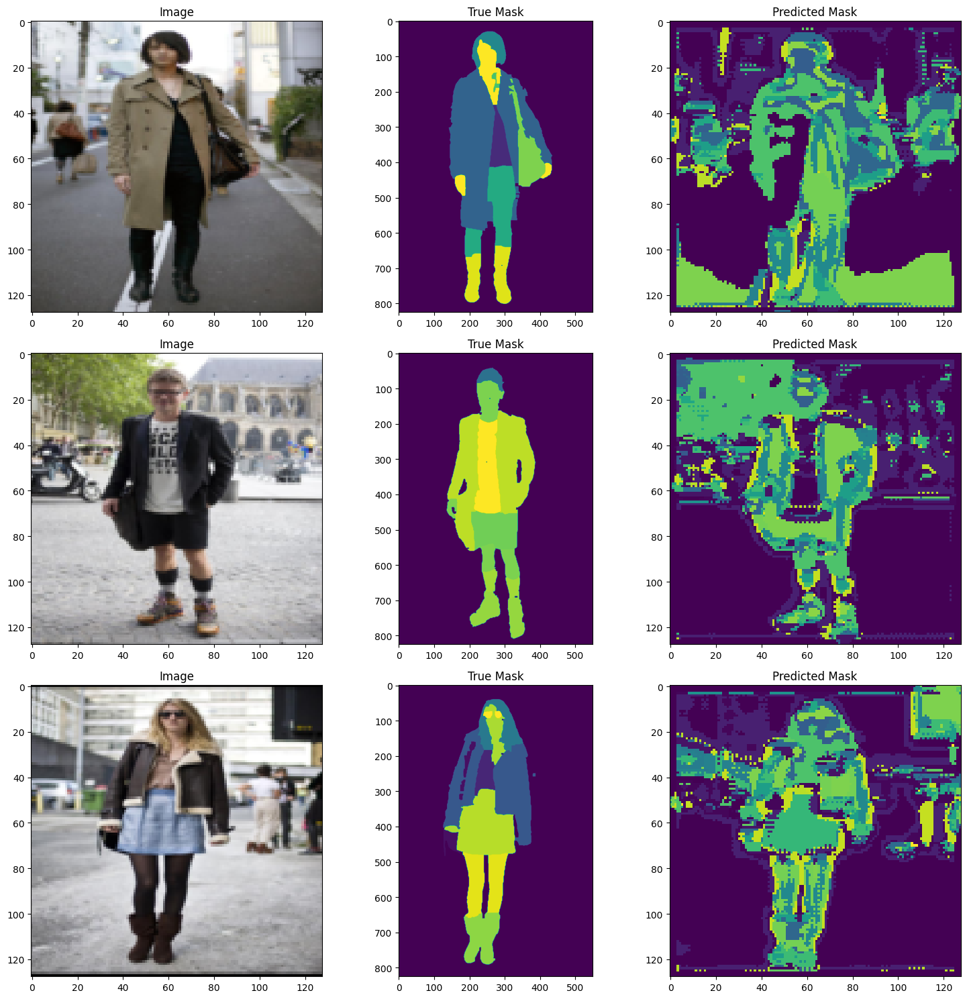

In [ ]:
# Отрисовка предсказаний
def plot_predictions(model, dataset, n_samples=3):
    model.eval()
    fig, axes = plt.subplots(n_samples, 3, figsize=(15, n_samples * 5))
    for i in range(n_samples):
        image, mask = dataset[i]
        image = image.cuda().unsqueeze(0)
        pred = torch.argmax(model(image), dim=1).cpu().squeeze()

        axes[i, 0].imshow(image.cpu().squeeze().permute(1, 2, 0))
        axes[i, 0].set_title("Image")
        axes[i, 1].imshow(mask.squeeze(), cmap="viridis")
        axes[i, 1].set_title("True Mask")
        axes[i, 2].imshow(pred, cmap="viridis")
        axes[i, 2].set_title("Predicted Mask")

    plt.tight_layout()
    plt.show()

plot_predictions(model, val_dataset)

In [ ]:
import torch
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, Subset, random_split
from torchvision import transforms
import torch.optim as optim
import torch.nn as nn
from tqdm import tqdm

'''
# Разделяем данные на train и val
all_indices = list(range(len(dataset)))
train_indices, val_indices = train_test_split(all_indices, test_size=0.2, random_state=42)

train_dataset = Subset(dataset, train_indices)
val_dataset = Subset(dataset, val_indices)

'''

# 1. Настройка датасета с уменьшением размера изображений
image_transforms = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
])

mask_transforms = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor()
])

dataset = ClothesSegmentationDataset(
    image_dir=train_dataset_path,
    mask_dir=val_dataset_path,
    image_transforms=image_transforms,
    mask_transforms=None  # Маски не нормализуются
)

# 2. Разделение на обучающую и валидационную выборку
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=8)


In [ ]:
import torch.nn.functional as F

# Взвешенный кросс-энтропийный лосс
def calculate_class_weights(dataset, n_classes):
    """Подсчет весов классов для компенсации несбалансированности."""
    total_counts = torch.zeros(n_classes)
    for _, mask in dataset:
        unique, counts = torch.unique(mask, return_counts=True)
        for cls, count in zip(unique, counts):
            total_counts[cls] += count
    weights = 1.0 / (total_counts + 1e-5)  # Добавляем небольшую константу, чтобы избежать деления на 0
    return weights

# Метрика IoU
def iou(preds, masks, n_classes):
    preds = torch.argmax(preds, dim=1)
    intersection = torch.zeros(n_classes)
    union = torch.zeros(n_classes)

    for cls in range(n_classes):
        pred_class = (preds == cls)
        mask_class = (masks == cls)
        intersection[cls] += (pred_class & mask_class).sum().item()
        union[cls] += (pred_class | mask_class).sum().item()

    iou_per_class = intersection / (union + 1e-5)
    return iou_per_class.mean().item()

In [ ]:
train_losses = []
train_ious = []
val_losses = []
val_ious = []

def train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=10):
    # Списки для хранения метрик

    for epoch in range(num_epochs):
        # Обучение
        model.train()
        train_loss = 0
        train_iou = 0

        for images, masks in tqdm(train_loader, desc=f"Epoch {epoch + 1}/{num_epochs}"):
            images, masks = images.to(device), masks.to(device)

            optimizer.zero_grad()
            outputs = model(images)

            masks = masks.squeeze(1)
            masks = F.interpolate(masks.unsqueeze(1).float(), size=outputs.shape[2:], mode="nearest").squeeze(1).long()

            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            train_iou += iou(outputs, masks, n_classes)

        # Валидация
        val_loss = 0
        val_iou = 0
        model.eval()
        with torch.no_grad():
            for images, masks in val_loader: #tqdm(val_loader):#, desc="Validation"):
                images, masks = images.to(device), masks.to(device)

                outputs = model(images)

                masks = masks.squeeze(1)
                masks = F.interpolate(masks.unsqueeze(1).float(), size=outputs.shape[2:], mode="nearest").squeeze(1).long()

                loss = criterion(outputs, masks)
                val_loss += loss.item()
                val_iou += iou(outputs, masks, n_classes)

        # Средние значения для метрик
        train_loss /= len(train_loader)
        train_iou /= len(train_loader)
        val_loss /= len(val_loader)
        val_iou /= len(val_loader)

        # Сохраняем метрики
        train_losses.append(train_loss)
        train_ious.append(train_iou)
        val_losses.append(val_loss)
        val_ious.append(val_iou)

        # Печать результатов
        #print(f"Epoch {epoch + 1}/{num_epochs}")
        print(f"Train Loss: {train_loss:.4f}, Train IoU: {train_iou:.4f}")
        print(f"Val Loss: {val_loss:.4f}, Val IoU: {val_iou:.4f}\n\n")

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Модель
n_classes = 59
model = UNet(n_classes).to(device)
#model = model.cuda()

# Оптимизатор
optimizer = optim.Adam(model.parameters(), lr=0.001)

class_weights = calculate_class_weights(dataset, n_classes=n_classes).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights)

In [ ]:
train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=10)

Epoch 1/10: 100%|██████████| 100/100 [00:31<00:00,  3.14it/s]


Train Loss: 4.1436, Train IoU: 0.0045
Val Loss: 4.0721, Val IoU: 0.0008




Epoch 2/10: 100%|██████████| 100/100 [00:31<00:00,  3.15it/s]


Train Loss: 4.0159, Train IoU: 0.0002
Val Loss: 4.0637, Val IoU: 0.0001




Epoch 3/10: 100%|██████████| 100/100 [00:31<00:00,  3.21it/s]


Train Loss: 3.9688, Train IoU: 0.0006
Val Loss: 4.0581, Val IoU: 0.0011




Epoch 4/10: 100%|██████████| 100/100 [00:30<00:00,  3.25it/s]


Train Loss: 3.9238, Train IoU: 0.0063
Val Loss: 4.0648, Val IoU: 0.0008




Epoch 5/10: 100%|██████████| 100/100 [00:30<00:00,  3.26it/s]


Train Loss: 3.8915, Train IoU: 0.0026
Val Loss: 4.0867, Val IoU: 0.0006




Epoch 6/10: 100%|██████████| 100/100 [00:31<00:00,  3.19it/s]


Train Loss: 3.8663, Train IoU: 0.0033
Val Loss: 4.0894, Val IoU: 0.0042




Epoch 7/10: 100%|██████████| 100/100 [00:30<00:00,  3.25it/s]


Train Loss: 3.8436, Train IoU: 0.0077
Val Loss: 4.0471, Val IoU: 0.0146




Epoch 8/10: 100%|██████████| 100/100 [00:30<00:00,  3.25it/s]


Train Loss: 3.8068, Train IoU: 0.0123
Val Loss: 4.0510, Val IoU: 0.0137




Epoch 9/10: 100%|██████████| 100/100 [00:31<00:00,  3.14it/s]


Train Loss: 3.7664, Train IoU: 0.0078
Val Loss: 4.1499, Val IoU: 0.0041




Epoch 10/10: 100%|██████████| 100/100 [00:31<00:00,  3.19it/s]


Train Loss: 3.7352, Train IoU: 0.0071
Val Loss: 4.1485, Val IoU: 0.0050




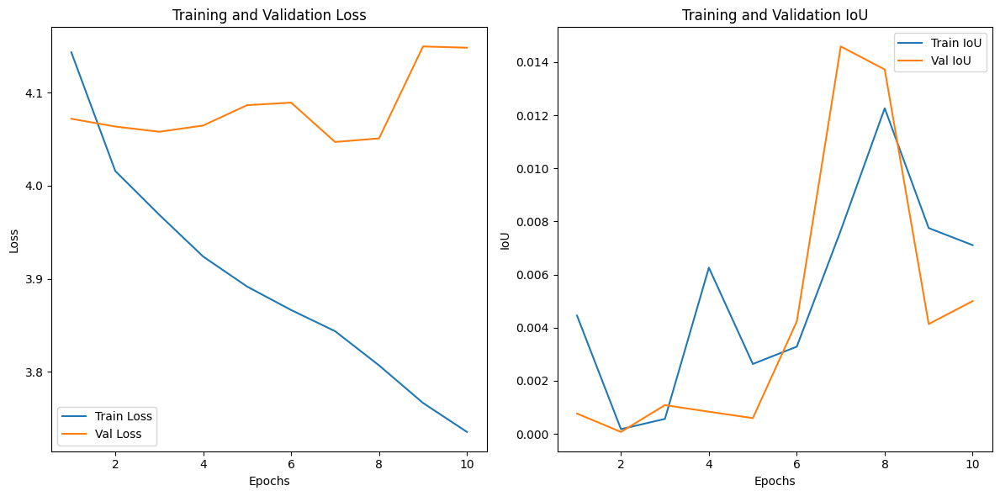

In [ ]:
def plot_metrics(num_epochs, train_losses, val_losses, train_ious, val_ious):
    """Функция для построения графиков потерь и IoU."""
    plt.figure(figsize=(12, 6))

    # График потерь
    plt.subplot(1, 2, 1)
    plt.plot(range(1, num_epochs + 1), train_losses, label="Train Loss")
    plt.plot(range(1, num_epochs + 1), val_losses, label="Val Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Training and Validation Loss")
    plt.legend()

    # График IoU
    plt.subplot(1, 2, 2)
    plt.plot(range(1, num_epochs + 1), train_ious, label="Train IoU")
    plt.plot(range(1, num_epochs + 1), val_ious, label="Val IoU")
    plt.xlabel("Epochs")
    plt.ylabel("IoU")
    plt.title("Training and Validation IoU")
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_metrics(num_epochs=10, train_losses=train_losses, val_losses=val_losses, train_ious=train_ious, val_ious=val_ious)


In [ ]:
train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=10)

Epoch 1/10: 100%|██████████| 100/100 [00:23<00:00,  4.26it/s]


Train Loss: 4.0535, Train IoU: 0.0036
Val Loss: 3.9806, Val IoU: 0.0131




Epoch 2/10: 100%|██████████| 100/100 [00:22<00:00,  4.44it/s]


Train Loss: 3.9688, Train IoU: 0.0053
Val Loss: 3.8839, Val IoU: 0.0142




Epoch 3/10: 100%|██████████| 100/100 [00:22<00:00,  4.46it/s]


Train Loss: 3.8691, Train IoU: 0.0083
Val Loss: 3.8008, Val IoU: 0.0034




Epoch 4/10: 100%|██████████| 100/100 [00:23<00:00,  4.26it/s]


Train Loss: 3.7707, Train IoU: 0.0078
Val Loss: 3.7238, Val IoU: 0.0079




Epoch 5/10: 100%|██████████| 100/100 [00:22<00:00,  4.54it/s]


Train Loss: 3.7125, Train IoU: 0.0091
Val Loss: 3.7179, Val IoU: 0.0101




Epoch 6/10: 100%|██████████| 100/100 [00:22<00:00,  4.47it/s]


Train Loss: 3.6512, Train IoU: 0.0100
Val Loss: 3.6528, Val IoU: 0.0135




Epoch 7/10: 100%|██████████| 100/100 [00:22<00:00,  4.39it/s]


Train Loss: 3.6271, Train IoU: 0.0124
Val Loss: 3.6285, Val IoU: 0.0152




Epoch 8/10: 100%|██████████| 100/100 [00:22<00:00,  4.41it/s]


Train Loss: 3.5840, Train IoU: 0.0142
Val Loss: 3.6053, Val IoU: 0.0132




Epoch 9/10: 100%|██████████| 100/100 [00:22<00:00,  4.43it/s]


Train Loss: 3.5367, Train IoU: 0.0161
Val Loss: 3.5656, Val IoU: 0.0156




Epoch 10/10: 100%|██████████| 100/100 [00:23<00:00,  4.31it/s]


Train Loss: 3.4922, Train IoU: 0.0167
Val Loss: 3.5553, Val IoU: 0.0184




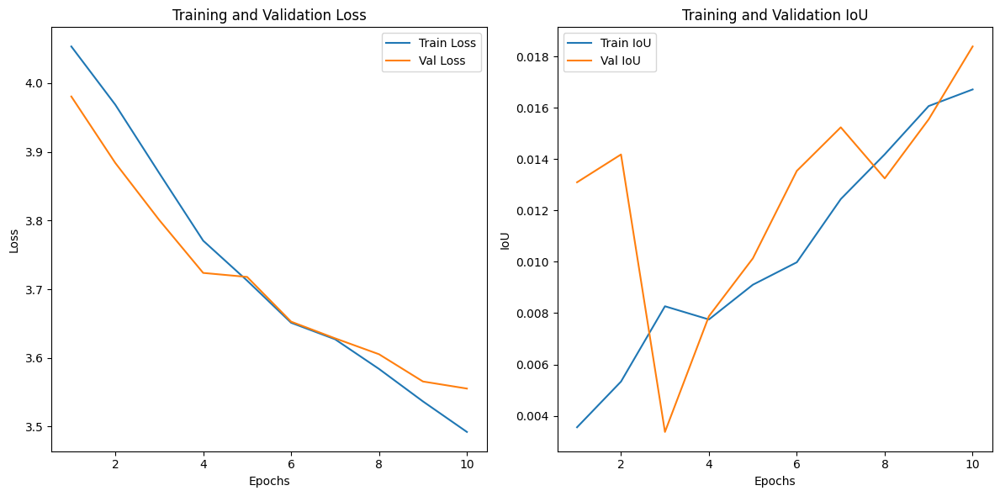

In [ ]:
def plot_metrics(num_epochs, train_losses, val_losses, train_ious, val_ious):
    """Функция для построения графиков потерь и IoU."""
    plt.figure(figsize=(12, 6))

    # График потерь
    plt.subplot(1, 2, 1)
    plt.plot(range(1, num_epochs + 1), train_losses, label="Train Loss")
    plt.plot(range(1, num_epochs + 1), val_losses, label="Val Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Training and Validation Loss")
    plt.legend()

    # График IoU
    plt.subplot(1, 2, 2)
    plt.plot(range(1, num_epochs + 1), train_ious, label="Train IoU")
    plt.plot(range(1, num_epochs + 1), val_ious, label="Val IoU")
    plt.xlabel("Epochs")
    plt.ylabel("IoU")
    plt.title("Training and Validation IoU")
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_metrics(num_epochs=10, train_losses=train_losses, val_losses=val_losses, train_ious=train_ious, val_ious=val_ious)


#### Обучение 3:

In [ ]:
import torch
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, Subset, random_split
from torchvision import transforms
import torch.optim as optim
import torch.nn as nn
from tqdm import tqdm

'''
# Разделяем данные на train и val
all_indices = list(range(len(dataset)))
train_indices, val_indices = train_test_split(all_indices, test_size=0.2, random_state=42)

train_dataset = Subset(dataset, train_indices)
val_dataset = Subset(dataset, val_indices)

'''

# 1. Настройка датасета с уменьшением размера изображений
image_transforms = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
])

mask_transforms = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor()
])

dataset = ClothesSegmentationDataset(
    image_dir=train_dataset_path,
    mask_dir=val_dataset_path,
    image_transforms=image_transforms,
    mask_transforms=None  # Маски не нормализуются
)

# 2. Разделение на обучающую и валидационную выборку
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=8)


In [ ]:
import torch.nn.functional as F

# Взвешенный кросс-энтропийный лосс
def calculate_class_weights(dataset, n_classes):
    total_counts = torch.zeros(n_classes)
    for _, mask in dataset:
        unique, counts = torch.unique(mask, return_counts=True)
        for cls, count in zip(unique, counts):
            total_counts[cls] += count
    weights = 1.0 / (total_counts + 1e-5)  # Добавляем небольшую константу, чтобы избежать деления на 0
    return weights

# Метрика IoU
def iou(preds, masks, n_classes):
    preds = torch.argmax(preds, dim=1)
    intersection = torch.zeros(n_classes)
    union = torch.zeros(n_classes)

    for cls in range(n_classes):
        pred_class = (preds == cls)
        mask_class = (masks == cls)
        intersection[cls] += (pred_class & mask_class).sum().item()
        union[cls] += (pred_class | mask_class).sum().item()

    iou_per_class = intersection / (union + 1e-5)
    return iou_per_class.mean().item()

'''
def train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=10):
    for epoch in range(num_epochs):
        # Обучение
        model.train()
        train_loss = 0
        train_iou = 0

        for images, masks in tqdm(train_loader, desc=f"Training Epoch {epoch + 1}/{num_epochs}"):
            images, masks = images.to(device), masks.to(device)

            optimizer.zero_grad()
            outputs = model(images)

            masks = masks.squeeze(1)
            masks = F.interpolate(masks.unsqueeze(1).float(), size=outputs.shape[2:], mode="nearest").squeeze(1).long()


            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            train_iou += iou(outputs, masks, n_classes)  # Функция IoU должна быть определена

        # Валидация
        val_loss = 0
        val_iou = 0
        model.eval()
        with torch.no_grad():
            for images, masks in tqdm(val_loader, desc="Validation"):
                images, masks = images.to(device), masks.to(device)

                outputs = model(images)

                masks = masks.squeeze(1)
                masks = F.interpolate(masks.unsqueeze(1).float(), size=outputs.shape[2:], mode="nearest").squeeze(1).long()


                loss = criterion(outputs, masks)
                val_loss += loss.item()
                val_iou += iou(outputs, masks, n_classes)

        # Печать результатов
        print(f"Epoch {epoch + 1}/{num_epochs}")
        print(f"Train Loss: {train_loss / len(train_loader):.4f}, Train IoU: {train_iou / len(train_loader):.4f}")
        print(f"Val Loss: {val_loss / len(val_loader):.4f}, Val IoU: {val_iou / len(val_loader):.4f}")'''

'\ndef train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=10):\n    for epoch in range(num_epochs):\n        # Обучение\n        model.train()\n        train_loss = 0\n        train_iou = 0\n\n        for images, masks in tqdm(train_loader, desc=f"Training Epoch {epoch + 1}/{num_epochs}"):\n            images, masks = images.to(device), masks.to(device)\n\n            optimizer.zero_grad()\n            outputs = model(images)\n\n            masks = masks.squeeze(1)\n            masks = F.interpolate(masks.unsqueeze(1).float(), size=outputs.shape[2:], mode="nearest").squeeze(1).long()\n\n\n            loss = criterion(outputs, masks)\n            loss.backward()\n            optimizer.step()\n\n            train_loss += loss.item()\n            train_iou += iou(outputs, masks, n_classes)  # Функция IoU должна быть определена\n\n        # Валидация\n        val_loss = 0\n        val_iou = 0\n        model.eval()\n        with torch.no_grad():\n            for i

In [ ]:
train_losses = []
train_ious = []
val_losses = []
val_ious = []

def train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=10):
    # Списки для хранения метрик

    for epoch in range(num_epochs):
        # Обучение
        model.train()
        train_loss = 0
        train_iou = 0

        for images, masks in tqdm(train_loader, desc=f"Epoch {epoch + 1}/{num_epochs}"):
            images, masks = images.to(device), masks.to(device)

            optimizer.zero_grad()
            outputs = model(images)

            masks = masks.squeeze(1)
            masks = F.interpolate(masks.unsqueeze(1).float(), size=outputs.shape[2:], mode="nearest").squeeze(1).long()

            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            train_iou += iou(outputs, masks, n_classes)

        # Валидация
        val_loss = 0
        val_iou = 0
        model.eval()
        with torch.no_grad():
            for images, masks in val_loader: #tqdm(val_loader):#, desc="Validation"):
                images, masks = images.to(device), masks.to(device)

                outputs = model(images)

                masks = masks.squeeze(1)
                masks = F.interpolate(masks.unsqueeze(1).float(), size=outputs.shape[2:], mode="nearest").squeeze(1).long()

                loss = criterion(outputs, masks)
                val_loss += loss.item()
                val_iou += iou(outputs, masks, n_classes)

        # Средние значения для метрик
        train_loss /= len(train_loader)
        train_iou /= len(train_loader)
        val_loss /= len(val_loader)
        val_iou /= len(val_loader)

        # Сохраняем метрики
        train_losses.append(train_loss)
        train_ious.append(train_iou)
        val_losses.append(val_loss)
        val_ious.append(val_iou)

        # Печать результатов
        #print(f"Epoch {epoch + 1}/{num_epochs}")
        print(f"Train Loss: {train_loss:.4f}, Train IoU: {train_iou:.4f}")
        print(f"Val Loss: {val_loss:.4f}, Val IoU: {val_iou:.4f}\n\n")

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Модель
n_classes = 59
model = UNet(n_classes).to(device)
#model = model.cuda()

# Оптимизатор
optimizer = optim.Adam(model.parameters(), lr=0.001)

class_weights = calculate_class_weights(dataset, n_classes=n_classes).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights)

In [ ]:
train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=40)

Epoch 1/40: 100%|██████████| 100/100 [00:23<00:00,  4.28it/s]


Train Loss: 4.0344, Train IoU: 0.0073
Val Loss: 3.9860, Val IoU: 0.0012




Epoch 2/40: 100%|██████████| 100/100 [00:21<00:00,  4.58it/s]


Train Loss: 3.9449, Train IoU: 0.0058
Val Loss: 3.9550, Val IoU: 0.0022




Epoch 3/40: 100%|██████████| 100/100 [00:22<00:00,  4.50it/s]


Train Loss: 3.8783, Train IoU: 0.0073
Val Loss: 3.9196, Val IoU: 0.0027




Epoch 4/40: 100%|██████████| 100/100 [00:22<00:00,  4.51it/s]


Train Loss: 3.8006, Train IoU: 0.0071
Val Loss: 3.9044, Val IoU: 0.0026




Epoch 5/40: 100%|██████████| 100/100 [00:22<00:00,  4.48it/s]


Train Loss: 3.7264, Train IoU: 0.0096
Val Loss: 3.7939, Val IoU: 0.0102




Epoch 6/40: 100%|██████████| 100/100 [00:22<00:00,  4.50it/s]


Train Loss: 3.6671, Train IoU: 0.0114
Val Loss: 3.8419, Val IoU: 0.0112




Epoch 7/40: 100%|██████████| 100/100 [00:22<00:00,  4.53it/s]


Train Loss: 3.6443, Train IoU: 0.0138
Val Loss: 3.7578, Val IoU: 0.0075




Epoch 8/40: 100%|██████████| 100/100 [00:22<00:00,  4.50it/s]


Train Loss: 3.6045, Train IoU: 0.0086
Val Loss: 3.6984, Val IoU: 0.0120




Epoch 9/40: 100%|██████████| 100/100 [00:22<00:00,  4.52it/s]


Train Loss: 3.5589, Train IoU: 0.0157
Val Loss: 3.7140, Val IoU: 0.0145




Epoch 10/40: 100%|██████████| 100/100 [00:21<00:00,  4.56it/s]


Train Loss: 3.5292, Train IoU: 0.0143
Val Loss: 3.6567, Val IoU: 0.0148




Epoch 11/40: 100%|██████████| 100/100 [00:22<00:00,  4.42it/s]


Train Loss: 3.4856, Train IoU: 0.0145
Val Loss: 3.6673, Val IoU: 0.0145




Epoch 12/40: 100%|██████████| 100/100 [00:22<00:00,  4.44it/s]


Train Loss: 3.4675, Train IoU: 0.0169
Val Loss: 3.6458, Val IoU: 0.0130




Epoch 13/40: 100%|██████████| 100/100 [00:22<00:00,  4.54it/s]


Train Loss: 3.4407, Train IoU: 0.0174
Val Loss: 3.6262, Val IoU: 0.0204




Epoch 14/40: 100%|██████████| 100/100 [00:21<00:00,  4.63it/s]


Train Loss: 3.4282, Train IoU: 0.0178
Val Loss: 3.7052, Val IoU: 0.0175




Epoch 15/40: 100%|██████████| 100/100 [00:21<00:00,  4.56it/s]


Train Loss: 3.3850, Train IoU: 0.0193
Val Loss: 3.6001, Val IoU: 0.0204




Epoch 16/40: 100%|██████████| 100/100 [00:22<00:00,  4.53it/s]


Train Loss: 3.3681, Train IoU: 0.0196
Val Loss: 3.5814, Val IoU: 0.0209




Epoch 17/40: 100%|██████████| 100/100 [00:22<00:00,  4.42it/s]


Train Loss: 3.3450, Train IoU: 0.0204
Val Loss: 3.6266, Val IoU: 0.0172




Epoch 18/40: 100%|██████████| 100/100 [00:22<00:00,  4.40it/s]


Train Loss: 3.3051, Train IoU: 0.0192
Val Loss: 3.5814, Val IoU: 0.0200




Epoch 19/40: 100%|██████████| 100/100 [00:22<00:00,  4.50it/s]


Train Loss: 3.2922, Train IoU: 0.0204
Val Loss: 3.5576, Val IoU: 0.0199




Epoch 20/40: 100%|██████████| 100/100 [00:21<00:00,  4.62it/s]


Train Loss: 3.2524, Train IoU: 0.0215
Val Loss: 3.5477, Val IoU: 0.0204




Epoch 21/40: 100%|██████████| 100/100 [00:21<00:00,  4.64it/s]


Train Loss: 3.2248, Train IoU: 0.0217
Val Loss: 3.5796, Val IoU: 0.0186




Epoch 22/40: 100%|██████████| 100/100 [00:22<00:00,  4.47it/s]


Train Loss: 3.1953, Train IoU: 0.0212
Val Loss: 3.5509, Val IoU: 0.0199




Epoch 23/40: 100%|██████████| 100/100 [00:22<00:00,  4.48it/s]


Train Loss: 3.2003, Train IoU: 0.0220
Val Loss: 3.6121, Val IoU: 0.0159




Epoch 24/40: 100%|██████████| 100/100 [00:22<00:00,  4.49it/s]


Train Loss: 3.1775, Train IoU: 0.0223
Val Loss: 3.5944, Val IoU: 0.0170




Epoch 25/40: 100%|██████████| 100/100 [00:22<00:00,  4.39it/s]


Train Loss: 3.1400, Train IoU: 0.0230
Val Loss: 3.5756, Val IoU: 0.0204




Epoch 26/40: 100%|██████████| 100/100 [00:22<00:00,  4.52it/s]


Train Loss: 3.1231, Train IoU: 0.0230
Val Loss: 3.5483, Val IoU: 0.0208




Epoch 27/40: 100%|██████████| 100/100 [00:21<00:00,  4.58it/s]


Train Loss: 3.0972, Train IoU: 0.0234
Val Loss: 3.5870, Val IoU: 0.0193




Epoch 28/40: 100%|██████████| 100/100 [00:23<00:00,  4.30it/s]


Train Loss: 3.0714, Train IoU: 0.0231
Val Loss: 3.5797, Val IoU: 0.0165




Epoch 29/40: 100%|██████████| 100/100 [00:22<00:00,  4.49it/s]


Train Loss: 3.0734, Train IoU: 0.0240
Val Loss: 3.6104, Val IoU: 0.0211




Epoch 30/40: 100%|██████████| 100/100 [00:22<00:00,  4.40it/s]


Train Loss: 3.0437, Train IoU: 0.0242
Val Loss: 3.5566, Val IoU: 0.0185




Epoch 31/40: 100%|██████████| 100/100 [00:22<00:00,  4.38it/s]


Train Loss: 3.0220, Train IoU: 0.0248
Val Loss: 3.6166, Val IoU: 0.0217




Epoch 32/40: 100%|██████████| 100/100 [00:22<00:00,  4.52it/s]


Train Loss: 3.0086, Train IoU: 0.0251
Val Loss: 3.5875, Val IoU: 0.0231




Epoch 33/40: 100%|██████████| 100/100 [00:22<00:00,  4.46it/s]


Train Loss: 2.9895, Train IoU: 0.0257
Val Loss: 3.5879, Val IoU: 0.0216




Epoch 34/40: 100%|██████████| 100/100 [00:22<00:00,  4.48it/s]


Train Loss: 2.9688, Train IoU: 0.0255
Val Loss: 3.6460, Val IoU: 0.0212




Epoch 35/40: 100%|██████████| 100/100 [00:22<00:00,  4.46it/s]


Train Loss: 2.9563, Train IoU: 0.0260
Val Loss: 3.6252, Val IoU: 0.0203




Epoch 36/40: 100%|██████████| 100/100 [00:22<00:00,  4.39it/s]


Train Loss: 2.9331, Train IoU: 0.0266
Val Loss: 3.5977, Val IoU: 0.0247




Epoch 37/40: 100%|██████████| 100/100 [00:22<00:00,  4.46it/s]


Train Loss: 2.9254, Train IoU: 0.0271
Val Loss: 3.6504, Val IoU: 0.0220




Epoch 38/40: 100%|██████████| 100/100 [00:22<00:00,  4.42it/s]


Train Loss: 2.9243, Train IoU: 0.0260
Val Loss: 3.6247, Val IoU: 0.0231




Epoch 39/40: 100%|██████████| 100/100 [00:22<00:00,  4.39it/s]


Train Loss: 2.9035, Train IoU: 0.0273
Val Loss: 3.6160, Val IoU: 0.0240




Epoch 40/40: 100%|██████████| 100/100 [00:22<00:00,  4.46it/s]


Train Loss: 2.8861, Train IoU: 0.0272
Val Loss: 3.6776, Val IoU: 0.0201




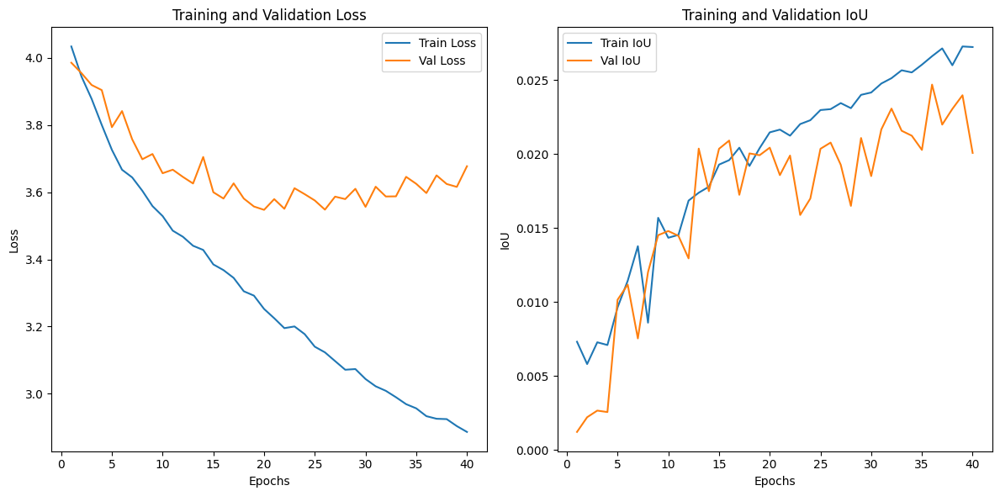

In [ ]:
def plot_metrics(num_epochs, train_losses, val_losses, train_ious, val_ious):
    """Функция для построения графиков потерь и IoU."""
    plt.figure(figsize=(12, 6))

    # График потерь
    plt.subplot(1, 2, 1)
    plt.plot(range(1, num_epochs + 1), train_losses, label="Train Loss")
    plt.plot(range(1, num_epochs + 1), val_losses, label="Val Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Training and Validation Loss")
    plt.legend()

    # График IoU
    plt.subplot(1, 2, 2)
    plt.plot(range(1, num_epochs + 1), train_ious, label="Train IoU")
    plt.plot(range(1, num_epochs + 1), val_ious, label="Val IoU")
    plt.xlabel("Epochs")
    plt.ylabel("IoU")
    plt.title("Training and Validation IoU")
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_metrics(num_epochs=40, train_losses=train_losses, val_losses=val_losses, train_ious=train_ious, val_ious=val_ious)


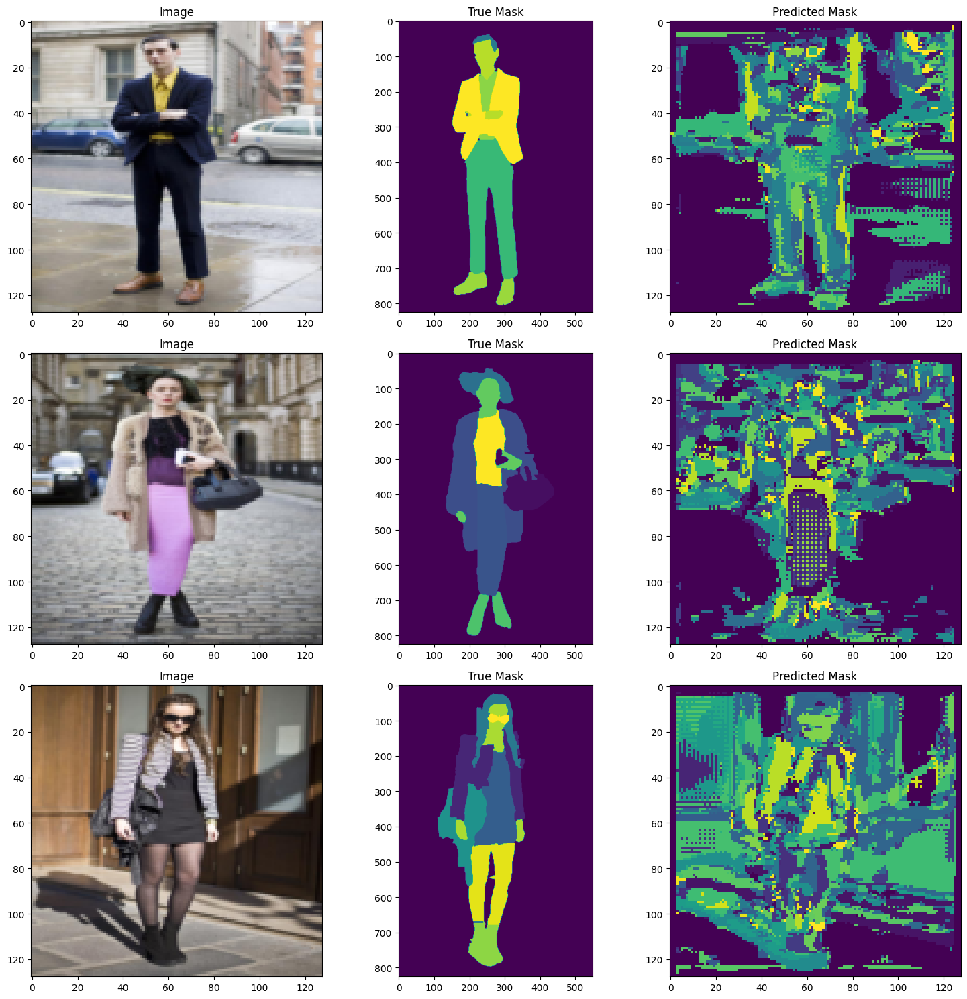

In [ ]:
# Отрисовка предсказаний
def plot_predictions(model, dataset, n_samples=3):
    model.eval()
    fig, axes = plt.subplots(n_samples, 3, figsize=(15, n_samples * 5))
    for i in range(n_samples):
        image, mask = dataset[i]
        image = image.cuda().unsqueeze(0)
        pred = torch.argmax(model(image), dim=1).cpu().squeeze()

        axes[i, 0].imshow(image.cpu().squeeze().permute(1, 2, 0))
        axes[i, 0].set_title("Image")
        axes[i, 1].imshow(mask.squeeze(), cmap="viridis")
        axes[i, 1].set_title("True Mask")
        axes[i, 2].imshow(pred, cmap="viridis")
        axes[i, 2].set_title("Predicted Mask")

    plt.tight_layout()
    plt.show()

plot_predictions(model, val_dataset)

In [ ]:
torch.save(model.state_dict(), 'model.pth')

2


In [ ]:
import torch.nn.functional as F

# Взвешенный кросс-энтропийный лосс
def calculate_class_weights(dataset, n_classes):
    total_counts = torch.zeros(n_classes)
    for _, mask in dataset:
        unique, counts = torch.unique(mask, return_counts=True)
        for cls, count in zip(unique, counts):
            total_counts[cls] += count
    weights = 1.0 / (total_counts + 1e-5)  # Добавляем небольшую константу, чтобы избежать деления на 0
    return weights

# Метрика IoU
def iou(preds, masks, n_classes):
    preds = torch.argmax(preds, dim=1)
    intersection = torch.zeros(n_classes)
    union = torch.zeros(n_classes)

    for cls in range(n_classes):
        pred_class = (preds == cls)
        mask_class = (masks == cls)
        intersection[cls] += (pred_class & mask_class).sum().item()
        union[cls] += (pred_class | mask_class).sum().item()

    iou_per_class = intersection / (union + 1e-5)
    return iou_per_class.mean().item()

'''
def train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=10):
    for epoch in range(num_epochs):
        # Обучение
        model.train()
        train_loss = 0
        train_iou = 0

        for images, masks in tqdm(train_loader, desc=f"Training Epoch {epoch + 1}/{num_epochs}"):
            images, masks = images.to(device), masks.to(device)

            optimizer.zero_grad()
            outputs = model(images)

            masks = masks.squeeze(1)
            masks = F.interpolate(masks.unsqueeze(1).float(), size=outputs.shape[2:], mode="nearest").squeeze(1).long()


            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            train_iou += iou(outputs, masks, n_classes)  # Функция IoU должна быть определена

        # Валидация
        val_loss = 0
        val_iou = 0
        model.eval()
        with torch.no_grad():
            for images, masks in tqdm(val_loader, desc="Validation"):
                images, masks = images.to(device), masks.to(device)

                outputs = model(images)

                masks = masks.squeeze(1)
                masks = F.interpolate(masks.unsqueeze(1).float(), size=outputs.shape[2:], mode="nearest").squeeze(1).long()


                loss = criterion(outputs, masks)
                val_loss += loss.item()
                val_iou += iou(outputs, masks, n_classes)

        # Печать результатов
        print(f"Epoch {epoch + 1}/{num_epochs}")
        print(f"Train Loss: {train_loss / len(train_loader):.4f}, Train IoU: {train_iou / len(train_loader):.4f}")
        print(f"Val Loss: {val_loss / len(val_loader):.4f}, Val IoU: {val_iou / len(val_loader):.4f}")'''

'\ndef train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=10):\n    for epoch in range(num_epochs):\n        # Обучение\n        model.train()\n        train_loss = 0\n        train_iou = 0\n\n        for images, masks in tqdm(train_loader, desc=f"Training Epoch {epoch + 1}/{num_epochs}"):\n            images, masks = images.to(device), masks.to(device)\n\n            optimizer.zero_grad()\n            outputs = model(images)\n\n            masks = masks.squeeze(1)\n            masks = F.interpolate(masks.unsqueeze(1).float(), size=outputs.shape[2:], mode="nearest").squeeze(1).long()\n\n\n            loss = criterion(outputs, masks)\n            loss.backward()\n            optimizer.step()\n\n            train_loss += loss.item()\n            train_iou += iou(outputs, masks, n_classes)  # Функция IoU должна быть определена\n\n        # Валидация\n        val_loss = 0\n        val_iou = 0\n        model.eval()\n        with torch.no_grad():\n            for i

In [ ]:
train_losses = []
train_ious = []
val_losses = []
val_ious = []

def train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=10):
    # Списки для хранения метрик

    for epoch in range(num_epochs):
        # Обучение
        model.train()
        train_loss = 0
        train_iou = 0

        for images, masks in tqdm(train_loader, desc=f"Epoch {epoch + 1}/{num_epochs}"):
            images, masks = images.to(device), masks.to(device)

            optimizer.zero_grad()
            outputs = model(images)

            masks = masks.squeeze(1)
            masks = F.interpolate(masks.unsqueeze(1).float(), size=outputs.shape[2:], mode="nearest").squeeze(1).long()

            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            train_iou += iou(outputs, masks, n_classes)

        # Валидация
        val_loss = 0
        val_iou = 0
        model.eval()
        with torch.no_grad():
            for images, masks in val_loader: #tqdm(val_loader):#, desc="Validation"):
                images, masks = images.to(device), masks.to(device)

                outputs = model(images)

                masks = masks.squeeze(1)
                masks = F.interpolate(masks.unsqueeze(1).float(), size=outputs.shape[2:], mode="nearest").squeeze(1).long()

                loss = criterion(outputs, masks)
                val_loss += loss.item()
                val_iou += iou(outputs, masks, n_classes)

        # Средние значения для метрик
        train_loss /= len(train_loader)
        #train_iou /= len(train_loader)
        val_loss /= len(val_loader)
        #val_iou /= len(val_loader)

        # Сохраняем метрики
        train_losses.append(train_loss)
        train_ious.append(train_iou)
        val_losses.append(val_loss)
        val_ious.append(val_iou)

        # Печать результатов
        #print(f"Epoch {epoch + 1}/{num_epochs}")
        print(f"Train Loss: {train_loss:.4f}, Train IoU: {train_iou:.4f}")
        print(f"Val Loss: {val_loss:.4f}, Val IoU: {val_iou:.4f}\n\n")

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Модель
n_classes = 59
num_epochs = 100
model = UNet(n_classes).to(device)
#model = model.cuda()

# Оптимизатор
optimizer = optim.Adam(model.parameters(), lr=0.001)

class_weights = calculate_class_weights(dataset, n_classes=n_classes).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights)

In [ ]:
train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=num_epochs)

Epoch 1/100: 100%|██████████| 100/100 [00:21<00:00,  4.55it/s]


Train Loss: 4.0374, Train IoU: 0.3186
Val Loss: 4.0337, Val IoU: 0.2204




Epoch 2/100: 100%|██████████| 100/100 [00:22<00:00,  4.53it/s]


Train Loss: 3.9586, Train IoU: 0.3856
Val Loss: 4.0032, Val IoU: 0.0234




Epoch 3/100: 100%|██████████| 100/100 [00:21<00:00,  4.56it/s]


Train Loss: 3.9006, Train IoU: 0.5532
Val Loss: 3.9473, Val IoU: 0.3523




Epoch 4/100: 100%|██████████| 100/100 [00:21<00:00,  4.58it/s]


Train Loss: 3.8251, Train IoU: 1.1400
Val Loss: 3.8936, Val IoU: 0.1692




Epoch 5/100: 100%|██████████| 100/100 [00:21<00:00,  4.71it/s]


Train Loss: 3.7547, Train IoU: 1.1073
Val Loss: 3.8457, Val IoU: 0.3349




Epoch 6/100: 100%|██████████| 100/100 [00:21<00:00,  4.55it/s]


Train Loss: 3.7003, Train IoU: 1.2714
Val Loss: 3.8215, Val IoU: 0.3134




Epoch 7/100: 100%|██████████| 100/100 [00:21<00:00,  4.62it/s]


Train Loss: 3.6613, Train IoU: 1.2467
Val Loss: 3.7869, Val IoU: 0.3394




Epoch 8/100: 100%|██████████| 100/100 [00:21<00:00,  4.55it/s]


Train Loss: 3.6228, Train IoU: 1.2919
Val Loss: 3.7802, Val IoU: 0.1738




Epoch 9/100: 100%|██████████| 100/100 [00:21<00:00,  4.58it/s]


Train Loss: 3.5794, Train IoU: 1.2476
Val Loss: 3.7332, Val IoU: 0.3380




Epoch 10/100: 100%|██████████| 100/100 [00:21<00:00,  4.56it/s]


Train Loss: 3.5481, Train IoU: 1.5280
Val Loss: 3.7231, Val IoU: 0.4687




Epoch 11/100: 100%|██████████| 100/100 [00:22<00:00,  4.53it/s]


Train Loss: 3.5234, Train IoU: 1.6622
Val Loss: 3.6803, Val IoU: 0.4319




Epoch 12/100: 100%|██████████| 100/100 [00:22<00:00,  4.51it/s]


Train Loss: 3.4839, Train IoU: 1.7657
Val Loss: 3.6727, Val IoU: 0.5321




Epoch 13/100: 100%|██████████| 100/100 [00:21<00:00,  4.63it/s]


Train Loss: 3.4340, Train IoU: 1.9279
Val Loss: 3.6238, Val IoU: 0.4314




Epoch 14/100: 100%|██████████| 100/100 [00:21<00:00,  4.71it/s]


Train Loss: 3.3869, Train IoU: 1.9054
Val Loss: 3.6540, Val IoU: 0.3413




Epoch 15/100: 100%|██████████| 100/100 [00:21<00:00,  4.62it/s]


Train Loss: 3.3786, Train IoU: 1.8507
Val Loss: 3.5930, Val IoU: 0.5360




Epoch 16/100: 100%|██████████| 100/100 [00:22<00:00,  4.45it/s]


Train Loss: 3.3254, Train IoU: 2.0497
Val Loss: 3.6057, Val IoU: 0.3456




Epoch 17/100: 100%|██████████| 100/100 [00:22<00:00,  4.54it/s]


Train Loss: 3.3145, Train IoU: 2.0204
Val Loss: 3.6249, Val IoU: 0.5079




Epoch 18/100: 100%|██████████| 100/100 [00:22<00:00,  4.53it/s]


Train Loss: 3.2783, Train IoU: 2.0719
Val Loss: 3.5811, Val IoU: 0.4317




Epoch 19/100: 100%|██████████| 100/100 [00:21<00:00,  4.57it/s]


Train Loss: 3.2603, Train IoU: 2.1846
Val Loss: 3.6120, Val IoU: 0.5552




Epoch 20/100: 100%|██████████| 100/100 [00:21<00:00,  4.58it/s]


Train Loss: 3.2438, Train IoU: 2.1606
Val Loss: 3.5418, Val IoU: 0.4609




Epoch 21/100: 100%|██████████| 100/100 [00:21<00:00,  4.66it/s]


Train Loss: 3.2129, Train IoU: 2.1250
Val Loss: 3.5916, Val IoU: 0.5140




Epoch 22/100: 100%|██████████| 100/100 [00:21<00:00,  4.69it/s]


Train Loss: 3.1828, Train IoU: 2.2898
Val Loss: 3.5658, Val IoU: 0.5478




Epoch 23/100: 100%|██████████| 100/100 [00:21<00:00,  4.58it/s]


Train Loss: 3.1800, Train IoU: 2.2901
Val Loss: 3.6015, Val IoU: 0.5281




Epoch 24/100: 100%|██████████| 100/100 [00:22<00:00,  4.54it/s]


Train Loss: 3.1375, Train IoU: 2.3315
Val Loss: 3.5679, Val IoU: 0.5217




Epoch 25/100: 100%|██████████| 100/100 [00:22<00:00,  4.38it/s]


Train Loss: 3.1322, Train IoU: 2.3859
Val Loss: 3.6240, Val IoU: 0.4426




Epoch 26/100: 100%|██████████| 100/100 [00:21<00:00,  4.57it/s]


Train Loss: 3.1115, Train IoU: 2.3073
Val Loss: 3.6549, Val IoU: 0.4417




Epoch 27/100: 100%|██████████| 100/100 [00:22<00:00,  4.54it/s]


Train Loss: 3.0937, Train IoU: 2.3995
Val Loss: 3.6230, Val IoU: 0.6018




Epoch 28/100: 100%|██████████| 100/100 [00:22<00:00,  4.54it/s]


Train Loss: 3.0596, Train IoU: 2.4987
Val Loss: 3.6393, Val IoU: 0.3965




Epoch 29/100: 100%|██████████| 100/100 [00:21<00:00,  4.62it/s]


Train Loss: 3.0609, Train IoU: 2.4413
Val Loss: 3.6397, Val IoU: 0.5653




Epoch 30/100: 100%|██████████| 100/100 [00:21<00:00,  4.73it/s]


Train Loss: 3.0244, Train IoU: 2.4848
Val Loss: 3.6663, Val IoU: 0.6533




Epoch 31/100: 100%|██████████| 100/100 [00:21<00:00,  4.70it/s]


Train Loss: 3.0129, Train IoU: 2.5227
Val Loss: 3.6171, Val IoU: 0.6159




Epoch 32/100: 100%|██████████| 100/100 [00:21<00:00,  4.57it/s]


Train Loss: 2.9814, Train IoU: 2.6722
Val Loss: 3.6065, Val IoU: 0.6027




Epoch 33/100: 100%|██████████| 100/100 [00:22<00:00,  4.53it/s]


Train Loss: 2.9683, Train IoU: 2.5749
Val Loss: 3.6219, Val IoU: 0.5947




Epoch 34/100: 100%|██████████| 100/100 [00:22<00:00,  4.39it/s]


Train Loss: 2.9678, Train IoU: 2.6096
Val Loss: 3.6015, Val IoU: 0.5919




Epoch 35/100: 100%|██████████| 100/100 [00:22<00:00,  4.53it/s]


Train Loss: 2.9451, Train IoU: 2.4729
Val Loss: 3.6283, Val IoU: 0.6420




Epoch 36/100: 100%|██████████| 100/100 [00:21<00:00,  4.55it/s]


Train Loss: 2.9161, Train IoU: 2.6049
Val Loss: 3.6636, Val IoU: 0.5958




Epoch 37/100: 100%|██████████| 100/100 [00:21<00:00,  4.67it/s]


Train Loss: 2.9069, Train IoU: 2.7926
Val Loss: 3.6526, Val IoU: 0.6119




Epoch 38/100: 100%|██████████| 100/100 [00:21<00:00,  4.69it/s]


Train Loss: 2.9143, Train IoU: 2.6524
Val Loss: 3.6507, Val IoU: 0.6337




Epoch 39/100: 100%|██████████| 100/100 [00:21<00:00,  4.60it/s]


Train Loss: 2.8902, Train IoU: 2.7189
Val Loss: 3.6448, Val IoU: 0.5711




Epoch 40/100: 100%|██████████| 100/100 [00:22<00:00,  4.54it/s]


Train Loss: 2.8873, Train IoU: 2.7555
Val Loss: 3.6977, Val IoU: 0.6325




Epoch 41/100: 100%|██████████| 100/100 [00:22<00:00,  4.54it/s]


Train Loss: 2.8552, Train IoU: 2.8157
Val Loss: 3.7332, Val IoU: 0.5912




Epoch 42/100: 100%|██████████| 100/100 [00:21<00:00,  4.56it/s]


Train Loss: 2.8583, Train IoU: 2.9031
Val Loss: 3.6841, Val IoU: 0.6464




Epoch 43/100: 100%|██████████| 100/100 [00:22<00:00,  4.40it/s]


Train Loss: 2.8527, Train IoU: 2.6750
Val Loss: 3.6753, Val IoU: 0.5510




Epoch 44/100: 100%|██████████| 100/100 [00:21<00:00,  4.62it/s]


Train Loss: 2.8444, Train IoU: 2.7756
Val Loss: 3.6445, Val IoU: 0.7063




Epoch 45/100: 100%|██████████| 100/100 [00:21<00:00,  4.68it/s]


Train Loss: 2.8115, Train IoU: 2.8449
Val Loss: 3.7044, Val IoU: 0.6805




Epoch 46/100: 100%|██████████| 100/100 [00:21<00:00,  4.65it/s]


Train Loss: 2.8044, Train IoU: 2.8750
Val Loss: 3.8151, Val IoU: 0.4306




Epoch 47/100: 100%|██████████| 100/100 [00:22<00:00,  4.53it/s]


Train Loss: 2.7951, Train IoU: 2.8183
Val Loss: 3.7067, Val IoU: 0.6251




Epoch 48/100: 100%|██████████| 100/100 [00:22<00:00,  4.54it/s]


Train Loss: 2.7584, Train IoU: 2.9943
Val Loss: 3.7792, Val IoU: 0.6080




Epoch 49/100: 100%|██████████| 100/100 [00:22<00:00,  4.52it/s]


Train Loss: 2.7698, Train IoU: 3.0564
Val Loss: 3.8192, Val IoU: 0.6898




Epoch 50/100: 100%|██████████| 100/100 [00:21<00:00,  4.55it/s]


Train Loss: 2.7615, Train IoU: 2.8864
Val Loss: 3.7173, Val IoU: 0.5975




Epoch 51/100: 100%|██████████| 100/100 [00:22<00:00,  4.54it/s]


Train Loss: 2.7490, Train IoU: 3.0517
Val Loss: 3.7315, Val IoU: 0.7016




Epoch 52/100: 100%|██████████| 100/100 [00:22<00:00,  4.47it/s]


Train Loss: 2.7389, Train IoU: 2.9390
Val Loss: 3.8912, Val IoU: 0.5190




Epoch 53/100: 100%|██████████| 100/100 [00:21<00:00,  4.68it/s]


Train Loss: 2.7415, Train IoU: 3.0110
Val Loss: 3.7475, Val IoU: 0.6414




Epoch 54/100: 100%|██████████| 100/100 [00:21<00:00,  4.58it/s]


Train Loss: 2.6990, Train IoU: 3.1054
Val Loss: 3.8708, Val IoU: 0.5692




Epoch 55/100: 100%|██████████| 100/100 [00:22<00:00,  4.54it/s]


Train Loss: 2.6862, Train IoU: 3.0898
Val Loss: 3.8708, Val IoU: 0.5378




Epoch 56/100: 100%|██████████| 100/100 [00:21<00:00,  4.56it/s]


Train Loss: 2.6832, Train IoU: 3.1006
Val Loss: 3.7972, Val IoU: 0.6519




Epoch 57/100: 100%|██████████| 100/100 [00:21<00:00,  4.56it/s]


Train Loss: 2.6625, Train IoU: 3.1288
Val Loss: 3.8392, Val IoU: 0.5418




Epoch 58/100: 100%|██████████| 100/100 [00:21<00:00,  4.56it/s]


Train Loss: 2.6572, Train IoU: 3.0898
Val Loss: 3.8401, Val IoU: 0.6167




Epoch 59/100: 100%|██████████| 100/100 [00:22<00:00,  4.53it/s]


Train Loss: 2.6905, Train IoU: 3.1134
Val Loss: 3.8876, Val IoU: 0.6176




Epoch 60/100: 100%|██████████| 100/100 [00:21<00:00,  4.66it/s]


Train Loss: 2.6745, Train IoU: 3.1432
Val Loss: 3.8211, Val IoU: 0.6460




Epoch 61/100: 100%|██████████| 100/100 [00:22<00:00,  4.45it/s]


Train Loss: 2.6293, Train IoU: 3.1829
Val Loss: 3.8341, Val IoU: 0.6592




Epoch 62/100: 100%|██████████| 100/100 [00:21<00:00,  4.57it/s]


Train Loss: 2.6166, Train IoU: 3.2450
Val Loss: 3.8800, Val IoU: 0.6426




Epoch 63/100: 100%|██████████| 100/100 [00:22<00:00,  4.54it/s]


Train Loss: 2.6241, Train IoU: 3.1313
Val Loss: 3.9471, Val IoU: 0.6498




Epoch 64/100: 100%|██████████| 100/100 [00:21<00:00,  4.56it/s]


Train Loss: 2.6260, Train IoU: 3.2130
Val Loss: 3.8926, Val IoU: 0.6369




Epoch 65/100: 100%|██████████| 100/100 [00:21<00:00,  4.56it/s]


Train Loss: 2.5888, Train IoU: 3.2547
Val Loss: 3.9068, Val IoU: 0.6355




Epoch 66/100: 100%|██████████| 100/100 [00:21<00:00,  4.55it/s]


Train Loss: 2.6218, Train IoU: 3.2015
Val Loss: 4.0308, Val IoU: 0.5696




Epoch 67/100: 100%|██████████| 100/100 [00:21<00:00,  4.63it/s]


Train Loss: 2.6066, Train IoU: 3.1973
Val Loss: 4.0204, Val IoU: 0.6942




Epoch 68/100: 100%|██████████| 100/100 [00:21<00:00,  4.68it/s]


Train Loss: 2.5981, Train IoU: 3.3072
Val Loss: 4.0352, Val IoU: 0.6811




Epoch 69/100: 100%|██████████| 100/100 [00:21<00:00,  4.61it/s]


Train Loss: 2.5806, Train IoU: 3.2319
Val Loss: 3.9853, Val IoU: 0.6057




Epoch 70/100: 100%|██████████| 100/100 [00:22<00:00,  4.54it/s]


Train Loss: 2.5502, Train IoU: 3.2654
Val Loss: 3.9317, Val IoU: 0.6798




Epoch 71/100: 100%|██████████| 100/100 [00:22<00:00,  4.54it/s]


Train Loss: 2.5849, Train IoU: 3.2516
Val Loss: 3.9870, Val IoU: 0.6118




Epoch 72/100: 100%|██████████| 100/100 [00:22<00:00,  4.53it/s]


Train Loss: 2.5505, Train IoU: 3.3301
Val Loss: 3.8974, Val IoU: 0.7220




Epoch 73/100: 100%|██████████| 100/100 [00:21<00:00,  4.55it/s]


Train Loss: 2.5389, Train IoU: 3.3347
Val Loss: 4.0967, Val IoU: 0.7276




Epoch 74/100: 100%|██████████| 100/100 [00:21<00:00,  4.60it/s]


Train Loss: 2.5438, Train IoU: 3.3546
Val Loss: 3.9877, Val IoU: 0.7000




Epoch 75/100: 100%|██████████| 100/100 [00:21<00:00,  4.72it/s]


Train Loss: 2.5217, Train IoU: 3.3493
Val Loss: 4.0948, Val IoU: 0.6398




Epoch 76/100: 100%|██████████| 100/100 [00:21<00:00,  4.68it/s]


Train Loss: 2.5104, Train IoU: 3.3542
Val Loss: 4.0134, Val IoU: 0.7271




Epoch 77/100: 100%|██████████| 100/100 [00:21<00:00,  4.58it/s]


Train Loss: 2.5025, Train IoU: 3.4516
Val Loss: 3.9718, Val IoU: 0.6890




Epoch 78/100: 100%|██████████| 100/100 [00:23<00:00,  4.35it/s]


Train Loss: 2.4745, Train IoU: 3.4514
Val Loss: 4.0103, Val IoU: 0.7038




Epoch 79/100: 100%|██████████| 100/100 [00:22<00:00,  4.53it/s]


Train Loss: 2.4766, Train IoU: 3.4500
Val Loss: 4.0570, Val IoU: 0.5935




Epoch 80/100: 100%|██████████| 100/100 [00:22<00:00,  4.54it/s]


Train Loss: 2.4827, Train IoU: 3.4233
Val Loss: 4.1239, Val IoU: 0.6642




Epoch 81/100: 100%|██████████| 100/100 [00:22<00:00,  4.53it/s]


Train Loss: 2.4928, Train IoU: 3.4511
Val Loss: 4.1896, Val IoU: 0.5701




Epoch 82/100: 100%|██████████| 100/100 [00:22<00:00,  4.54it/s]


Train Loss: 2.4654, Train IoU: 3.4058
Val Loss: 4.2585, Val IoU: 0.6084




Epoch 83/100: 100%|██████████| 100/100 [00:21<00:00,  4.63it/s]


Train Loss: 2.4426, Train IoU: 3.4492
Val Loss: 4.1000, Val IoU: 0.7460




Epoch 84/100: 100%|██████████| 100/100 [00:21<00:00,  4.72it/s]


Train Loss: 2.4314, Train IoU: 3.5114
Val Loss: 4.1380, Val IoU: 0.5833




Epoch 85/100: 100%|██████████| 100/100 [00:21<00:00,  4.59it/s]


Train Loss: 2.4611, Train IoU: 3.5253
Val Loss: 4.2040, Val IoU: 0.6369




Epoch 86/100: 100%|██████████| 100/100 [00:21<00:00,  4.56it/s]


Train Loss: 2.4393, Train IoU: 3.5019
Val Loss: 4.1841, Val IoU: 0.7028




Epoch 87/100: 100%|██████████| 100/100 [00:22<00:00,  4.42it/s]


Train Loss: 2.4314, Train IoU: 3.5064
Val Loss: 4.3608, Val IoU: 0.6520




Epoch 88/100: 100%|██████████| 100/100 [00:22<00:00,  4.53it/s]


Train Loss: 2.4361, Train IoU: 3.5735
Val Loss: 4.2170, Val IoU: 0.5225




Epoch 89/100: 100%|██████████| 100/100 [00:21<00:00,  4.55it/s]


Train Loss: 2.4207, Train IoU: 3.5309
Val Loss: 4.2126, Val IoU: 0.7531




Epoch 90/100: 100%|██████████| 100/100 [00:21<00:00,  4.62it/s]


Train Loss: 2.3917, Train IoU: 3.6260
Val Loss: 4.2043, Val IoU: 0.6668




Epoch 91/100: 100%|██████████| 100/100 [00:21<00:00,  4.70it/s]


Train Loss: 2.3957, Train IoU: 3.5608
Val Loss: 4.2251, Val IoU: 0.7200




Epoch 92/100: 100%|██████████| 100/100 [00:21<00:00,  4.62it/s]


Train Loss: 2.3906, Train IoU: 3.5867
Val Loss: 4.2956, Val IoU: 0.5934




Epoch 93/100: 100%|██████████| 100/100 [00:22<00:00,  4.52it/s]


Train Loss: 2.3937, Train IoU: 3.5732
Val Loss: 4.3123, Val IoU: 0.6746




Epoch 94/100: 100%|██████████| 100/100 [00:22<00:00,  4.54it/s]


Train Loss: 2.3636, Train IoU: 3.6542
Val Loss: 4.3544, Val IoU: 0.7249




Epoch 95/100: 100%|██████████| 100/100 [00:22<00:00,  4.51it/s]


Train Loss: 2.3452, Train IoU: 3.6147
Val Loss: 4.3329, Val IoU: 0.6892




Epoch 96/100: 100%|██████████| 100/100 [00:22<00:00,  4.36it/s]


Train Loss: 2.3658, Train IoU: 3.6338
Val Loss: 4.3119, Val IoU: 0.6899




Epoch 97/100: 100%|██████████| 100/100 [00:22<00:00,  4.53it/s]


Train Loss: 2.3653, Train IoU: 3.7000
Val Loss: 4.3456, Val IoU: 0.7117




Epoch 98/100: 100%|██████████| 100/100 [00:21<00:00,  4.58it/s]


Train Loss: 2.3958, Train IoU: 3.5764
Val Loss: 4.3208, Val IoU: 0.6054




Epoch 99/100: 100%|██████████| 100/100 [00:21<00:00,  4.71it/s]


Train Loss: 2.3676, Train IoU: 3.5593
Val Loss: 4.3041, Val IoU: 0.6517




Epoch 100/100: 100%|██████████| 100/100 [00:21<00:00,  4.70it/s]


Train Loss: 2.3262, Train IoU: 3.7470
Val Loss: 4.3697, Val IoU: 0.7179




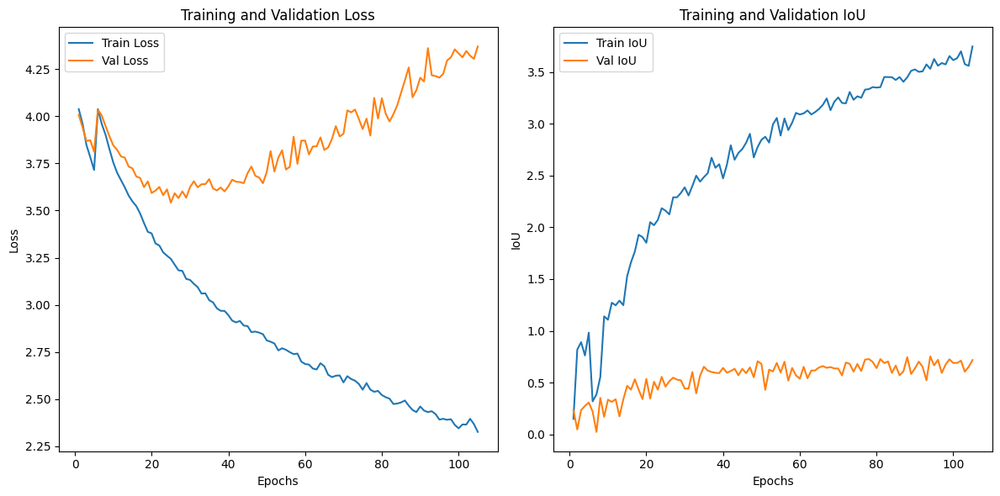

In [ ]:
plot_metrics(num_epochs=105, train_losses=train_losses, val_losses=val_losses, train_ious=train_ious, val_ious=val_ious)


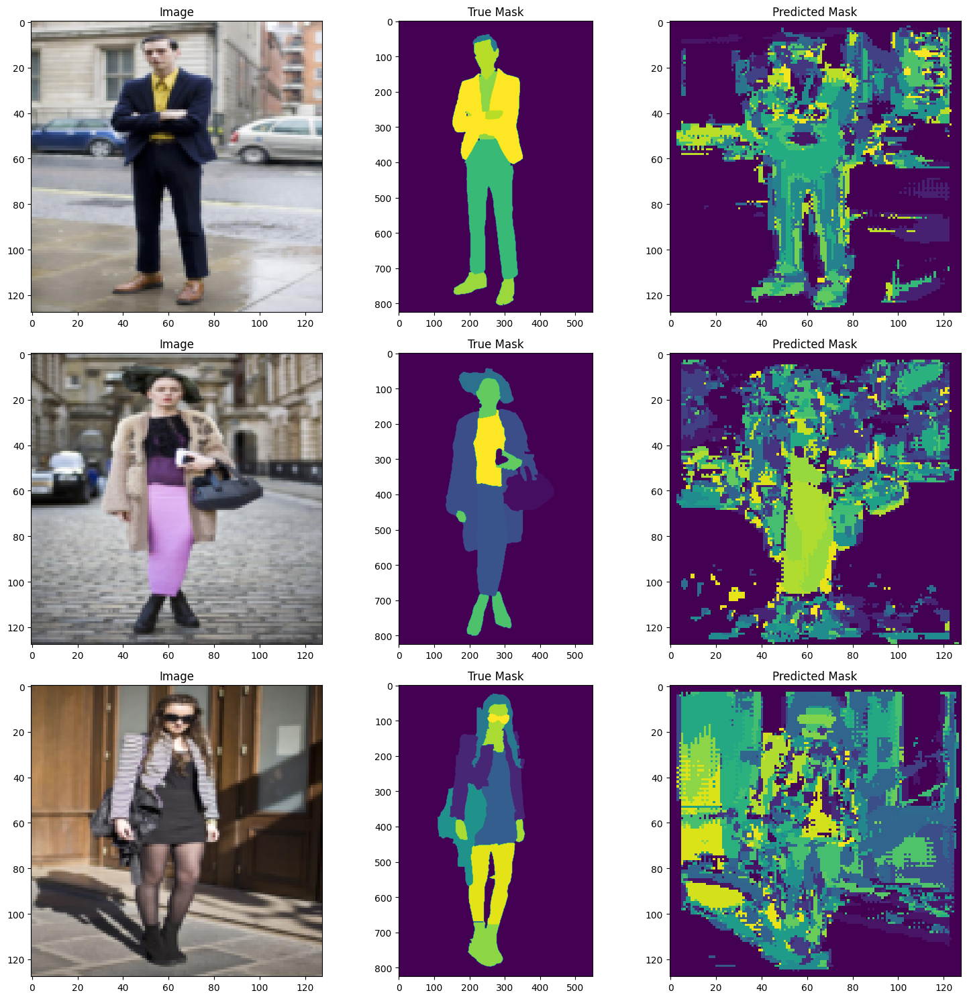

In [ ]:
# Отрисовка предсказаний
def plot_predictions(model, dataset, n_samples=3):
    model.eval()
    fig, axes = plt.subplots(n_samples, 3, figsize=(15, n_samples * 5))
    for i in range(n_samples):
        image, mask = dataset[i]
        image = image.cuda().unsqueeze(0)
        pred = torch.argmax(model(image), dim=1).cpu().squeeze()

        axes[i, 0].imshow(image.cpu().squeeze().permute(1, 2, 0))
        axes[i, 0].set_title("Image")
        axes[i, 1].imshow(mask.squeeze(), cmap="viridis")
        axes[i, 1].set_title("True Mask")
        axes[i, 2].imshow(pred, cmap="viridis")
        axes[i, 2].set_title("Predicted Mask")

    plt.tight_layout()
    plt.show()

plot_predictions(model, val_dataset)

3

In [ ]:
def iou(preds, masks, n_classes):
    """
    Вычисляет метрику IoU для сегментации пиксельных масок.

    :param preds: предсказания модели, тензор размера [batch_size, n_classes, H, W]
    :param masks: ground truth маски, тензор размера [batch_size, H, W]
    :param n_classes: количество классов
    :return: среднее значение IoU по всем классам
    """
    preds = torch.argmax(preds, dim=1)  # Получаем предсказания класса для каждого пикселя
    iou_per_class = []

    for cls in range(n_classes):
        pred_class = (preds == cls)  # Предсказания текущего класса
        mask_class = (masks == cls)  # Истинные значения текущего класса

        intersection = (pred_class & mask_class).sum().item()  # Пересечение
        union = (pred_class | mask_class).sum().item()  # Объединение

        if union == 0:  # Избегаем деления на ноль
            iou_per_class.append(0.0)
        else:
            iou_per_class.append(intersection / union)

    mean_iou = sum(iou_per_class) / len(iou_per_class)  # Среднее значение IoU по всем классам
    return mean_iou


In [ ]:
train_losses = []
train_ious = []
val_losses = []
val_ious = []

def train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=10):
    # Списки для хранения метрик

    for epoch in range(num_epochs):
        # Обучение
        model.train()
        train_loss = 0
        train_iou = 0

        for images, masks in tqdm(train_loader, desc=f"Epoch {epoch + 1}/{num_epochs}"):
            images, masks = images.to(device), masks.to(device)

            optimizer.zero_grad()
            outputs = model(images)

            masks = masks.squeeze(1)
            masks = F.interpolate(masks.unsqueeze(1).float(), size=outputs.shape[2:], mode="nearest").squeeze(1).long()

            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            train_iou += iou(outputs, masks, n_classes)

        # Валидация
        val_loss = 0
        val_iou = 0
        model.eval()
        with torch.no_grad():
            for images, masks in val_loader: #tqdm(val_loader):#, desc="Validation"):
                images, masks = images.to(device), masks.to(device)

                outputs = model(images)

                masks = masks.squeeze(1)
                masks = F.interpolate(masks.unsqueeze(1).float(), size=outputs.shape[2:], mode="nearest").squeeze(1).long()

                loss = criterion(outputs, masks)
                val_loss += loss.item()
                val_iou += iou(outputs, masks, n_classes)

        # Средние значения для метрик
        train_loss /= len(train_loader)
        train_iou /= len(train_loader)
        val_loss /= len(val_loader)
        val_iou /= len(val_loader)

        # Сохраняем метрики
        train_losses.append(train_loss)
        train_ious.append(train_iou)
        val_losses.append(val_loss)
        val_ious.append(val_iou)

        # Печать результатов
        #print(f"Epoch {epoch + 1}/{num_epochs}")
        print(f"Train Loss: {train_loss:.4f}, Train IoU: {train_iou:.4f}")
        print(f"Val Loss: {val_loss:.4f}, Val IoU: {val_iou:.4f}\n\n")

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Модель
n_classes = 59
num_epochs = 5
model = UNet(n_classes).to(device)
#model = model.cuda()

# Оптимизатор
optimizer = optim.Adam(model.parameters(), lr=0.001)

class_weights = calculate_class_weights(dataset, n_classes=n_classes).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights)

In [ ]:
train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=num_epochs)

Epoch 1/5: 100%|██████████| 100/100 [00:22<00:00,  4.51it/s]


Train Loss: 4.0445, Train IoU: 0.0044
Val Loss: 3.9866, Val IoU: 0.0134




Epoch 2/5: 100%|██████████| 100/100 [00:22<00:00,  4.51it/s]


Train Loss: 3.9657, Train IoU: 0.0047
Val Loss: 3.9701, Val IoU: 0.0078




Epoch 3/5: 100%|██████████| 100/100 [00:23<00:00,  4.33it/s]


Train Loss: 3.9200, Train IoU: 0.0088
Val Loss: 3.9466, Val IoU: 0.0093




Epoch 4/5: 100%|██████████| 100/100 [00:22<00:00,  4.52it/s]


Train Loss: 3.8485, Train IoU: 0.0082
Val Loss: 3.9174, Val IoU: 0.0083




Epoch 5/5: 100%|██████████| 100/100 [00:22<00:00,  4.52it/s]


Train Loss: 3.7745, Train IoU: 0.0078
Val Loss: 3.8387, Val IoU: 0.0050




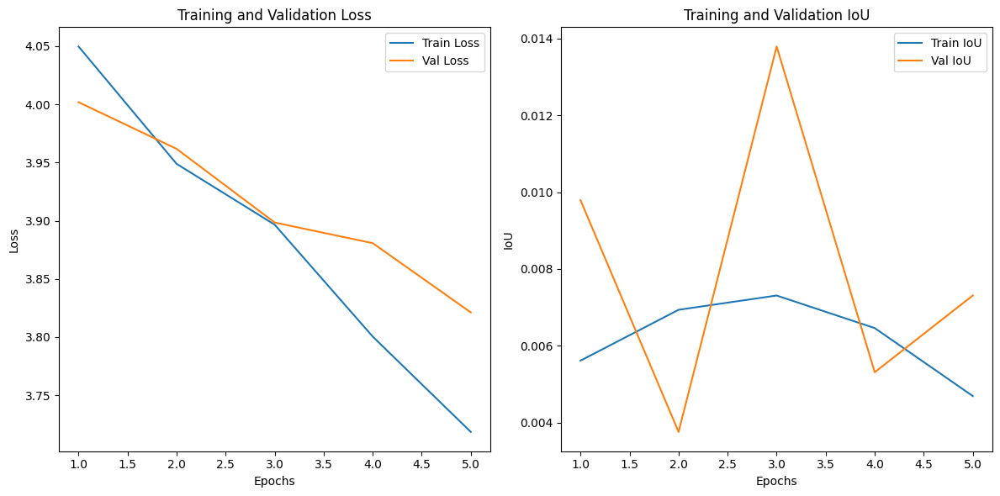

In [ ]:
plot_metrics(num_epochs=5, train_losses=train_losses, val_losses=val_losses, train_ious=train_ious, val_ious=val_ious)


#### неправильно:

In [ ]:
train_losses = []
train_ious = []
val_losses = []
val_ious = []

def train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=10):
    # Списки для хранения метрик

    for epoch in range(num_epochs):
        # Обучение
        model.train()
        train_loss = 0
        train_iou = 0

        for images, masks in tqdm(train_loader, desc=f"Epoch {epoch + 1}/{num_epochs}"):
            images, masks = images.to(device), masks.to(device)

            optimizer.zero_grad()
            outputs = model(images)

            masks = masks.squeeze(1)
            masks = F.interpolate(masks.unsqueeze(1).float(), size=outputs.shape[2:], mode="nearest").squeeze(1).long()

            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            train_iou += iou(outputs, masks, n_classes)

        # Валидация
        val_loss = 0
        val_iou = 0
        model.eval()
        with torch.no_grad():
            for images, masks in val_loader: #tqdm(val_loader):#, desc="Validation"):
                images, masks = images.to(device), masks.to(device)

                outputs = model(images)

                masks = masks.squeeze(1)
                masks = F.interpolate(masks.unsqueeze(1).float(), size=outputs.shape[2:], mode="nearest").squeeze(1).long()

                loss = criterion(outputs, masks)
                val_loss += loss.item()
                val_iou += iou(outputs, masks, n_classes)

        # Средние значения для метрик
        train_loss /= len(train_loader)
        train_iou /= len(train_loader)
        val_loss /= len(val_loader)
        val_iou /= len(val_loader)

        # Сохраняем метрики
        train_losses.append(train_loss)
        train_ious.append(train_iou)
        val_losses.append(val_loss)
        val_ious.append(val_iou)

        # Печать результатов
        #print(f"Epoch {epoch + 1}/{num_epochs}")
        print(f"Train Loss: {train_loss:.4f}, Train IoU: {train_iou:.4f}")
        print(f"Val Loss: {val_loss:.4f}, Val IoU: {val_iou:.4f}\n\n")

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Модель
n_classes = 59
model = UNet(n_classes).to(device)
#model = model.cuda()

# Оптимизатор
optimizer = optim.Adam(model.parameters(), lr=0.001)

class_weights = calculate_class_weights(dataset, n_classes=n_classes).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights)

In [ ]:
train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=20)

Epoch 1/20: 100%|██████████| 100/100 [00:30<00:00,  3.25it/s]


Train Loss: 4.1785, Train IoU: 0.0002
Val Loss: 4.0481, Val IoU: 0.0001




Epoch 2/20: 100%|██████████| 100/100 [00:31<00:00,  3.22it/s]


Train Loss: 4.0263, Train IoU: 0.0002
Val Loss: 4.0427, Val IoU: 0.0001




Epoch 3/20: 100%|██████████| 100/100 [00:30<00:00,  3.23it/s]


Train Loss: 4.0137, Train IoU: 0.0002
Val Loss: 4.0257, Val IoU: 0.0001




Epoch 4/20: 100%|██████████| 100/100 [00:31<00:00,  3.20it/s]


Train Loss: 3.9943, Train IoU: 0.0005
Val Loss: 4.0107, Val IoU: 0.0004




Epoch 5/20: 100%|██████████| 100/100 [00:30<00:00,  3.23it/s]


Train Loss: 3.9676, Train IoU: 0.0010
Val Loss: 3.9646, Val IoU: 0.0015




Epoch 6/20: 100%|██████████| 100/100 [00:31<00:00,  3.22it/s]


Train Loss: 3.9304, Train IoU: 0.0060
Val Loss: 3.9843, Val IoU: 0.0011




Epoch 7/20: 100%|██████████| 100/100 [00:30<00:00,  3.24it/s]


Train Loss: 3.9055, Train IoU: 0.0076
Val Loss: 3.9880, Val IoU: 0.0014




Epoch 8/20: 100%|██████████| 100/100 [00:30<00:00,  3.25it/s]


Train Loss: 3.8896, Train IoU: 0.0077
Val Loss: 3.9885, Val IoU: 0.0008




Epoch 9/20: 100%|██████████| 100/100 [00:30<00:00,  3.25it/s]


Train Loss: 3.8795, Train IoU: 0.0041
Val Loss: 3.9904, Val IoU: 0.0103




Epoch 10/20: 100%|██████████| 100/100 [00:30<00:00,  3.28it/s]


Train Loss: 6.7022, Train IoU: 0.0055
Val Loss: 6.2137, Val IoU: 0.0001




Epoch 11/20: 100%|██████████| 100/100 [00:30<00:00,  3.27it/s]


Train Loss: 4.5766, Train IoU: 0.0005
Val Loss: 4.0339, Val IoU: 0.0002




Epoch 12/20: 100%|██████████| 100/100 [00:30<00:00,  3.30it/s]


Train Loss: 4.0223, Train IoU: 0.0001
Val Loss: 4.0182, Val IoU: 0.0000




Epoch 13/20: 100%|██████████| 100/100 [00:30<00:00,  3.30it/s]


Train Loss: 4.0033, Train IoU: 0.0000
Val Loss: 4.0140, Val IoU: 0.0000




Epoch 14/20: 100%|██████████| 100/100 [00:30<00:00,  3.23it/s]


Train Loss: 3.9981, Train IoU: 0.0000
Val Loss: 4.0132, Val IoU: 0.0000




Epoch 15/20: 100%|██████████| 100/100 [00:30<00:00,  3.29it/s]


Train Loss: 3.9961, Train IoU: 0.0000
Val Loss: 4.0160, Val IoU: 0.0000




Epoch 16/20: 100%|██████████| 100/100 [00:30<00:00,  3.27it/s]


Train Loss: 3.9876, Train IoU: 0.0000
Val Loss: 4.0187, Val IoU: 0.0000




Epoch 17/20: 100%|██████████| 100/100 [00:30<00:00,  3.24it/s]


Train Loss: 3.9874, Train IoU: 0.0001
Val Loss: 4.0224, Val IoU: 0.0001




Epoch 18/20: 100%|██████████| 100/100 [00:30<00:00,  3.24it/s]


Train Loss: 3.9890, Train IoU: 0.0001
Val Loss: 4.0225, Val IoU: 0.0001




Epoch 19/20: 100%|██████████| 100/100 [00:30<00:00,  3.25it/s]


Train Loss: 3.9934, Train IoU: 0.0001
Val Loss: 4.0237, Val IoU: 0.0001




Epoch 20/20: 100%|██████████| 100/100 [00:30<00:00,  3.27it/s]


Train Loss: 3.9860, Train IoU: 0.0001
Val Loss: 4.0262, Val IoU: 0.0001




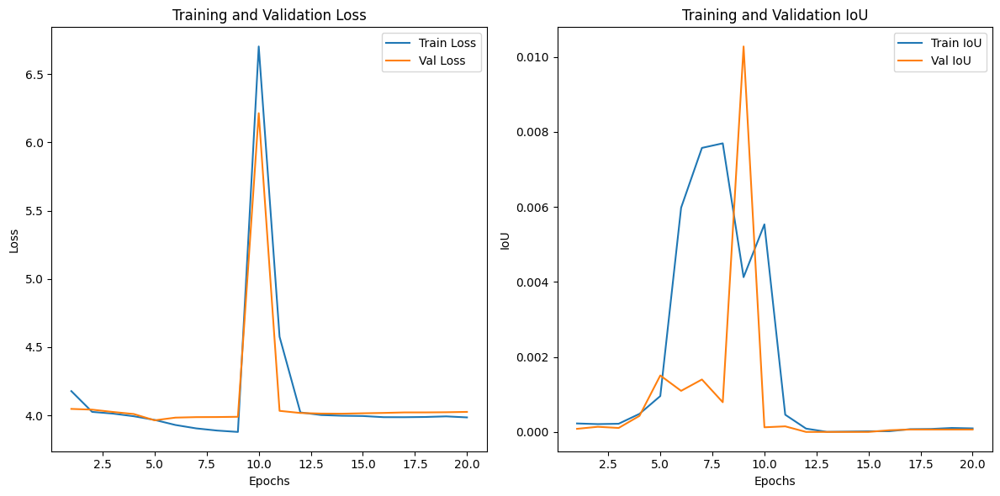

In [ ]:

plot_metrics(num_epochs=20, train_losses=train_losses, val_losses=val_losses, train_ious=train_ious, val_ious=val_ious)


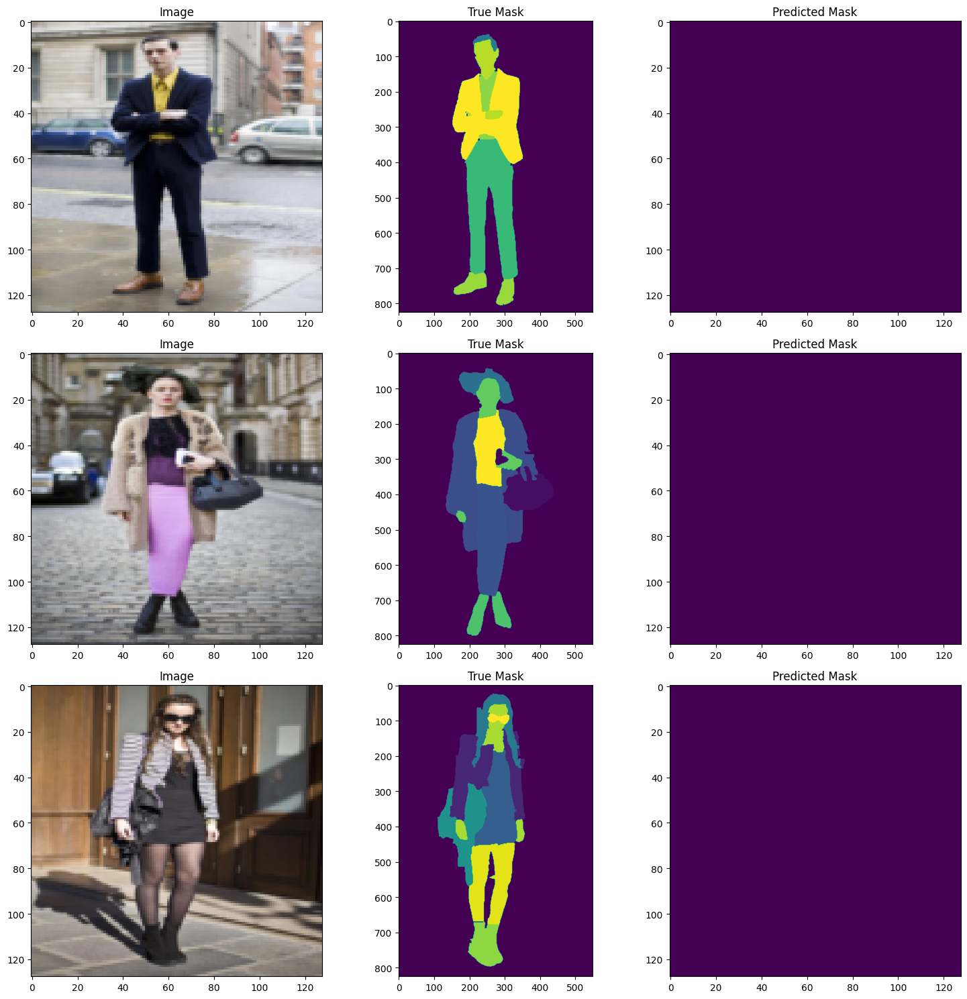

In [ ]:
# Отрисовка предсказаний
def plot_predictions(model, dataset, n_samples=3):
    model.eval()
    fig, axes = plt.subplots(n_samples, 3, figsize=(15, n_samples * 5))
    for i in range(n_samples):
        image, mask = dataset[i]
        image = image.cuda().unsqueeze(0)
        pred = torch.argmax(model(image), dim=1).cpu().squeeze()

        axes[i, 0].imshow(image.cpu().squeeze().permute(1, 2, 0))
        axes[i, 0].set_title("Image")
        axes[i, 1].imshow(mask.squeeze(), cmap="viridis")
        axes[i, 1].set_title("True Mask")
        axes[i, 2].imshow(pred, cmap="viridis")
        axes[i, 2].set_title("Predicted Mask")

    plt.tight_layout()
    plt.show()

plot_predictions(model, val_dataset)

#### Обучение 1:

In [ ]:
import torch
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, Subset, random_split
from torchvision import transforms
import torch.optim as optim
import torch.nn as nn
from tqdm import tqdm

'''
# Разделяем данные на train и val
all_indices = list(range(len(dataset)))
train_indices, val_indices = train_test_split(all_indices, test_size=0.2, random_state=42)

train_dataset = Subset(dataset, train_indices)
val_dataset = Subset(dataset, val_indices)

'''

# 1. Настройка датасета с уменьшением размера изображений
image_transforms = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
])

mask_transforms = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor()
])

dataset = ClothesSegmentationDataset(
    image_dir=train_dataset_path,
    mask_dir=val_dataset_path,
    image_transforms=image_transforms,
    mask_transforms=None  # Маски не нормализуются
)

# 2. Разделение на обучающую и валидационную выборку
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=8)


In [ ]:
import torch.nn.functional as F

# Взвешенный кросс-энтропийный лосс
def calculate_class_weights(dataset, n_classes):
    total_counts = torch.zeros(n_classes)
    for _, mask in dataset:
        unique, counts = torch.unique(mask, return_counts=True)
        for cls, count in zip(unique, counts):
            total_counts[cls] += count
    weights = 1.0 / (total_counts + 1e-5)  # Добавляем небольшую константу, чтобы избежать деления на 0
    return weights

# Метрика IoU
def iou(preds, masks, n_classes):
    preds = torch.argmax(preds, dim=1)
    intersection = torch.zeros(n_classes)
    union = torch.zeros(n_classes)

    for cls in range(n_classes):
        pred_class = (preds == cls)
        mask_class = (masks == cls)
        intersection[cls] += (pred_class & mask_class).sum().item()
        union[cls] += (pred_class | mask_class).sum().item()

    iou_per_class = intersection / (union + 1e-5)
    return iou_per_class.mean().item()


def train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=10):
    for epoch in range(num_epochs):
        # Обучение
        model.train()
        train_loss = 0
        train_iou = 0

        for images, masks in tqdm(train_loader, desc=f"Training Epoch {epoch + 1}/{num_epochs}"):
            images, masks = images.to(device), masks.to(device)

            optimizer.zero_grad()
            outputs = model(images)

            masks = masks.squeeze(1)
            masks = F.interpolate(masks.unsqueeze(1).float(), size=outputs.shape[2:], mode="nearest").squeeze(1).long()


            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            train_iou += iou(outputs, masks, n_classes)  # Функция IoU должна быть определена

        # Валидация
        val_loss = 0
        val_iou = 0
        model.eval()
        with torch.no_grad():
            for images, masks in tqdm(val_loader, desc="Validation"):
                images, masks = images.to(device), masks.to(device)

                outputs = model(images)

                masks = masks.squeeze(1)
                masks = F.interpolate(masks.unsqueeze(1).float(), size=outputs.shape[2:], mode="nearest").squeeze(1).long()


                loss = criterion(outputs, masks)
                val_loss += loss.item()
                val_iou += iou(outputs, masks, n_classes)

        # Печать результатов
        print(f"Epoch {epoch + 1}/{num_epochs}")
        print(f"Train Loss: {train_loss / len(train_loader):.4f}, Train IoU: {train_iou / len(train_loader):.4f}")
        print(f"Val Loss: {val_loss / len(val_loader):.4f}, Val IoU: {val_iou / len(val_loader):.4f}")

In [ ]:
train_losses = []
train_ious = []
val_losses = []
val_ious = []

def train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=10):
    # Списки для хранения метрик

    for epoch in range(num_epochs):
        # Обучение
        model.train()
        train_loss = 0
        train_iou = 0

        for images, masks in tqdm(train_loader, desc=f"Epoch {epoch + 1}/{num_epochs}"):
            images, masks = images.to(device), masks.to(device)

            optimizer.zero_grad()
            outputs = model(images)

            masks = masks.squeeze(1)
            masks = F.interpolate(masks.unsqueeze(1).float(), size=outputs.shape[2:], mode="nearest").squeeze(1).long()

            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            train_iou += iou(outputs, masks, n_classes)

        # Валидация
        val_loss = 0
        val_iou = 0
        model.eval()
        with torch.no_grad():
            for images, masks in val_loader: #tqdm(val_loader):#, desc="Validation"):
                images, masks = images.to(device), masks.to(device)

                outputs = model(images)

                masks = masks.squeeze(1)
                masks = F.interpolate(masks.unsqueeze(1).float(), size=outputs.shape[2:], mode="nearest").squeeze(1).long()

                loss = criterion(outputs, masks)
                val_loss += loss.item()
                val_iou += iou(outputs, masks, n_classes)

        # Средние значения для метрик
        train_loss /= len(train_loader)
        train_iou /= len(train_loader)
        val_loss /= len(val_loader)
        val_iou /= len(val_loader)

        # Сохраняем метрики
        train_losses.append(train_loss)
        train_ious.append(train_iou)
        val_losses.append(val_loss)
        val_ious.append(val_iou)

        # Печать результатов
        #print(f"Epoch {epoch + 1}/{num_epochs}")
        print(f"Train Loss: {train_loss:.4f}, Train IoU: {train_iou:.4f}")
        print(f"Val Loss: {val_loss:.4f}, Val IoU: {val_iou:.4f}\n\n")

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Модель
n_classes = 59
model = UNet(n_classes).to(device)
#model = model.cuda()

# Оптимизатор
optimizer = optim.Adam(model.parameters(), lr=0.001)

class_weights = calculate_class_weights(dataset, n_classes=n_classes).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights)

In [ ]:
train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=10)

Epoch 1/10: 100%|██████████| 100/100 [00:23<00:00,  4.26it/s]


Train Loss: 4.0535, Train IoU: 0.0036
Val Loss: 3.9806, Val IoU: 0.0131




Epoch 2/10: 100%|██████████| 100/100 [00:22<00:00,  4.44it/s]


Train Loss: 3.9688, Train IoU: 0.0053
Val Loss: 3.8839, Val IoU: 0.0142




Epoch 3/10: 100%|██████████| 100/100 [00:22<00:00,  4.46it/s]


Train Loss: 3.8691, Train IoU: 0.0083
Val Loss: 3.8008, Val IoU: 0.0034




Epoch 4/10: 100%|██████████| 100/100 [00:23<00:00,  4.26it/s]


Train Loss: 3.7707, Train IoU: 0.0078
Val Loss: 3.7238, Val IoU: 0.0079




Epoch 5/10: 100%|██████████| 100/100 [00:22<00:00,  4.54it/s]


Train Loss: 3.7125, Train IoU: 0.0091
Val Loss: 3.7179, Val IoU: 0.0101




Epoch 6/10: 100%|██████████| 100/100 [00:22<00:00,  4.47it/s]


Train Loss: 3.6512, Train IoU: 0.0100
Val Loss: 3.6528, Val IoU: 0.0135




Epoch 7/10: 100%|██████████| 100/100 [00:22<00:00,  4.39it/s]


Train Loss: 3.6271, Train IoU: 0.0124
Val Loss: 3.6285, Val IoU: 0.0152




Epoch 8/10: 100%|██████████| 100/100 [00:22<00:00,  4.41it/s]


Train Loss: 3.5840, Train IoU: 0.0142
Val Loss: 3.6053, Val IoU: 0.0132




Epoch 9/10: 100%|██████████| 100/100 [00:22<00:00,  4.43it/s]


Train Loss: 3.5367, Train IoU: 0.0161
Val Loss: 3.5656, Val IoU: 0.0156




Epoch 10/10: 100%|██████████| 100/100 [00:23<00:00,  4.31it/s]


Train Loss: 3.4922, Train IoU: 0.0167
Val Loss: 3.5553, Val IoU: 0.0184




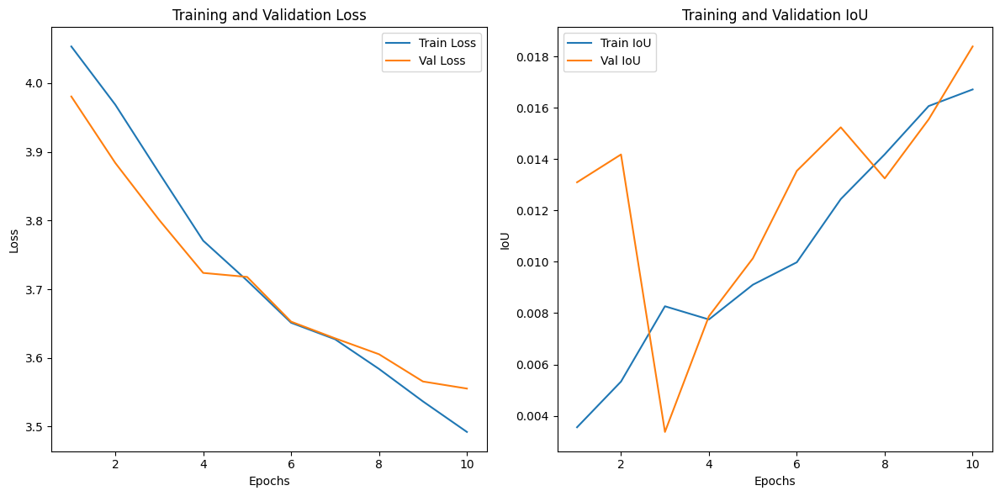

In [ ]:
def plot_metrics(num_epochs, train_losses, val_losses, train_ious, val_ious):
    """Функция для построения графиков потерь и IoU."""
    plt.figure(figsize=(12, 6))

    # График потерь
    plt.subplot(1, 2, 1)
    plt.plot(range(1, num_epochs + 1), train_losses, label="Train Loss")
    plt.plot(range(1, num_epochs + 1), val_losses, label="Val Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Training and Validation Loss")
    plt.legend()

    # График IoU
    plt.subplot(1, 2, 2)
    plt.plot(range(1, num_epochs + 1), train_ious, label="Train IoU")
    plt.plot(range(1, num_epochs + 1), val_ious, label="Val IoU")
    plt.xlabel("Epochs")
    plt.ylabel("IoU")
    plt.title("Training and Validation IoU")
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_metrics(num_epochs=10, train_losses=train_losses, val_losses=val_losses, train_ious=train_ious, val_ious=val_ious)


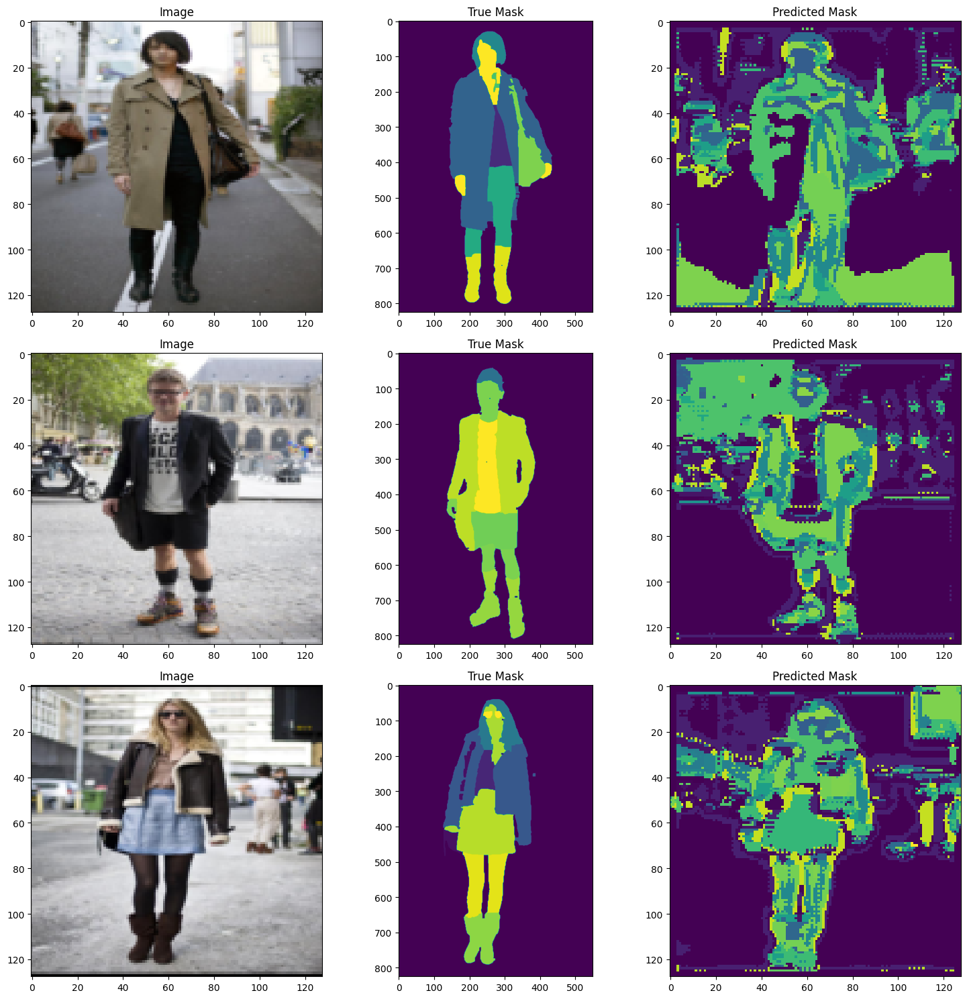

In [ ]:
# Отрисовка предсказаний
def plot_predictions(model, dataset, n_samples=3):
    model.eval()
    fig, axes = plt.subplots(n_samples, 3, figsize=(15, n_samples * 5))
    for i in range(n_samples):
        image, mask = dataset[i]
        image = image.cuda().unsqueeze(0)
        pred = torch.argmax(model(image), dim=1).cpu().squeeze()

        axes[i, 0].imshow(image.cpu().squeeze().permute(1, 2, 0))
        axes[i, 0].set_title("Image")
        axes[i, 1].imshow(mask.squeeze(), cmap="viridis")
        axes[i, 1].set_title("True Mask")
        axes[i, 2].imshow(pred, cmap="viridis")
        axes[i, 2].set_title("Predicted Mask")

    plt.tight_layout()
    plt.show()

plot_predictions(model, val_dataset)

#### Обучение 2:

In [ ]:
import torch
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, Subset, random_split
from torchvision import transforms
import torch.optim as optim
import torch.nn as nn
from tqdm import tqdm

'''
# Разделяем данные на train и val
all_indices = list(range(len(dataset)))
train_indices, val_indices = train_test_split(all_indices, test_size=0.2, random_state=42)

train_dataset = Subset(dataset, train_indices)
val_dataset = Subset(dataset, val_indices)

'''

# 1. Настройка датасета с уменьшением размера изображений
image_transforms = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
])

mask_transforms = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor()
])

dataset = ClothesSegmentationDataset(
    image_dir=train_dataset_path,
    mask_dir=val_dataset_path,
    image_transforms=image_transforms,
    mask_transforms=None  # Маски не нормализуются
)

# 2. Разделение на обучающую и валидационную выборку
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=8)


In [ ]:
import torch.nn.functional as F

# Взвешенный кросс-энтропийный лосс
def calculate_class_weights(dataset, n_classes):
    """Подсчет весов классов для компенсации несбалансированности."""
    total_counts = torch.zeros(n_classes)
    for _, mask in dataset:
        unique, counts = torch.unique(mask, return_counts=True)
        for cls, count in zip(unique, counts):
            total_counts[cls] += count
    weights = 1.0 / (total_counts + 1e-5)  # Добавляем небольшую константу, чтобы избежать деления на 0
    return weights

# Метрика IoU с процентами
def iou(preds, masks, n_classes):
    """
    Вычисление IoU (Intersection over Union) вручную.
    preds: предсказания модели (логиты, размер B x C x H x W).
    masks: истинные маски (размер B x H x W).
    n_classes: количество классов.
    """
    preds = torch.argmax(preds, dim=1)  # Преобразование логитов в классы
    intersection = torch.zeros(n_classes).to(preds.device)
    union = torch.zeros(n_classes).to(preds.device)

    for cls in range(n_classes):
        pred_class = (preds == cls)
        mask_class = (masks == cls)
        intersection[cls] += (pred_class & mask_class).sum().float()
        union[cls] += (pred_class | mask_class).sum().float()

    iou_per_class = intersection / (union + 1e-6)  # Избегаем деления на 0
    mean_iou = iou_per_class.mean().item() * 100  # Умножаем на 100 для процентов
    return mean_iou

# Использование в коде:
# train_iou += iou(outputs, masks, n_classes)
# val_iou += iou(outputs, masks, n_classes)

from torchmetrics.classification import MulticlassJaccardIndex

# Инициализация IoU (Jaccard Index)
iou_metric = MulticlassJaccardIndex(num_classes=n_classes).to(device)

# В цикле обучения:
#train_iou += iou_metric(outputs.softmax(dim=1), masks)
#val_iou += iou_metric(outputs.softmax(dim=1), masks)


In [ ]:
train_losses = []
train_ious = []
val_losses = []
val_ious = []

def train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=10):
    # Списки для хранения метрик

    for epoch in range(num_epochs):
        # Обучение
        model.train()
        train_loss = 0
        train_iou = 0

        for images, masks in tqdm(train_loader, desc=f"Epoch {epoch + 1}/{num_epochs}"):
            images, masks = images.to(device), masks.to(device)

            optimizer.zero_grad()
            outputs = model(images)

            masks = masks.squeeze(1)
            masks = F.interpolate(masks.unsqueeze(1).float(), size=outputs.shape[2:], mode="nearest").squeeze(1).long()

            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            #train_iou += iou(outputs, masks, n_classes)
            train_iou += iou_metric(outputs.softmax(dim=1), masks)

        # Валидация
        val_loss = 0
        val_iou = 0
        model.eval()
        with torch.no_grad():
            for images, masks in val_loader: #tqdm(val_loader):#, desc="Validation"):
                images, masks = images.to(device), masks.to(device)

                outputs = model(images)

                masks = masks.squeeze(1)
                masks = F.interpolate(masks.unsqueeze(1).float(), size=outputs.shape[2:], mode="nearest").squeeze(1).long()

                loss = criterion(outputs, masks)
                val_loss += loss.item()
                #val_iou += iou(outputs, masks, n_classes)
                val_iou += iou_metric(outputs.softmax(dim=1), masks)

        # Средние значения для метрик
        train_loss /= len(train_loader)
        #train_iou /= len(train_loader)
        val_loss /= len(val_loader)
        #val_iou /= len(val_loader)

        # Сохраняем метрики
        train_losses.append(train_loss)
        train_ious.append(train_iou)
        val_losses.append(val_loss)
        val_ious.append(val_iou)

        # Печать результатов
        #print(f"Epoch {epoch + 1}/{num_epochs}")
        print(f"Train Loss: {train_loss:.4f}, Train IoU: {train_iou*100:.4f}%")
        print(f"Val Loss: {val_loss:.4f}, Val IoU: {val_iou*100:.4f}%\n\n")

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Модель
n_classes = 59
model = UNet(n_classes).to(device)
#model = model.cuda()

# Оптимизатор
optimizer = optim.Adam(model.parameters(), lr=0.001)

class_weights = calculate_class_weights(dataset, n_classes=n_classes).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights)

In [ ]:
train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=10)

Epoch 1/10: 100%|██████████| 100/100 [00:30<00:00,  3.26it/s]


Train Loss: 4.0764, Train IoU: 2.2238%
Val Loss: 4.0353, Val IoU: 1.2074%




Epoch 2/10: 100%|██████████| 100/100 [00:29<00:00,  3.34it/s]


Train Loss: 4.0389, Train IoU: 59.0657%
Val Loss: 4.0048, Val IoU: 0.3310%




Epoch 3/10: 100%|██████████| 100/100 [00:29<00:00,  3.35it/s]


Train Loss: 4.0183, Train IoU: 3.5543%
Val Loss: 3.9913, Val IoU: 0.9734%




Epoch 4/10: 100%|██████████| 100/100 [00:29<00:00,  3.34it/s]


Train Loss: 3.9883, Train IoU: 71.2844%
Val Loss: 3.9374, Val IoU: 40.1829%




Epoch 5/10: 100%|██████████| 100/100 [00:29<00:00,  3.34it/s]


Train Loss: 3.9443, Train IoU: 88.3904%
Val Loss: 3.9566, Val IoU: 16.4987%




Epoch 6/10: 100%|██████████| 100/100 [00:31<00:00,  3.19it/s]


Train Loss: 3.9105, Train IoU: 112.0146%
Val Loss: 3.9254, Val IoU: 4.5609%




Epoch 7/10: 100%|██████████| 100/100 [00:30<00:00,  3.31it/s]


Train Loss: 3.9030, Train IoU: 79.7204%
Val Loss: 3.9060, Val IoU: 54.8840%




Epoch 8/10: 100%|██████████| 100/100 [00:29<00:00,  3.37it/s]


Train Loss: 3.8877, Train IoU: 116.7449%
Val Loss: 3.9153, Val IoU: 45.0183%




Epoch 9/10: 100%|██████████| 100/100 [00:29<00:00,  3.36it/s]


Train Loss: 3.8761, Train IoU: 150.1839%
Val Loss: 3.9172, Val IoU: 3.7856%




Epoch 10/10: 100%|██████████| 100/100 [00:30<00:00,  3.27it/s]


Train Loss: 3.8528, Train IoU: 121.0419%
Val Loss: 3.8702, Val IoU: 33.6541%




In [ ]:
def calculate_iou(preds, masks, n_classes):
    """
    Ручной расчет IoU (Intersection over Union).
    preds: предсказания модели (логиты, размер B x C x H x W).
    masks: истинные маски (размер B x H x W).
    n_classes: количество классов.
    """
    preds = torch.argmax(preds, dim=1)  # Преобразуем логиты в индексы классов
    iou_per_class = []

    for cls in range(n_classes):
        pred_class = (preds == cls)
        mask_class = (masks == cls)

        intersection = (pred_class & mask_class).sum().float()
        union = (pred_class | mask_class).sum().float()

        if union == 0:
            iou_per_class.append(torch.tensor(0.0).to(preds.device))
        else:
            iou_per_class.append(intersection / union)

    mean_iou = torch.mean(torch.stack(iou_per_class)).item() * 100  # Среднее IoU
    return mean_iou

def train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=10):
    for epoch in range(num_epochs):
        # Обучение
        model.train()
        train_loss = 0
        train_iou = 0

        for images, masks in tqdm(train_loader, desc=f"Epoch {epoch + 1}/{num_epochs}"):
            images, masks = images.to(device), masks.to(device)

            optimizer.zero_grad()
            outputs = model(images)

            masks = masks.squeeze(1)
            masks = F.interpolate(masks.unsqueeze(1).float(), size=outputs.shape[2:], mode="nearest").squeeze(1).long()

            # Лосс
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            train_iou += calculate_iou(outputs, masks, n_classes)

        train_loss /= len(train_loader)
        train_iou /= len(train_loader)

        # Валидация
        val_loss = 0
        val_iou = 0
        model.eval()
        with torch.no_grad():
            for images, masks in val_loader:
                images, masks = images.to(device), masks.to(device)

                outputs = model(images)

                masks = masks.squeeze(1)
                masks = F.interpolate(masks.unsqueeze(1).float(), size=outputs.shape[2:], mode="nearest").squeeze(1).long()

                # Лосс
                loss = criterion(outputs, masks)
                val_loss += loss.item()
                val_iou += calculate_iou(outputs, masks, n_classes)

        val_loss /= len(val_loader)
        val_iou /= len(val_loader)

        # Печать результатов
        print(f"Epoch {epoch + 1}/{num_epochs}")
        print(f"Train Loss: {train_loss:.4f}, Train IoU: {train_iou:.2f}%")
        print(f"Val Loss: {val_loss:.4f}, Val IoU: {val_iou:.2f}%\n")


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Модель
n_classes = 59
model = UNet(n_classes).to(device)
#model = model.cuda()

# Оптимизатор
optimizer = optim.Adam(model.parameters(), lr=0.001)

class_weights = calculate_class_weights(dataset, n_classes=n_classes).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights)

In [ ]:
train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=10)

Epoch 1/10: 100%|██████████| 100/100 [00:31<00:00,  3.17it/s]


Epoch 1/10
Train Loss: 4.0664, Train IoU: 0.02%
Val Loss: 4.0152, Val IoU: 0.26%



Epoch 2/10: 100%|██████████| 100/100 [00:30<00:00,  3.23it/s]


Epoch 2/10
Train Loss: 5.5262, Train IoU: 0.20%
Val Loss: 4.0059, Val IoU: 0.01%



Epoch 3/10: 100%|██████████| 100/100 [00:30<00:00,  3.25it/s]


Epoch 3/10
Train Loss: 4.0066, Train IoU: 0.10%
Val Loss: 3.9725, Val IoU: 0.21%



Epoch 4/10: 100%|██████████| 100/100 [00:31<00:00,  3.21it/s]


Epoch 4/10
Train Loss: 3.9728, Train IoU: 0.28%
Val Loss: 3.9619, Val IoU: 0.15%



Epoch 5/10: 100%|██████████| 100/100 [00:30<00:00,  3.25it/s]


Epoch 5/10
Train Loss: 3.9365, Train IoU: 0.18%
Val Loss: 3.9414, Val IoU: 0.24%



Epoch 6/10: 100%|██████████| 100/100 [00:30<00:00,  3.27it/s]


Epoch 6/10
Train Loss: 3.9081, Train IoU: 0.55%
Val Loss: 3.9377, Val IoU: 0.26%



Epoch 7/10: 100%|██████████| 100/100 [00:30<00:00,  3.24it/s]


Epoch 7/10
Train Loss: 3.9112, Train IoU: 0.25%
Val Loss: 3.9438, Val IoU: 0.71%



Epoch 8/10: 100%|██████████| 100/100 [00:31<00:00,  3.21it/s]


Epoch 8/10
Train Loss: 3.8983, Train IoU: 0.46%
Val Loss: 3.9327, Val IoU: 1.23%



Epoch 9/10: 100%|██████████| 100/100 [00:31<00:00,  3.22it/s]


Epoch 9/10
Train Loss: 3.8818, Train IoU: 1.06%
Val Loss: 3.8961, Val IoU: 0.26%



Epoch 10/10: 100%|██████████| 100/100 [00:33<00:00,  3.01it/s]


Epoch 10/10
Train Loss: 3.8684, Train IoU: 0.44%
Val Loss: 3.8967, Val IoU: 0.49%



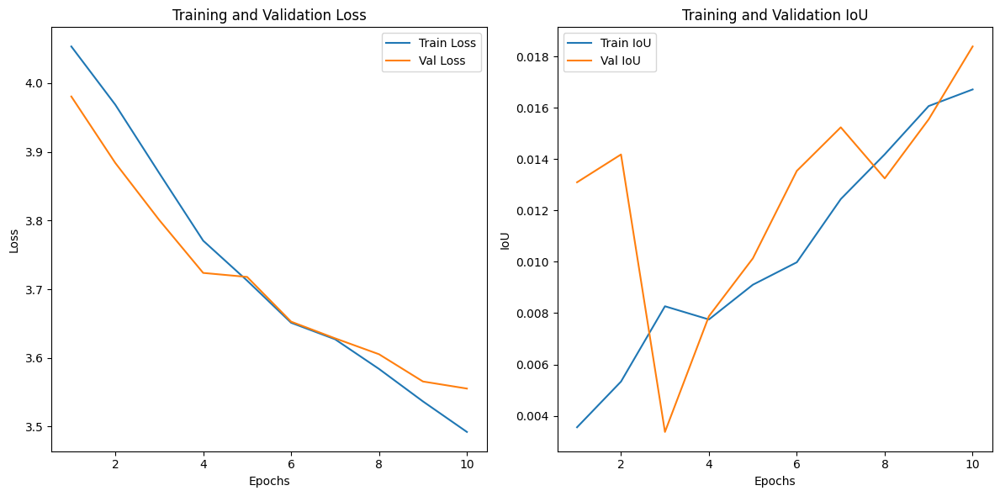

In [ ]:
def plot_metrics(num_epochs, train_losses, val_losses, train_ious, val_ious):
    """Функция для построения графиков потерь и IoU."""
    plt.figure(figsize=(12, 6))

    # График потерь
    plt.subplot(1, 2, 1)
    plt.plot(range(1, num_epochs + 1), train_losses, label="Train Loss")
    plt.plot(range(1, num_epochs + 1), val_losses, label="Val Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Training and Validation Loss")
    plt.legend()

    # График IoU
    plt.subplot(1, 2, 2)
    plt.plot(range(1, num_epochs + 1), train_ious*100, label="Train IoU")
    plt.plot(range(1, num_epochs + 1), val_ious*100, label="Val IoU")
    plt.xlabel("Epochs")
    plt.ylabel("IoU")
    plt.title("Training and Validation IoU")
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_metrics(num_epochs=10, train_losses=train_losses, val_losses=val_losses, train_ious=train_ious, val_ious=val_ious)


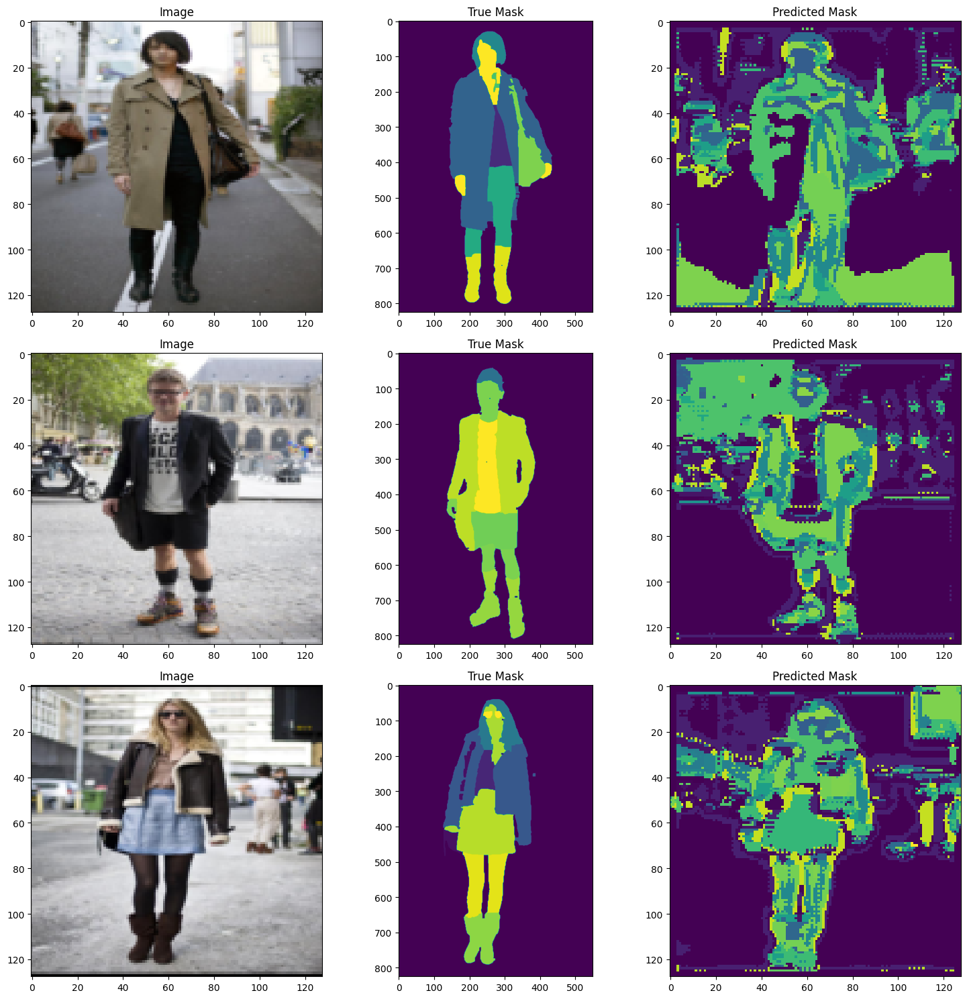

In [ ]:
# Отрисовка предсказаний
def plot_predictions(model, dataset, n_samples=3):
    model.eval()
    fig, axes = plt.subplots(n_samples, 3, figsize=(15, n_samples * 5))
    for i in range(n_samples):
        image, mask = dataset[i]
        image = image.cuda().unsqueeze(0)
        pred = torch.argmax(model(image), dim=1).cpu().squeeze()

        axes[i, 0].imshow(image.cpu().squeeze().permute(1, 2, 0))
        axes[i, 0].set_title("Image")
        axes[i, 1].imshow(mask.squeeze(), cmap="viridis")
        axes[i, 1].set_title("True Mask")
        axes[i, 2].imshow(pred, cmap="viridis")
        axes[i, 2].set_title("Predicted Mask")

    plt.tight_layout()
    plt.show()

plot_predictions(model, val_dataset)

<p class="task" id="5"></p>

#### 5\.  Обучите модуль `SegformerForSemanticSegmentation` из пакета `transformers` для сегментации изображения. Во время обучения выводите на экран значения функции потерь и точности прогнозов на обучающем и валидационном множестве. Для оптимизации используйте значение функции потерь, которое возвращает вам модель.

Используя обученную модель, получите предсказания для нескольких изображений и отрисуйте их.
- [ ] Проверено на семинаре

#### Обучение 1:

In [ ]:

# Инициализация устройства
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Загрузка модели и процессора
n_classes = 59  # Укажите количество классов (например, 20 для ADE20k)
model = SegformerForSemanticSegmentation.from_pretrained(
    "nvidia/segformer-b0-finetuned-ade-512-512",
    num_labels=n_classes,
    ignore_mismatched_sizes=True
).to(device)

processor = SegformerImageProcessor.from_pretrained("nvidia/segformer-b0-finetuned-ade-512-512")

# Преобразование для модели Segformer
def preprocess_image(image):
    """
    Преобразование изображения в формат, подходящий для Segformer.
    """
    return processor(image, return_tensors="pt").pixel_values[0]

# Обновление DataLoader для обработки изображений
class SegformerDataset(torch.utils.data.Dataset):
    def __init__(self, dataset, processor, transform=None):
        self.dataset = dataset
        self.processor = processor
        self.transform = transform

    def __getitem__(self, idx):
        image, mask = self.dataset[idx]
        if self.transform:
            image = self.transform(image)
        image = self.processor(image, return_tensors="pt").pixel_values.squeeze(0)
        return image, mask

    def __len__(self):
        return len(self.dataset)

# Создание DataLoader'ов
train_dataset_segformer = SegformerDataset(train_dataset, processor)#, transform=transform)
val_dataset_segformer = SegformerDataset(val_dataset, processor)#, transform=transform)

train_loader = DataLoader(train_dataset_segformer, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset_segformer, batch_size=8, shuffle=False)

# Оптимизатор и функция потерь
class_weights = torch.tensor([1.0] * n_classes).to(device)  # Задайте веса классов, если необходимо
loss_fn = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.AdamW(model.parameters(), lr=1e-4)

train_losses = []
val_losses = []
train_ious = []
val_ious = []

# Используем функцию train_model
def train_model_segformer(model, criterion, optimizer, train_loader, val_loader, num_epochs=10):
    for epoch in range(num_epochs):
        # Обучение
        model.train()
        train_loss = 0
        train_iou = 0

        for images, masks in tqdm(train_loader, desc=f"Epoch {epoch + 1}/{num_epochs}"):
            images, masks = images.to(device), masks.to(device)
            masks = masks.squeeze(1)

            optimizer.zero_grad()
            outputs = model(pixel_values=images)

            # Приведение размеров масок
            masks = F.interpolate(
                masks.unsqueeze(1).float(),  # Добавляем канал
                size=outputs.logits.shape[2:],     # Размер HxW как у предсказаний
                mode="nearest"              # Ближайший сосед
            ).squeeze(1).long()             # Убираем канал, приводим к long

            loss = criterion(outputs.logits, masks)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            train_iou += iou(outputs.logits, masks, n_classes)  # Функция IoU должна быть определена

        # Сохраняем средние значения метрик для эпохи
        train_losses.append(train_loss / len(train_loader))
        train_ious.append(train_iou / len(train_loader))

        # Валидация
        val_loss = 0
        val_iou = 0
        model.eval()
        with torch.no_grad():
            for images, masks in val_loader:#tqdm(val_loader, desc="Validation"):
                images, masks = images.to(device), masks.to(device)
                masks = masks.squeeze(1)

                outputs = model(pixel_values=images)

                # Приведение размеров масок
                masks = F.interpolate(
                    masks.unsqueeze(1).float(),  # Добавляем канал
                    size=outputs.logits.shape[2:],  # Размер HxW как у предсказаний
                    mode="nearest"  # Ближайший сосед
                ).squeeze(1).long()  # Убираем канал, приводим к long

                loss = criterion(outputs.logits, masks)
                val_loss += loss.item()
                val_iou += iou(outputs.logits, masks, n_classes)

        # Сохраняем средние значения метрик для эпохи
        val_losses.append(val_loss / len(val_loader))
        val_ious.append(val_iou / len(val_loader))

        # Печать результатов
        #print(f"Epoch {epoch + 1}/{num_epochs}")
        print(f"Train Loss: {train_losses[-1]:.4f}, Train IoU: {train_ious[-1]:.4f}")
        print(f"Val Loss: {val_losses[-1]:.4f}, Val IoU: {val_ious[-1]:.4f}\n\n")

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([59]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([59, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.10/dist-packages/transformers/utils/deprecation.py:165: UserWarning: The following named arguments are not valid for `SegformerImageProcessor.__init__` and were ignored: 'feature_extractor_type'
  return func(*args, **kwargs)


In [ ]:

# Обучение модели
train_model_segformer(model, loss_fn, optimizer, train_loader, val_loader, num_epochs=10)

Epoch 1/10: 100%|██████████| 100/100 [01:04<00:00,  1.55it/s]


Train Loss: 2.9616, Train IoU: 0.0118
Val Loss: 2.0488, Val IoU: 0.0147




Epoch 2/10: 100%|██████████| 100/100 [01:04<00:00,  1.55it/s]


Train Loss: 1.6318, Train IoU: 0.0179
Val Loss: 1.2264, Val IoU: 0.0221




Epoch 3/10: 100%|██████████| 100/100 [01:04<00:00,  1.54it/s]


Train Loss: 1.1137, Train IoU: 0.0219
Val Loss: 0.9407, Val IoU: 0.0228




Epoch 4/10: 100%|██████████| 100/100 [01:04<00:00,  1.55it/s]


Train Loss: 0.9264, Train IoU: 0.0265
Val Loss: 0.8331, Val IoU: 0.0302




Epoch 5/10: 100%|██████████| 100/100 [01:04<00:00,  1.56it/s]


Train Loss: 0.8284, Train IoU: 0.0322
Val Loss: 0.7502, Val IoU: 0.0359




Epoch 6/10: 100%|██████████| 100/100 [01:04<00:00,  1.55it/s]


Train Loss: 0.7566, Train IoU: 0.0375
Val Loss: 0.7004, Val IoU: 0.0424




Epoch 7/10: 100%|██████████| 100/100 [01:03<00:00,  1.57it/s]


Train Loss: 0.6971, Train IoU: 0.0441
Val Loss: 0.6470, Val IoU: 0.0485




Epoch 8/10: 100%|██████████| 100/100 [01:03<00:00,  1.57it/s]


Train Loss: 0.6570, Train IoU: 0.0476
Val Loss: 0.6036, Val IoU: 0.0536




Epoch 9/10: 100%|██████████| 100/100 [01:04<00:00,  1.55it/s]


Train Loss: 0.6178, Train IoU: 0.0524
Val Loss: 0.5763, Val IoU: 0.0570




Epoch 10/10: 100%|██████████| 100/100 [01:03<00:00,  1.57it/s]


Train Loss: 0.5875, Train IoU: 0.0571
Val Loss: 0.5612, Val IoU: 0.0592




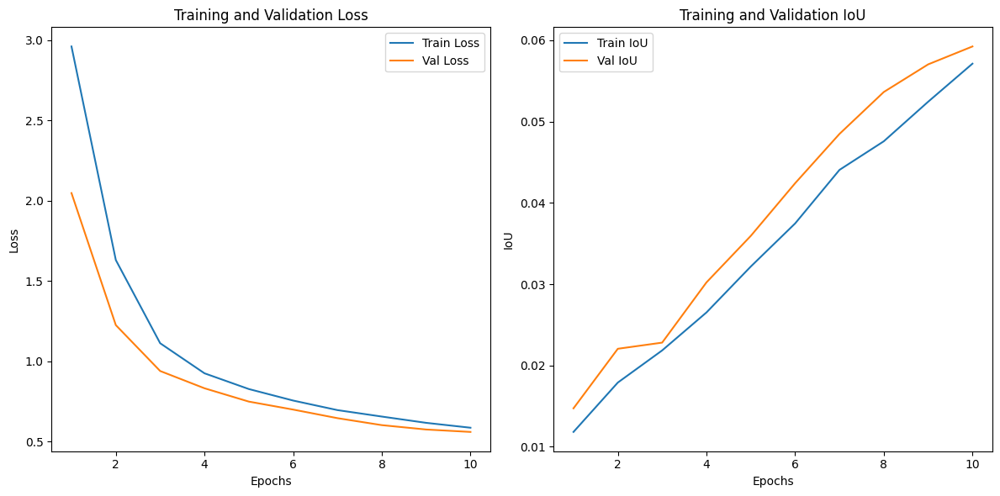

In [ ]:
def plot_metrics(train_losses, val_losses, train_ious, val_ious):
    plt.figure(figsize=(12, 6))

    # График потерь
    plt.subplot(1, 2, 1)
    plt.plot(range(1, len(train_losses) + 1), train_losses, label="Train Loss")
    plt.plot(range(1, len(val_losses) + 1), val_losses, label="Val Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Training and Validation Loss")
    plt.legend()

    # График IoU
    plt.subplot(1, 2, 2)
    plt.plot(range(1, len(train_ious) + 1), train_ious, label="Train IoU")
    plt.plot(range(1, len(val_ious) + 1), val_ious, label="Val IoU")
    plt.xlabel("Epochs")
    plt.ylabel("IoU")
    plt.title("Training and Validation IoU")
    plt.legend()

    plt.tight_layout()
    plt.show()

# Построение графиков
plot_metrics(train_losses, val_losses, train_ious, val_ious)

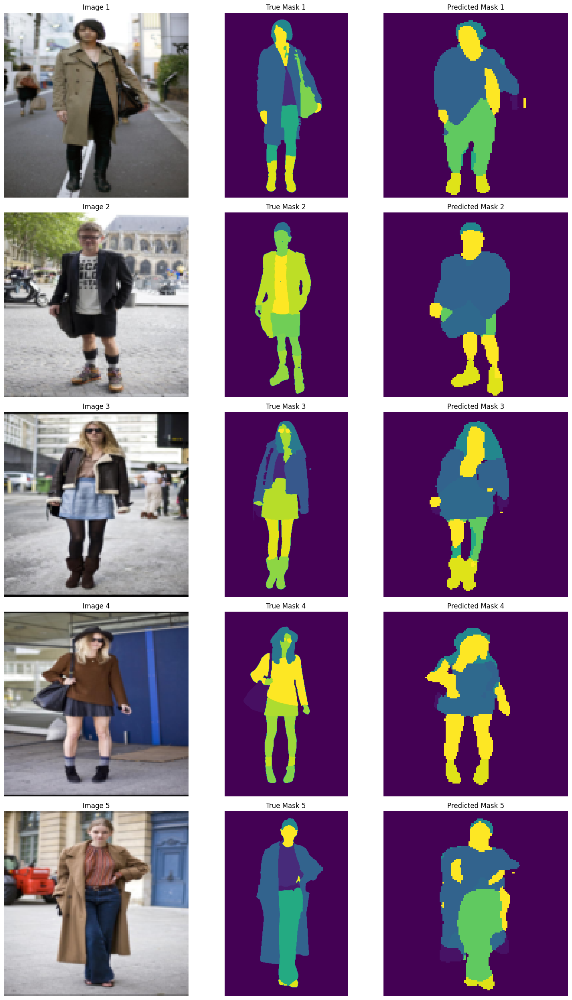

In [ ]:
import matplotlib.pyplot as plt
import torch
import numpy as np

# Функция для отображения изображений, масок и предсказаний
def plot_all_in_one(model, val_loader, dataset, n_samples=5, device='cuda'):
    model.eval()

    fig, axes = plt.subplots(n_samples, 3, figsize=(15, 5 * n_samples))

    # Берём изображения из датасета и отображаем их
    for i in range(n_samples):
        # Извлекаем изображение из датасета
        image, _ = dataset[i]
        image_for_display = image.numpy().transpose(1, 2, 0)  # Для отображения
        # Обратная нормализация
        #mean = [0.485, 0.456, 0.406]
        #std = [0.229, 0.224, 0.225]
        #image_for_display = (image_for_display * std + mean)  # Применение нормализации
        image_for_display = np.clip(image_for_display, 0, 1)

        # Отображаем изображение
        axes[i, 0].imshow(image_for_display)
        axes[i, 0].set_title(f"Image {i+1}")
        axes[i, 0].axis('off')

    # Сбор масок и предсказаний
    masks_list = []
    pred_masks_list = []

    for i in range(n_samples):
        image, mask = val_loader.dataset[i]
        image = image.to(device).unsqueeze(0)  # Переносим на устройство и добавляем размерность батча

        # Получаем предсказания модели
        with torch.no_grad():
            outputs = model(pixel_values=image)  # Вывод модели
            pred_mask = torch.argmax(outputs.logits, dim=1).cpu().squeeze().numpy()  # Предсказание в numpy

        # Истинная маска
        mask = mask.numpy().squeeze()

        # Сохраняем данные
        masks_list.append(mask)
        pred_masks_list.append(pred_mask)

    # Отображаем маски и предсказания
    for i in range(n_samples):
        # Истинные маски
        axes[i, 1].imshow(masks_list[i], cmap="viridis")
        axes[i, 1].set_title(f"True Mask {i+1}")
        axes[i, 1].axis('off')

        # Предсказанные маски
        axes[i, 2].imshow(pred_masks_list[i], cmap="viridis")
        axes[i, 2].set_title(f"Predicted Mask {i+1}")
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()


# Пример вызова функции
plot_all_in_one(model, val_loader, val_dataset, n_samples=5, device='cuda')


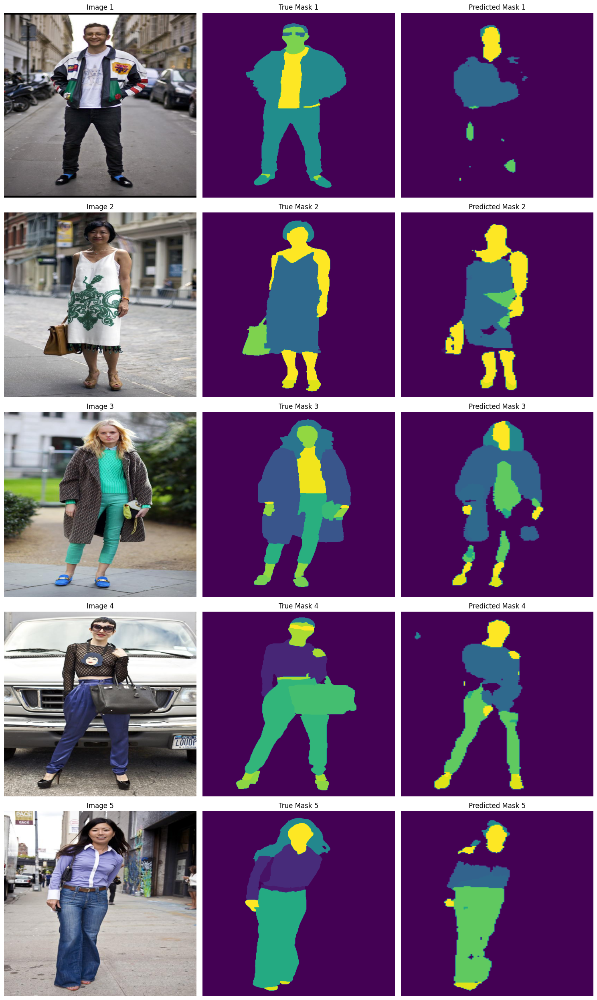

In [ ]:
# 1. Настройка датасета без изменения размера изображений
image_transforms = transforms.Compose([
    transforms.ToTensor(),  # Только преобразуем в тензор
])

mask_transforms = transforms.Compose([
    transforms.ToTensor()  # Маски не изменяются
])

dataset = ClothesSegmentationDataset(
    image_dir=train_dataset_path,
    mask_dir=val_dataset_path,
    image_transforms=image_transforms,
    mask_transforms=None  # Маски не нормализуются
)

# 2. Разделение на обучающую и валидационную выборку
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=8)

# 3. Функция для отображения изображений с сохранением их пропорций
def plot_all_in_one(model, val_loader, dataset, n_samples=5, device='cuda'):
    model.eval()

    fig, axes = plt.subplots(n_samples, 3, figsize=(15, 5 * n_samples))

    # Берём изображения из датасета и отображаем их
    for i in range(n_samples):
        # Извлекаем изображение из датасета
        image, _ = dataset[i]
        image_for_display = image.numpy().transpose(1, 2, 0)  # Для отображения
        # Обратная нормализация
        # mean = [0.485, 0.456, 0.406]
        # std = [0.229, 0.224, 0.225]
        # image_for_display = (image_for_display * std + mean)  # Применение нормализации
        image_for_display = np.clip(image_for_display, 0, 1)

        # Отображаем изображение с сохранением исходных пропорций
        axes[i, 0].imshow(image_for_display)
        axes[i, 0].set_title(f"Image {i+1}")
        axes[i, 0].axis('off')
        axes[i, 0].set_aspect('auto')  # Оставляем исходные пропорции

    # Сбор масок и предсказаний
    masks_list = []
    pred_masks_list = []

    for i in range(n_samples):
        image, mask = val_loader.dataset[i]
        image = image.to(device).unsqueeze(0)  # Переносим на устройство и добавляем размерность батча

        # Получаем предсказания модели
        with torch.no_grad():
            outputs = model(pixel_values=image)  # Вывод модели
            pred_mask = torch.argmax(outputs.logits, dim=1).cpu().squeeze().numpy()  # Предсказание в numpy

        # Истинная маска
        mask = mask.numpy().squeeze()

        # Сохраняем данные
        masks_list.append(mask)
        pred_masks_list.append(pred_mask)

    # Отображаем маски и предсказания
    for i in range(n_samples):
        # Истинные маски
        axes[i, 1].imshow(masks_list[i], cmap="viridis")
        axes[i, 1].set_title(f"True Mask {i+1}")
        axes[i, 1].axis('off')
        axes[i, 1].set_aspect('auto')

        # Предсказанные маски
        axes[i, 2].imshow(pred_masks_list[i], cmap="viridis")
        axes[i, 2].set_title(f"Predicted Mask {i+1}")
        axes[i, 2].axis('off')
        axes[i, 2].set_aspect('auto')

    plt.tight_layout()
    plt.show()

# Пример вызова функции
plot_all_in_one(model, val_loader, val_dataset, n_samples=5, device='cuda')


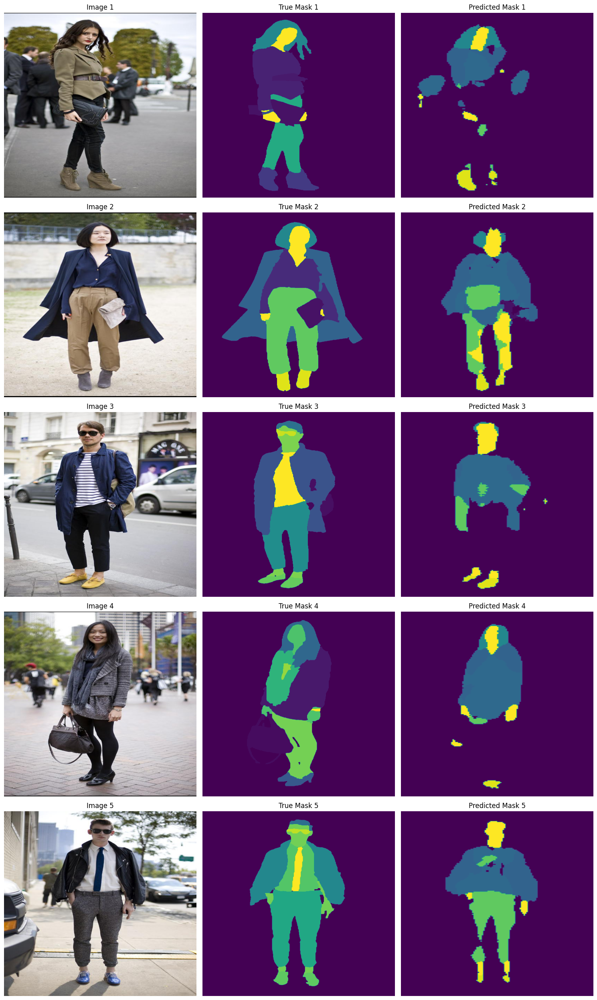

In [ ]:
plot_all_in_one(model, val_loader, val_dataset, n_samples=5, device='cuda')

#### Обучение 2:

In [ ]:

# Инициализация устройства
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Загрузка модели и процессора
n_classes = 59  # Укажите количество классов (например, 20 для ADE20k)
model = SegformerForSemanticSegmentation.from_pretrained(
    "nvidia/segformer-b0-finetuned-ade-512-512",
    num_labels=n_classes,
    ignore_mismatched_sizes=True
).to(device)

processor = SegformerImageProcessor.from_pretrained("nvidia/segformer-b0-finetuned-ade-512-512")

# Преобразование для модели Segformer
def preprocess_image(image):
    """
    Преобразование изображения в формат, подходящий для Segformer.
    """
    return processor(image, return_tensors="pt").pixel_values[0]

# Обновление DataLoader для обработки изображений
class SegformerDataset(torch.utils.data.Dataset):
    def __init__(self, dataset, processor, transform=None):
        self.dataset = dataset
        self.processor = processor
        self.transform = transform

    def __getitem__(self, idx):
        image, mask = self.dataset[idx]
        if self.transform:
            image = self.transform(image)
        image = self.processor(image, return_tensors="pt").pixel_values.squeeze(0)
        return image, mask

    def __len__(self):
        return len(self.dataset)

# Создание DataLoader'ов
train_dataset_segformer = SegformerDataset(train_dataset, processor)#, transform=transform)
val_dataset_segformer = SegformerDataset(val_dataset, processor)#, transform=transform)

train_loader = DataLoader(train_dataset_segformer, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset_segformer, batch_size=8, shuffle=False)

# Оптимизатор и функция потерь
class_weights = torch.tensor([1.0] * n_classes).to(device)  # Задайте веса классов, если необходимо
loss_fn = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.AdamW(model.parameters(), lr=1e-4)

train_losses = []
val_losses = []
train_ious = []
val_ious = []

# Используем функцию train_model
def train_model_segformer(model, criterion, optimizer, train_loader, val_loader, num_epochs=10):
    for epoch in range(num_epochs):
        # Обучение
        model.train()
        train_loss = 0
        train_iou = 0

        for images, masks in tqdm(train_loader, desc=f"Epoch {epoch + 1}/{num_epochs}"):
            images, masks = images.to(device), masks.to(device)
            masks = masks.squeeze(1)

            optimizer.zero_grad()
            outputs = model(pixel_values=images)

            # Приведение размеров масок
            masks = F.interpolate(
                masks.unsqueeze(1).float(),  # Добавляем канал
                size=outputs.logits.shape[2:],     # Размер HxW как у предсказаний
                mode="nearest"              # Ближайший сосед
            ).squeeze(1).long()             # Убираем канал, приводим к long

            loss = criterion(outputs.logits, masks)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            train_iou += iou(outputs.logits, masks, n_classes)  # Функция IoU должна быть определена

        # Сохраняем средние значения метрик для эпохи
        train_losses.append(train_loss / len(train_loader))
        train_ious.append(train_iou / len(train_loader))

        # Валидация
        val_loss = 0
        val_iou = 0
        model.eval()
        with torch.no_grad():
            for images, masks in val_loader:#tqdm(val_loader, desc="Validation"):
                images, masks = images.to(device), masks.to(device)
                masks = masks.squeeze(1)

                outputs = model(pixel_values=images)

                # Приведение размеров масок
                masks = F.interpolate(
                    masks.unsqueeze(1).float(),  # Добавляем канал
                    size=outputs.logits.shape[2:],  # Размер HxW как у предсказаний
                    mode="nearest"  # Ближайший сосед
                ).squeeze(1).long()  # Убираем канал, приводим к long

                loss = criterion(outputs.logits, masks)
                val_loss += loss.item()
                val_iou += iou(outputs.logits, masks, n_classes)

        # Сохраняем средние значения метрик для эпохи
        val_losses.append(val_loss / len(val_loader))
        val_ious.append(val_iou / len(val_loader))

        # Печать результатов
        #print(f"Epoch {epoch + 1}/{num_epochs}")
        print(f"Train Loss: {train_losses[-1]:.4f}, Train IoU: {train_ious[-1]:.4f}")
        print(f"Val Loss: {val_losses[-1]:.4f}, Val IoU: {val_ious[-1]:.4f}\n\n")

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([59]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([59, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.10/dist-packages/transformers/utils/deprecation.py:165: UserWarning: The following named arguments are not valid for `SegformerImageProcessor.__init__` and were ignored: 'feature_extractor_type'
  return func(*args, **kwargs)


In [ ]:

# Обучение модели
train_model_segformer(model, loss_fn, optimizer, train_loader, val_loader, num_epochs=10)

Epoch 1/10: 100%|██████████| 100/100 [01:04<00:00,  1.55it/s]


Train Loss: 2.9616, Train IoU: 0.0118
Val Loss: 2.0488, Val IoU: 0.0147




Epoch 2/10: 100%|██████████| 100/100 [01:04<00:00,  1.55it/s]


Train Loss: 1.6318, Train IoU: 0.0179
Val Loss: 1.2264, Val IoU: 0.0221




Epoch 3/10: 100%|██████████| 100/100 [01:04<00:00,  1.54it/s]


Train Loss: 1.1137, Train IoU: 0.0219
Val Loss: 0.9407, Val IoU: 0.0228




Epoch 4/10: 100%|██████████| 100/100 [01:04<00:00,  1.55it/s]


Train Loss: 0.9264, Train IoU: 0.0265
Val Loss: 0.8331, Val IoU: 0.0302




Epoch 5/10: 100%|██████████| 100/100 [01:04<00:00,  1.56it/s]


Train Loss: 0.8284, Train IoU: 0.0322
Val Loss: 0.7502, Val IoU: 0.0359




Epoch 6/10: 100%|██████████| 100/100 [01:04<00:00,  1.55it/s]


Train Loss: 0.7566, Train IoU: 0.0375
Val Loss: 0.7004, Val IoU: 0.0424




Epoch 7/10: 100%|██████████| 100/100 [01:03<00:00,  1.57it/s]


Train Loss: 0.6971, Train IoU: 0.0441
Val Loss: 0.6470, Val IoU: 0.0485




Epoch 8/10: 100%|██████████| 100/100 [01:03<00:00,  1.57it/s]


Train Loss: 0.6570, Train IoU: 0.0476
Val Loss: 0.6036, Val IoU: 0.0536




Epoch 9/10: 100%|██████████| 100/100 [01:04<00:00,  1.55it/s]


Train Loss: 0.6178, Train IoU: 0.0524
Val Loss: 0.5763, Val IoU: 0.0570




Epoch 10/10: 100%|██████████| 100/100 [01:03<00:00,  1.57it/s]


Train Loss: 0.5875, Train IoU: 0.0571
Val Loss: 0.5612, Val IoU: 0.0592




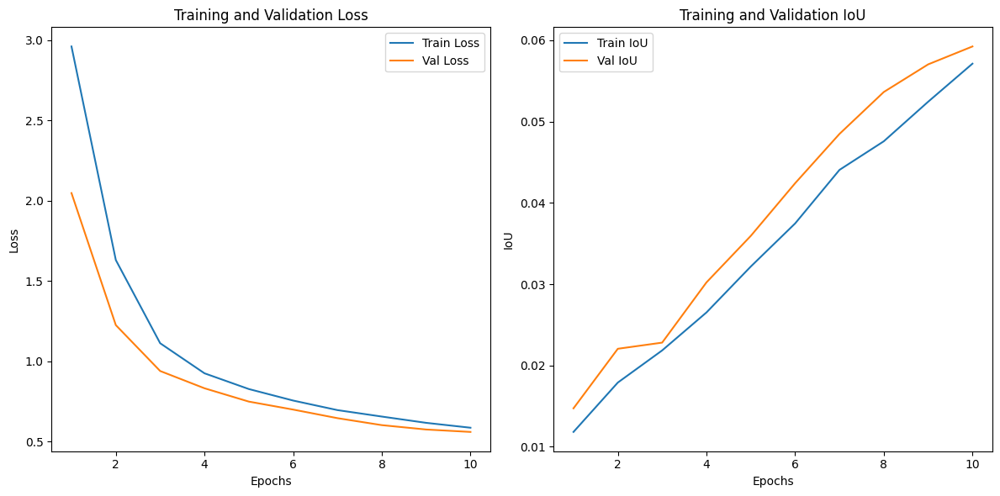

In [ ]:
def plot_metrics(train_losses, val_losses, train_ious, val_ious):
    plt.figure(figsize=(12, 6))

    # График потерь
    plt.subplot(1, 2, 1)
    plt.plot(range(1, len(train_losses) + 1), train_losses, label="Train Loss")
    plt.plot(range(1, len(val_losses) + 1), val_losses, label="Val Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Training and Validation Loss")
    plt.legend()

    # График IoU
    plt.subplot(1, 2, 2)
    plt.plot(range(1, len(train_ious) + 1), train_ious, label="Train IoU")
    plt.plot(range(1, len(val_ious) + 1), val_ious, label="Val IoU")
    plt.xlabel("Epochs")
    plt.ylabel("IoU")
    plt.title("Training and Validation IoU")
    plt.legend()

    plt.tight_layout()
    plt.show()

# Построение графиков
plot_metrics(train_losses, val_losses, train_ious, val_ious)

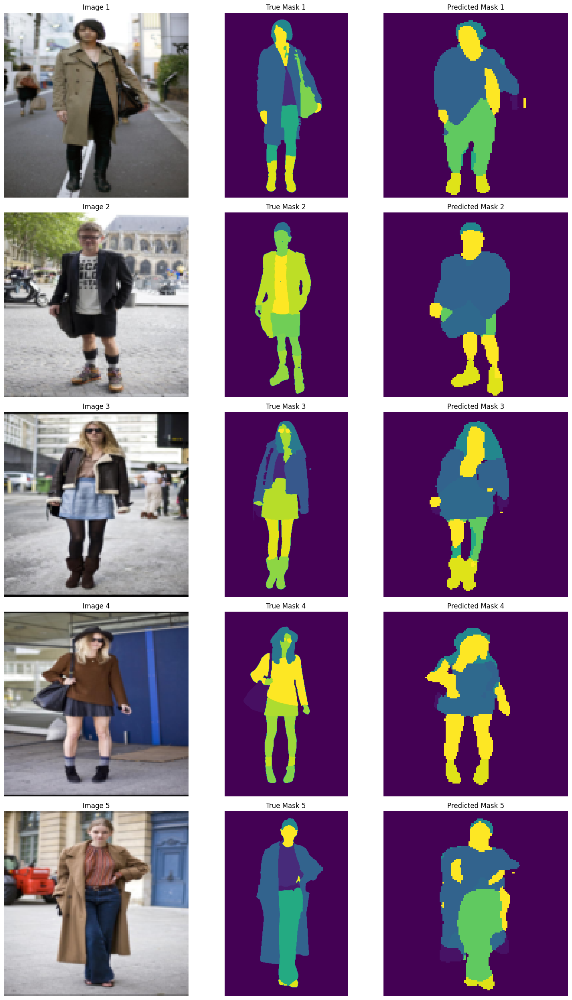

In [ ]:
import matplotlib.pyplot as plt
import torch
import numpy as np

# Функция для отображения изображений, масок и предсказаний
def plot_all_in_one(model, val_loader, dataset, n_samples=5, device='cuda'):
    model.eval()

    fig, axes = plt.subplots(n_samples, 3, figsize=(15, 5 * n_samples))

    # Берём изображения из датасета и отображаем их
    for i in range(n_samples):
        # Извлекаем изображение из датасета
        image, _ = dataset[i]
        image_for_display = image.numpy().transpose(1, 2, 0)  # Для отображения
        # Обратная нормализация
        #mean = [0.485, 0.456, 0.406]
        #std = [0.229, 0.224, 0.225]
        #image_for_display = (image_for_display * std + mean)  # Применение нормализации
        image_for_display = np.clip(image_for_display, 0, 1)

        # Отображаем изображение
        axes[i, 0].imshow(image_for_display)
        axes[i, 0].set_title(f"Image {i+1}")
        axes[i, 0].axis('off')

    # Сбор масок и предсказаний
    masks_list = []
    pred_masks_list = []

    for i in range(n_samples):
        image, mask = val_loader.dataset[i]
        image = image.to(device).unsqueeze(0)  # Переносим на устройство и добавляем размерность батча

        # Получаем предсказания модели
        with torch.no_grad():
            outputs = model(pixel_values=image)  # Вывод модели
            pred_mask = torch.argmax(outputs.logits, dim=1).cpu().squeeze().numpy()  # Предсказание в numpy

        # Истинная маска
        mask = mask.numpy().squeeze()

        # Сохраняем данные
        masks_list.append(mask)
        pred_masks_list.append(pred_mask)

    # Отображаем маски и предсказания
    for i in range(n_samples):
        # Истинные маски
        axes[i, 1].imshow(masks_list[i], cmap="viridis")
        axes[i, 1].set_title(f"True Mask {i+1}")
        axes[i, 1].axis('off')

        # Предсказанные маски
        axes[i, 2].imshow(pred_masks_list[i], cmap="viridis")
        axes[i, 2].set_title(f"Predicted Mask {i+1}")
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()


# Пример вызова функции
plot_all_in_one(model, val_loader, val_dataset, n_samples=5, device='cuda')


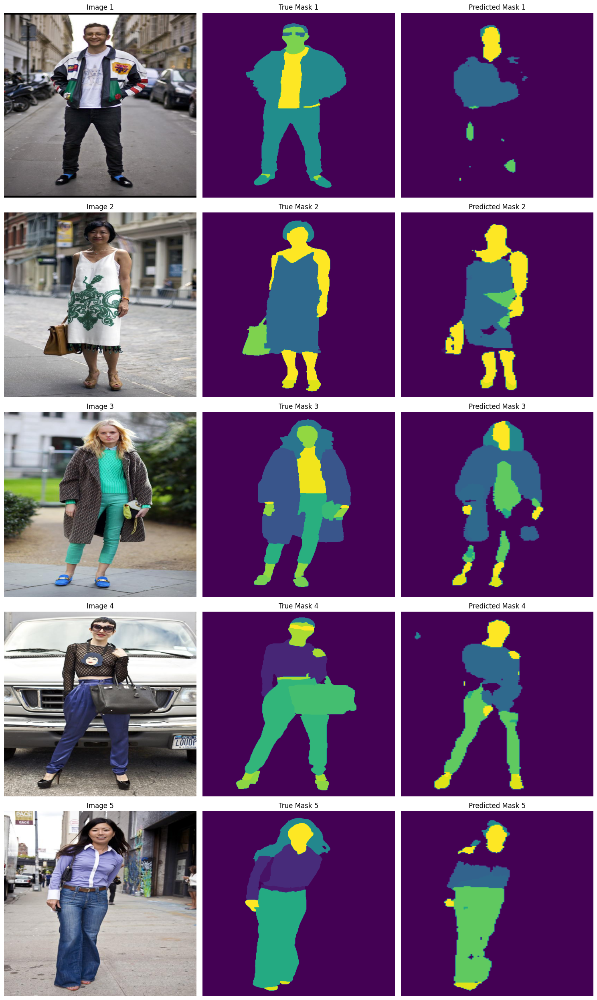

In [ ]:
# 1. Настройка датасета без изменения размера изображений
image_transforms = transforms.Compose([
    transforms.ToTensor(),  # Только преобразуем в тензор
])

mask_transforms = transforms.Compose([
    transforms.ToTensor()  # Маски не изменяются
])

dataset = ClothesSegmentationDataset(
    image_dir=train_dataset_path,
    mask_dir=val_dataset_path,
    image_transforms=image_transforms,
    mask_transforms=None  # Маски не нормализуются
)

# 2. Разделение на обучающую и валидационную выборку
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=8)

# 3. Функция для отображения изображений с сохранением их пропорций
def plot_all_in_one(model, val_loader, dataset, n_samples=5, device='cuda'):
    model.eval()

    fig, axes = plt.subplots(n_samples, 3, figsize=(15, 5 * n_samples))

    # Берём изображения из датасета и отображаем их
    for i in range(n_samples):
        # Извлекаем изображение из датасета
        image, _ = dataset[i]
        image_for_display = image.numpy().transpose(1, 2, 0)  # Для отображения
        # Обратная нормализация
        # mean = [0.485, 0.456, 0.406]
        # std = [0.229, 0.224, 0.225]
        # image_for_display = (image_for_display * std + mean)  # Применение нормализации
        image_for_display = np.clip(image_for_display, 0, 1)

        # Отображаем изображение с сохранением исходных пропорций
        axes[i, 0].imshow(image_for_display)
        axes[i, 0].set_title(f"Image {i+1}")
        axes[i, 0].axis('off')
        axes[i, 0].set_aspect('auto')  # Оставляем исходные пропорции

    # Сбор масок и предсказаний
    masks_list = []
    pred_masks_list = []

    for i in range(n_samples):
        image, mask = val_loader.dataset[i]
        image = image.to(device).unsqueeze(0)  # Переносим на устройство и добавляем размерность батча

        # Получаем предсказания модели
        with torch.no_grad():
            outputs = model(pixel_values=image)  # Вывод модели
            pred_mask = torch.argmax(outputs.logits, dim=1).cpu().squeeze().numpy()  # Предсказание в numpy

        # Истинная маска
        mask = mask.numpy().squeeze()

        # Сохраняем данные
        masks_list.append(mask)
        pred_masks_list.append(pred_mask)

    # Отображаем маски и предсказания
    for i in range(n_samples):
        # Истинные маски
        axes[i, 1].imshow(masks_list[i], cmap="viridis")
        axes[i, 1].set_title(f"True Mask {i+1}")
        axes[i, 1].axis('off')
        axes[i, 1].set_aspect('auto')

        # Предсказанные маски
        axes[i, 2].imshow(pred_masks_list[i], cmap="viridis")
        axes[i, 2].set_title(f"Predicted Mask {i+1}")
        axes[i, 2].axis('off')
        axes[i, 2].set_aspect('auto')

    plt.tight_layout()
    plt.show()

# Пример вызова функции
plot_all_in_one(model, val_loader, val_dataset, n_samples=5, device='cuda')


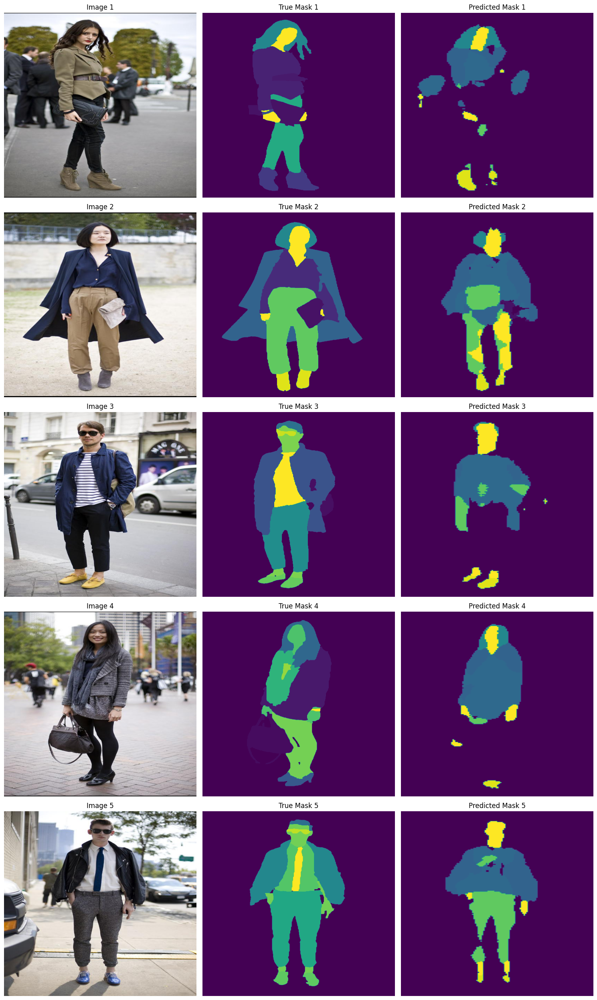

In [ ]:
plot_all_in_one(model, val_loader, val_dataset, n_samples=5, device='cuda')

### Ранние попытки:

In [ ]:
from transformers import SegformerForSemanticSegmentation, SegformerImageProcessor
from torch.utils.data import DataLoader
from tqdm import tqdm
import torch.nn as nn
import torch.optim as optim
import torch

# Инициализация устройства
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Загрузка модели и процессора
n_classes = 59  # Укажите количество классов (например, 20 для ADE20k)
model = SegformerForSemanticSegmentation.from_pretrained(
    "nvidia/segformer-b0-finetuned-ade-512-512",
    num_labels=n_classes,
    ignore_mismatched_sizes=True
).to(device)

processor = SegformerImageProcessor.from_pretrained("nvidia/segformer-b0-finetuned-ade-512-512")

# Преобразование для модели Segformer
def preprocess_image(image):
    """
    Преобразование изображения в формат, подходящий для Segformer.
    """
    return processor(image, return_tensors="pt").pixel_values[0]

# Обновление DataLoader для обработки изображений
class SegformerDataset(torch.utils.data.Dataset):
    def __init__(self, dataset, processor, transform=None):
        self.dataset = dataset
        self.processor = processor
        self.transform = transform

    def __getitem__(self, idx):
        image, mask = self.dataset[idx]
        if self.transform:
            image = self.transform(image)
        image = self.processor(image, return_tensors="pt").pixel_values.squeeze(0)
        return image, mask

    def __len__(self):
        return len(self.dataset)

from torchvision.transforms import Resize

transform = Resize((64, 64))

# Создание DataLoader'ов
train_dataset_segformer = SegformerDataset(train_dataset, processor, transform=transform)
val_dataset_segformer = SegformerDataset(val_dataset, processor, transform=transform)

train_loader = DataLoader(train_dataset_segformer, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset_segformer, batch_size=8, shuffle=False)

# Оптимизатор и функция потерь
class_weights = torch.tensor([1.0] * n_classes).to(device)  # Задайте веса классов, если необходимо
loss_fn = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.AdamW(model.parameters(), lr=1e-4)


# Используем функцию train_model
def train_model_segformer(model, criterion, optimizer, train_loader, val_loader, num_epochs=10):
    for epoch in range(num_epochs):
        # Обучение
        model.train()
        train_loss = 0
        train_iou = 0

        for images, masks in tqdm(train_loader, desc=f"Training Epoch {epoch + 1}/{num_epochs}"):
            images, masks = images.to(device), masks.to(device)
            masks = masks.squeeze(1)

            optimizer.zero_grad()
            outputs = model(pixel_values=images)

            # Приведение размеров масок
            masks = F.interpolate(
                masks.unsqueeze(1).float(),  # Добавляем канал
                size=outputs.logits.shape[2:],     # Размер HxW как у предсказаний
                mode="nearest"              # Ближайший сосед
            ).squeeze(1).long()             # Убираем канал, приводим к long

            loss = criterion(outputs.logits, masks)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            train_iou += iou(outputs.logits, masks, n_classes)  # Функция IoU должна быть определена

        # Валидация
        val_loss = 0
        val_iou = 0
        model.eval()
        with torch.no_grad():
            for images, masks in tqdm(val_loader, desc="Validation"):
                images, masks = images.to(device), masks.to(device)
                masks = masks.squeeze(1)

                outputs = model(pixel_values=images)

                # Приведение размеров масок
                masks = F.interpolate(
                    masks.unsqueeze(1).float(),  # Добавляем канал
                    size=outputs.logits.shape[2:],     # Размер HxW как у предсказаний
                    mode="nearest"              # Ближайший сосед
                ).squeeze(1).long()             # Убираем канал, приводим к long

                loss = criterion(outputs.logits, masks)
                val_loss += loss.item()
                val_iou += iou(outputs.logits, masks, n_classes)

        # Печать результатов
        print(f"Epoch {epoch + 1}/{num_epochs}")
        print(f"Train Loss: {train_loss / len(train_loader):.4f}, Train IoU: {train_iou / len(train_loader):.4f}")
        print(f"Val Loss: {val_loss / len(val_loader):.4f}, Val IoU: {val_iou / len(val_loader):.4f}")

# Обучение модели
train_model_segformer(model, loss_fn, optimizer, train_loader, val_loader, num_epochs=10)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/6.88k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/15.0M [00:00<?, ?B/s]

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([59]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([59, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


preprocessor_config.json:   0%|          | 0.00/271 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/utils/deprecation.py:165: UserWarning: The following named arguments are not valid for `SegformerImageProcessor.__init__` and were ignored: 'feature_extractor_type'
  return func(*args, **kwargs)
Training Epoch 1/10:   0%|          | 0/100 [00:01<?, ?it/s]


AttributeError: 'SemanticSegmenterOutput' object has no attribute 'shape'

In [ ]:

# Инициализация устройства
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Загрузка модели и процессора
n_classes = 59  # Укажите количество классов (например, 20 для ADE20k)
model = SegformerForSemanticSegmentation.from_pretrained(
    "nvidia/segformer-b0-finetuned-ade-512-512",
    num_labels=n_classes,
    ignore_mismatched_sizes=True
).to(device)

processor = SegformerImageProcessor.from_pretrained("nvidia/segformer-b0-finetuned-ade-512-512")

# Преобразование для модели Segformer
def preprocess_image(image):
    """
    Преобразование изображения в формат, подходящий для Segformer.
    """
    return processor(image, return_tensors="pt").pixel_values[0]

# Обновление DataLoader для обработки изображений
class SegformerDataset(torch.utils.data.Dataset):
    def __init__(self, dataset, processor, transform=None):
        self.dataset = dataset
        self.processor = processor
        self.transform = transform

    def __getitem__(self, idx):
        image, mask = self.dataset[idx]
        if self.transform:
            image = self.transform(image)
        image = self.processor(image, return_tensors="pt").pixel_values.squeeze(0)
        return image, mask

    def __len__(self):
        return len(self.dataset)

# Создание DataLoader'ов
train_dataset_segformer = SegformerDataset(train_dataset, processor)#, transform=transform)
val_dataset_segformer = SegformerDataset(val_dataset, processor)#, transform=transform)

train_loader = DataLoader(train_dataset_segformer, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset_segformer, batch_size=8, shuffle=False)

# Оптимизатор и функция потерь
class_weights = torch.tensor([1.0] * n_classes).to(device)  # Задайте веса классов, если необходимо
loss_fn = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.AdamW(model.parameters(), lr=1e-4)

train_losses = []
val_losses = []
train_ious = []
val_ious = []

# Используем функцию train_model
def train_model_segformer(model, criterion, optimizer, train_loader, val_loader, num_epochs=10):
    for epoch in range(num_epochs):
        # Обучение
        model.train()
        train_loss = 0
        train_iou = 0

        for images, masks in tqdm(train_loader, desc=f"Epoch {epoch + 1}/{num_epochs}"):
            images, masks = images.to(device), masks.to(device)
            masks = masks.squeeze(1)

            optimizer.zero_grad()
            outputs = model(pixel_values=images)

            # Приведение размеров масок
            masks = F.interpolate(
                masks.unsqueeze(1).float(),  # Добавляем канал
                size=outputs.logits.shape[2:],     # Размер HxW как у предсказаний
                mode="nearest"              # Ближайший сосед
            ).squeeze(1).long()             # Убираем канал, приводим к long

            loss = criterion(outputs.logits, masks)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            train_iou += iou(outputs.logits, masks, n_classes)  # Функция IoU должна быть определена

        # Сохраняем средние значения метрик для эпохи
        train_losses.append(train_loss / len(train_loader))
        train_ious.append(train_iou / len(train_loader))

        # Валидация
        val_loss = 0
        val_iou = 0
        model.eval()
        with torch.no_grad():
            for images, masks in val_loader:#tqdm(val_loader, desc="Validation"):
                images, masks = images.to(device), masks.to(device)
                masks = masks.squeeze(1)

                outputs = model(pixel_values=images)

                # Приведение размеров масок
                masks = F.interpolate(
                    masks.unsqueeze(1).float(),  # Добавляем канал
                    size=outputs.logits.shape[2:],  # Размер HxW как у предсказаний
                    mode="nearest"  # Ближайший сосед
                ).squeeze(1).long()  # Убираем канал, приводим к long

                loss = criterion(outputs.logits, masks)
                val_loss += loss.item()
                val_iou += iou(outputs.logits, masks, n_classes)

        # Сохраняем средние значения метрик для эпохи
        val_losses.append(val_loss / len(val_loader))
        val_ious.append(val_iou / len(val_loader))

        # Печать результатов
        #print(f"Epoch {epoch + 1}/{num_epochs}")
        print(f"Train Loss: {train_losses[-1]:.4f}, Train IoU: {train_ious[-1]:.4f}")
        print(f"Val Loss: {val_losses[-1]:.4f}, Val IoU: {val_ious[-1]:.4f}\n\n")

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([59]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([59, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:

# Обучение модели
train_model_segformer(model, loss_fn, optimizer, train_loader, val_loader, num_epochs=10)

Epoch 1/10: 100%|██████████| 100/100 [01:05<00:00,  1.53it/s]


Train Loss: 2.9360, Train IoU: 0.0117
Val Loss: 2.0284, Val IoU: 0.0150




Epoch 2/10: 100%|██████████| 100/100 [01:04<00:00,  1.56it/s]


Train Loss: 1.6630, Train IoU: 0.0163
Val Loss: 1.2482, Val IoU: 0.0158




Epoch 3/10: 100%|██████████| 100/100 [01:03<00:00,  1.58it/s]


Train Loss: 1.1916, Train IoU: 0.0152
Val Loss: 1.0683, Val IoU: 0.0130




Epoch 4/10: 100%|██████████| 100/100 [01:03<00:00,  1.58it/s]


Train Loss: 1.0456, Train IoU: 0.0130
Val Loss: 0.9708, Val IoU: 0.0130




Epoch 5/10: 100%|██████████| 100/100 [01:03<00:00,  1.57it/s]


Train Loss: 0.9920, Train IoU: 0.0130
Val Loss: 0.9406, Val IoU: 0.0130




Epoch 6/10: 100%|██████████| 100/100 [01:03<00:00,  1.57it/s]


Train Loss: 0.9586, Train IoU: 0.0130
Val Loss: 0.8941, Val IoU: 0.0130




Epoch 7/10: 100%|██████████| 100/100 [01:03<00:00,  1.59it/s]


Train Loss: 0.9049, Train IoU: 0.0154
Val Loss: 0.8421, Val IoU: 0.0201




Epoch 8/10: 100%|██████████| 100/100 [01:03<00:00,  1.57it/s]


Train Loss: 0.8504, Train IoU: 0.0227
Val Loss: 0.7943, Val IoU: 0.0282




Epoch 9/10: 100%|██████████| 100/100 [01:03<00:00,  1.58it/s]


Train Loss: 0.8124, Train IoU: 0.0279
Val Loss: 0.7663, Val IoU: 0.0317




Epoch 10/10: 100%|██████████| 100/100 [01:03<00:00,  1.57it/s]


Train Loss: 0.7595, Train IoU: 0.0343
Val Loss: 0.7031, Val IoU: 0.0389




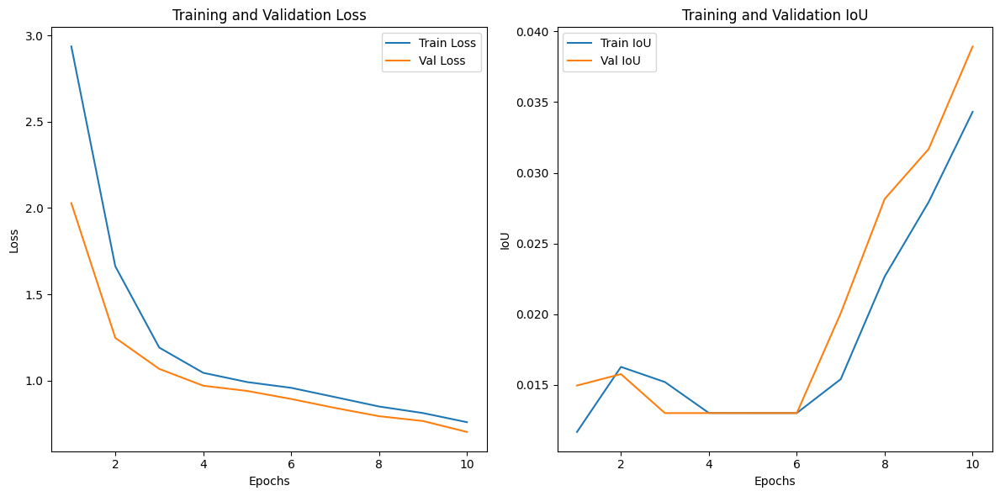

In [ ]:
def plot_metrics(train_losses, val_losses, train_ious, val_ious):
    plt.figure(figsize=(12, 6))

    # График потерь
    plt.subplot(1, 2, 1)
    plt.plot(range(1, len(train_losses) + 1), train_losses, label="Train Loss")
    plt.plot(range(1, len(val_losses) + 1), val_losses, label="Val Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Training and Validation Loss")
    plt.legend()

    # График IoU
    plt.subplot(1, 2, 2)
    plt.plot(range(1, len(train_ious) + 1), train_ious, label="Train IoU")
    plt.plot(range(1, len(val_ious) + 1), val_ious, label="Val IoU")
    plt.xlabel("Epochs")
    plt.ylabel("IoU")
    plt.title("Training and Validation IoU")
    plt.legend()

    plt.tight_layout()
    plt.show()

# Построение графиков
plot_metrics(train_losses, val_losses, train_ious, val_ious)

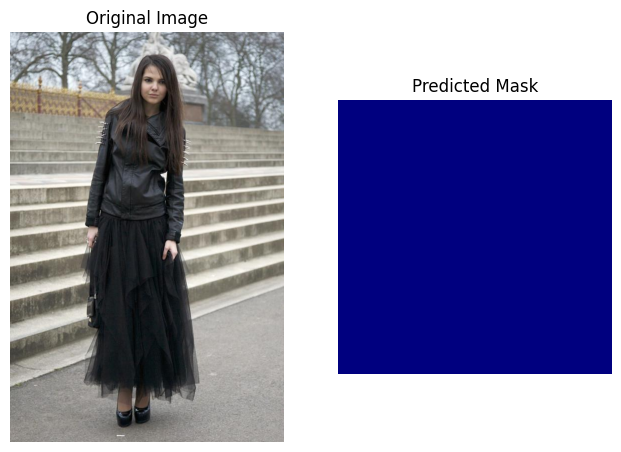

In [ ]:
import torch
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms

# Загрузка и преобразование изображения
image_path = '/content/clothing_segmentation_data/png_images/IMAGES/img_0002.png'
image = Image.open(image_path).convert("RGB")

# Преобразования для изображения (согласно ранее заданным трансформациям)
image_transforms = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
])

# Преобразуем изображение в тензор
image_tensor = image_transforms(image).unsqueeze(0).to(device)  # Добавляем размерность для батча

# Прогоняем изображение через модель
model.eval()
with torch.no_grad():
    outputs = model(pixel_values=image_tensor)
    predicted_mask = torch.argmax(outputs.logits, dim=1).squeeze(0).cpu().numpy()

# Отображаем изображение и маску
plt.figure(figsize=(12, 6))

# Исходное изображение
plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(image)
plt.axis("off")



# Предсказанная маска
plt.subplot(1, 3, 2)
plt.title("Predicted Mask")
plt.imshow(predicted_mask, cmap="jet")
plt.axis("off")

plt.show()


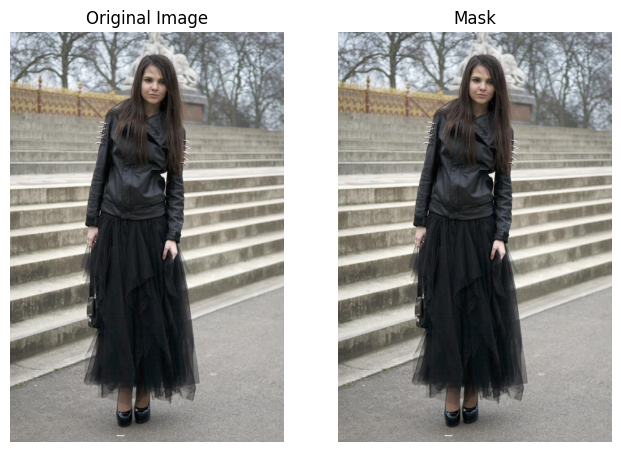

In [ ]:
plt.figure(figsize=(12, 6))

# Исходное изображение
plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(image)
plt.axis("off")


# Загрузка и преобразование изображения
mask_path = '/content/clothing_segmentation_data/png_masks/MASKS/seg_0002.png'
mask = Image.open(image_path).convert("RGB")

# Предсказанная маска
plt.subplot(1, 3, 2)
plt.title("Mask")
plt.imshow(mask, cmap="viridis")
plt.axis("off")

plt.show()

In [ ]:
import torch
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms

image, mask = dataset[1]
image_tensor = image_transforms(image).unsqueeze(0).to(device)  # Добавляем размерность для батча

# Прогоняем изображение через модель
model.eval()
with torch.no_grad():
    outputs = model(pixel_values=image_tensor)
    predicted_mask = torch.argmax(outputs.logits, dim=1).squeeze(0).cpu().numpy()

# Отображаем изображение и маску
plt.figure(figsize=(12, 6))

# Исходное изображение
plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(image)
plt.axis("off")

# Предсказанная маска
plt.subplot(1, 3, 2)
plt.title("Predicted Mask")
plt.imshow(predicted_mask, cmap="jet")
plt.axis("off")

plt.show()


TypeError: pic should be PIL Image or ndarray. Got <class 'torch.Tensor'>

TypeError: Invalid shape (1, 825, 550) for image data

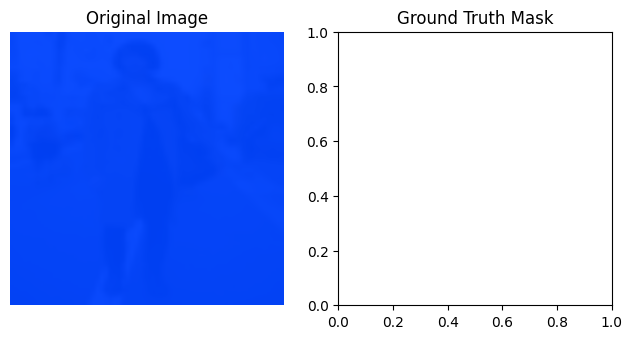

In [ ]:
import torch
import matplotlib.pyplot as plt

# Функция для визуализации предсказаний
def plot_predictions(model, dataset, num_images=5):
    """
    Функция для визуализации предсказаний модели Segformer.
    """
    model.eval()  # Устанавливаем модель в режим оценки
    for idx in range(num_images):
        image, mask = dataset[idx]  # Загружаем одно изображение и соответствующую маску

        # Преобразуем изображение в формат, подходящий для вывода
        image_to_plot = image.permute(1, 2, 0).cpu().numpy()  # Преобразуем из (C, H, W) в (H, W, C)

        # Нормализуем изображение для корректного отображения
        image_to_plot = (image_to_plot - image_to_plot.min()) / (image_to_plot.max() - image_to_plot.min())

        # Отправляем изображение на устройство
        image = image.unsqueeze(0).to(device)  # Добавляем батч размерности
        with torch.no_grad():
            outputs = model(pixel_values=image)  # Прогоняем изображение через модель
            predicted_mask = torch.argmax(outputs.logits, dim=1).squeeze(0).cpu().numpy()  # Получаем маску предсказания

        # Отрисовка
        plt.figure(figsize=(12, 6))

        # Исходное изображение
        plt.subplot(1, 3, 1)
        plt.title("Original Image")
        plt.imshow(image_to_plot)  # Показываем изображение
        plt.axis("off")  # Отключаем оси

        # Ground Truth (маска)
        plt.subplot(1, 3, 2)
        plt.title("Ground Truth Mask")
        plt.imshow(mask.numpy(), cmap="jet")
        plt.axis("off")

        # Предсказанная маска
        plt.subplot(1, 3, 3)
        plt.title("Predicted Mask")
        plt.imshow(predicted_mask, cmap="jet")
        plt.axis("off")

        plt.show()

# Визуализация
plot_predictions(model, val_dataset_segformer)


TypeError: Invalid shape (1, 825, 550) for image data

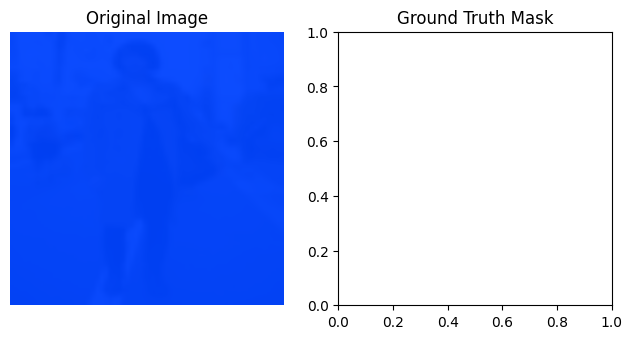

In [ ]:
# Визуализация результатов
def plot_predictions(model, dataset, num_images=5):
    """
    Функция для визуализации предсказаний модели.
    """
    model.eval()
    for idx in range(num_images):
        image, mask = dataset[idx]
        image = image.unsqueeze(0).to(device)  # Добавляем batch dimension
        with torch.no_grad():
            outputs = model(pixel_values=image)
            predicted_mask = torch.argmax(outputs.logits, dim=1).squeeze(0).cpu().numpy()

        # Приводим изображение к нужному формату для отображения
        original_image = image.cpu().squeeze().permute(1, 2, 0).numpy()  # (H, W, C)
        original_image = (original_image - original_image.min()) / (original_image.max() - original_image.min())  # Нормализация для отображения

        # Отрисовка
        plt.figure(figsize=(12, 6))

        # Исходное изображение
        plt.subplot(1, 3, 1)
        plt.title("Original Image")
        plt.imshow(original_image)
        plt.axis("off")

        # Ground Truth
        plt.subplot(1, 3, 2)
        plt.title("Ground Truth Mask")
        plt.imshow(mask.numpy(), cmap="jet")
        plt.axis("off")

        # Предсказанная маска
        plt.subplot(1, 3, 3)
        plt.title("Predicted Mask")
        plt.imshow(predicted_mask, cmap="jet")
        plt.axis("off")

        plt.show()

# Визуализация
plot_predictions(model, val_dataset_segformer)


TypeError: Invalid shape (1, 825, 550) for image data

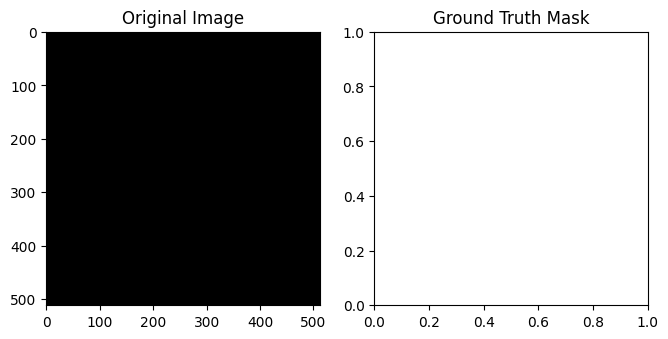

In [ ]:
# Визуализация результатов
def plot_predictions(model, dataset, num_images=5):
    """
    Функция для визуализации предсказаний модели.
    """
    model.eval()
    for idx in range(num_images):
        image, mask = dataset[idx]
        image = image.unsqueeze(0).to(device)
        with torch.no_grad():
            outputs = model(pixel_values=image)
            predicted_mask = torch.argmax(outputs.logits, dim=1).squeeze(0).cpu().numpy()

        # Отрисовка
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 3, 1)
        plt.title("Original Image")
        plt.imshow(image.cpu().squeeze().permute(1, 2, 0).numpy())

        plt.subplot(1, 3, 2)
        plt.title("Ground Truth Mask")
        plt.imshow(mask.numpy(), cmap="jet")

        plt.subplot(1, 3, 3)
        plt.title("Predicted Mask")
        plt.imshow(predicted_mask, cmap="jet")
        plt.show()

# Визуализация
plot_predictions(model, val_dataset_segformer)


Тестирование выводов:

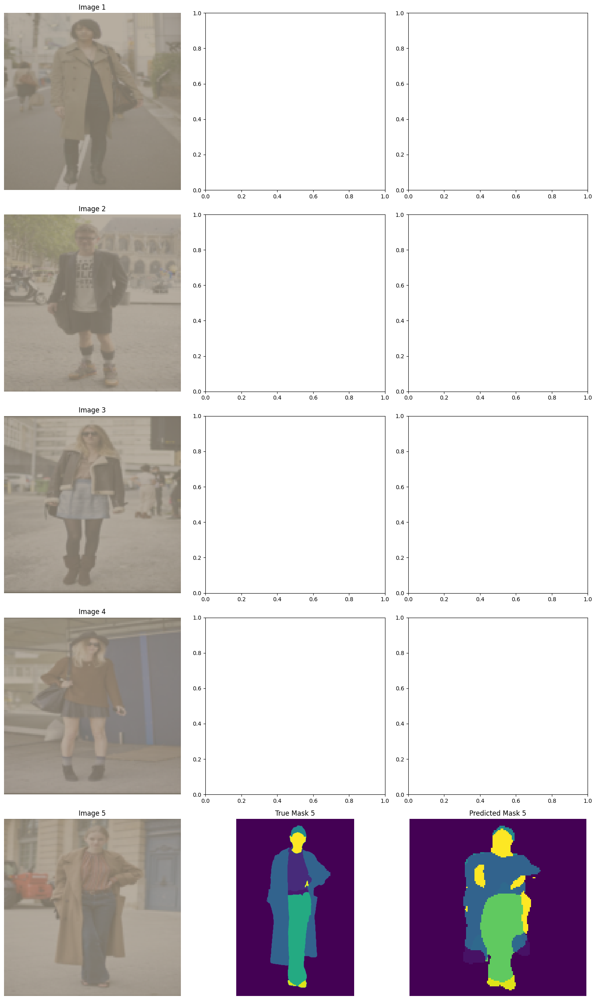

In [ ]:
import matplotlib.pyplot as plt
import torch
import numpy as np

# Функция для отображения изображений, масок и предсказаний
def plot_all_in_one(model, val_loader, dataset, n_samples=5, device='cuda'):
    model.eval()

    fig, axes = plt.subplots(n_samples, 3, figsize=(15, 5 * n_samples))

    # Берём изображения из датасета
    for i in range(n_samples):
        # Извлекаем изображение из датасета
        image, _ = dataset[i]
        image_for_display = image.numpy().transpose(1, 2, 0)  # Для отображения
        # Обратная нормализация
        mean = [0.485, 0.456, 0.406]
        std = [0.229, 0.224, 0.225]
        image_for_display = (image_for_display * std + mean)  # Применение нормализации
        image_for_display = np.clip(image_for_display, 0, 1)

        # Отображаем изображение
        axes[i, 0].imshow(image_for_display)
        axes[i, 0].set_title(f"Image {i+1}")
        axes[i, 0].axis('off')

        model.eval()

        masks_list = []
        pred_masks_list = []

        # Сбор масок и предсказаний
        for i in range(n_samples):
            image, mask = val_loader.dataset[i]
            image = image.to(device).unsqueeze(0)  # Переносим на устройство и добавляем размерность батча

            # Получаем предсказания модели
            with torch.no_grad():
                outputs = model(pixel_values=image)  # Вывод модели
                pred_mask = torch.argmax(outputs.logits, dim=1).cpu().squeeze().numpy()  # Предсказание в numpy

            # Истинная маска
            mask = mask.numpy().squeeze()

            # Сохраняем данные
            masks_list.append(mask)
            pred_masks_list.append(pred_mask)

        # Отображаем маску
        axes[i, 1].imshow(mask, cmap="viridis")
        axes[i, 1].set_title(f"True Mask {i+1}")
        axes[i, 1].axis('off')

        # Отображаем предсказанную маску
        axes[i, 2].imshow(pred_mask, cmap="viridis")
        axes[i, 2].set_title(f"Predicted Mask {i+1}")
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()


# Пример вызова функции
plot_all_in_one(model, val_loader, val_dataset, n_samples=5, device='cuda')


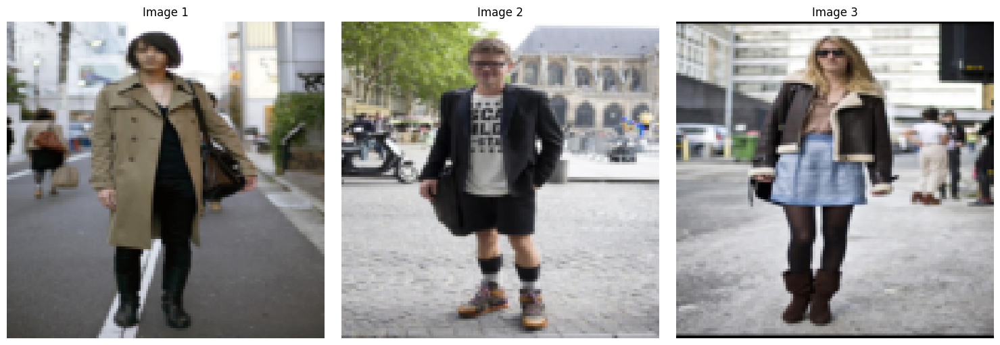

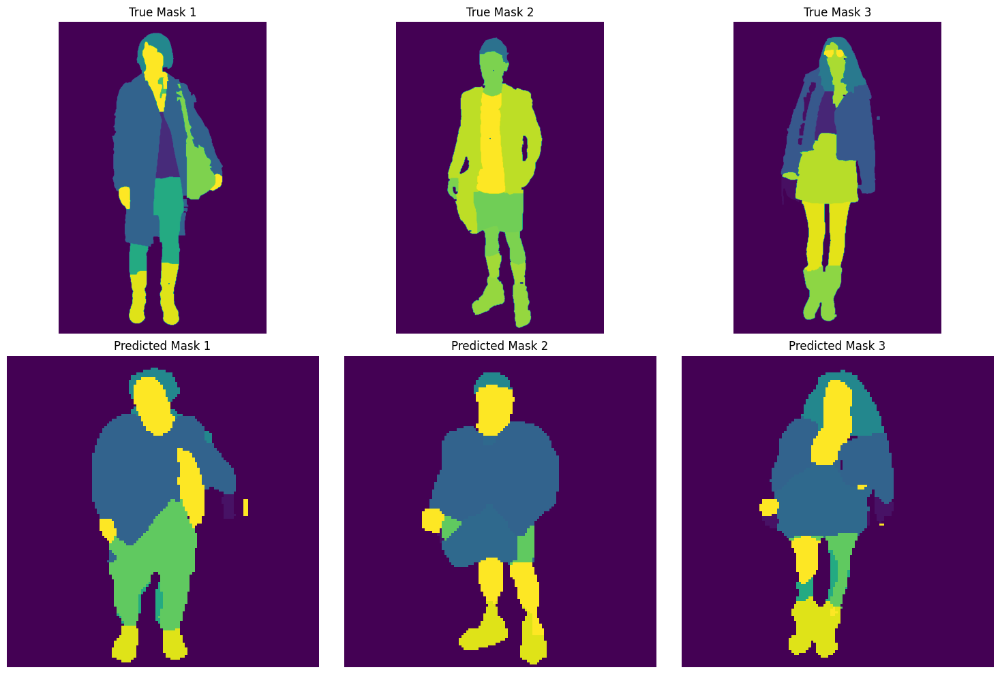

In [ ]:
import matplotlib.pyplot as plt
import torch
import numpy as np

# Функция для отображения изображений из датасета
def plot_images(dataset, n_samples=3):
    # Параметры нормализации (если используются)
    #mean = [0.485, 0.456, 0.406]
    #std = [0.229, 0.224, 0.225]

    images_list = []

    # Сбор изображений для визуализации
    for i in range(n_samples):
        image, _ = dataset[i]
        # Преобразуем изображения: обратная нормализация
        image = image.numpy().transpose(1, 2, 0)  # Переставляем оси для RGB
        #image = (image * std + mean)  # Обратная нормализация
        image = np.clip(image, 0, 1)  # Убеждаемся, что значения в [0, 1]
        images_list.append(image)

    # Визуализация изображений
    fig, axes = plt.subplots(1, n_samples, figsize=(5 * n_samples, 5))
    for i in range(n_samples):
        axes[i].imshow(images_list[i])
        axes[i].set_title(f"Image {i+1}")
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()


# Функция для отображения масок и предсказаний
def plot_masks_and_predictions(model, val_loader, n_samples=3, device='cuda'):
    model.eval()

    masks_list = []
    pred_masks_list = []

    # Сбор масок и предсказаний
    for i in range(n_samples):
        image, mask = val_loader.dataset[i]
        image = image.to(device).unsqueeze(0)  # Переносим на устройство и добавляем размерность батча

        # Получаем предсказания модели
        with torch.no_grad():
            outputs = model(pixel_values=image)  # Вывод модели
            pred_mask = torch.argmax(outputs.logits, dim=1).cpu().squeeze().numpy()  # Предсказание в numpy

        # Истинная маска
        mask = mask.numpy().squeeze()

        # Сохраняем данные
        masks_list.append(mask)
        pred_masks_list.append(pred_mask)

    # Визуализация масок
    fig, axes = plt.subplots(2, n_samples, figsize=(5 * n_samples, 10))
    for i in range(n_samples):
        # Истинные маски
        axes[0, i].imshow(masks_list[i], cmap="viridis")
        axes[0, i].set_title(f"True Mask {i+1}")
        axes[0, i].axis('off')

        # Предсказанные маски
        axes[1, i].imshow(pred_masks_list[i], cmap="viridis")
        axes[1, i].set_title(f"Predicted Mask {i+1}")
        axes[1, i].axis('off')

    plt.tight_layout()
    plt.show()


# Пример вызова функций
plot_images(val_dataset,n_samples=3)  # Сначала отображаем изображения
plot_masks_and_predictions(model, val_loader, n_samples=3, device='cuda')  # Затем маски и предсказания


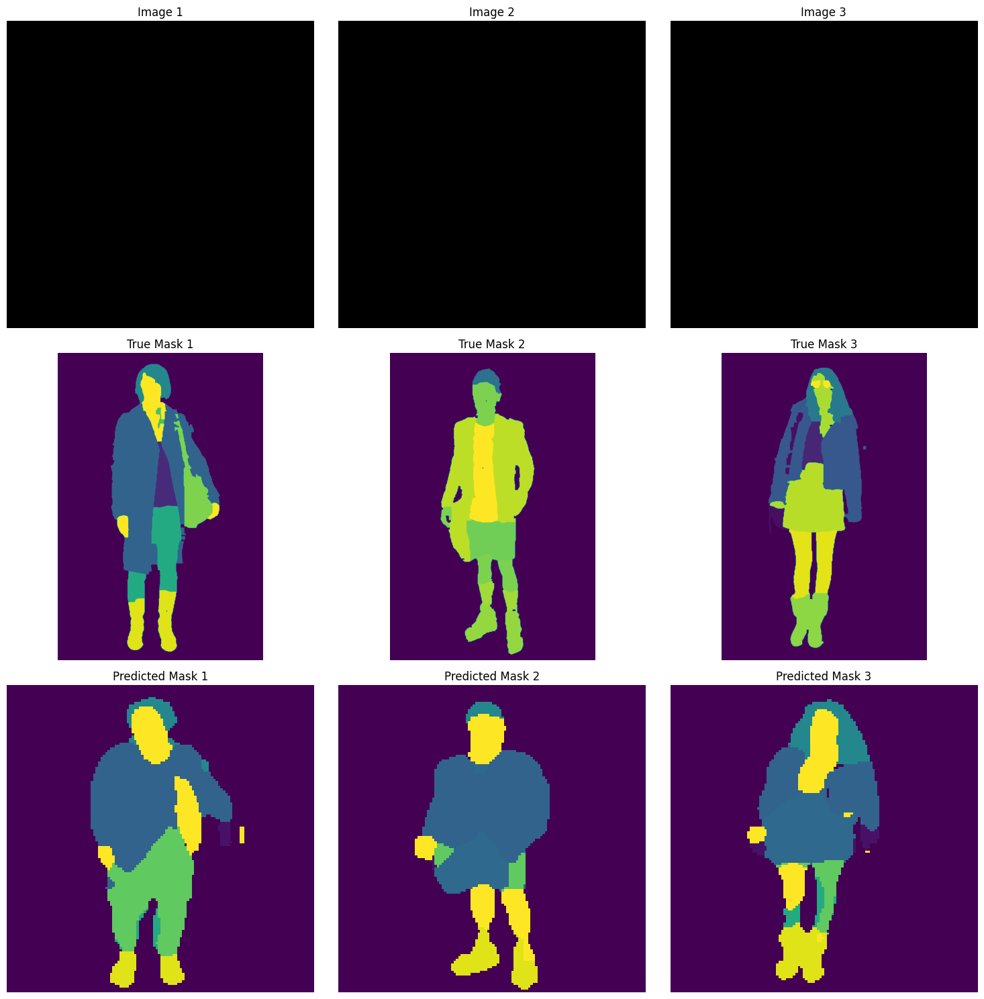

In [ ]:
import matplotlib.pyplot as plt
import torch
import numpy as np

def plot_predictions(model, val_loader, n_samples=3, device='cuda'):
    model.eval()

    # Параметры нормализации (если используются)
    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]

    # Подготовка данных для отрисовки
    images_list = []
    masks_list = []
    pred_masks_list = []

    # Сбор данных для n_samples
    for i in range(n_samples):
        # Извлекаем изображение и маску из датасета
        image, mask = val_loader.dataset[i]
        image = image.to(device).unsqueeze(0)  # Переносим на устройство и добавляем размерность батча

        # Получаем предсказания модели
        with torch.no_grad():
            outputs = model(pixel_values=image)  # Вывод модели
            pred_mask = torch.argmax(outputs.logits, dim=1).cpu().squeeze()  # Находим индекс с максимальной вероятностью

        # Подготовка изображения: обратная нормализация
        image = image.cpu().squeeze().numpy()
        image = (image * np.array(std)[:, None, None] + np.array(mean)[:, None, None])  # Обратная нормализация
        image = np.clip(image, 0, 1).transpose(1, 2, 0)  # Переставляем оси для RGB

        # Преобразуем маски в numpy
        mask = mask.cpu().numpy().squeeze()
        pred_mask = pred_mask.numpy()

        # Сохраняем данные для визуализации
        images_list.append(image)
        masks_list.append(mask)
        pred_masks_list.append(pred_mask)

    # Визуализация: изображения, маски и предсказания в отдельных строках
    fig, axes = plt.subplots(3, n_samples, figsize=(5 * n_samples, 15))

    for i in range(n_samples):
        # Первая строка: изображения
        axes[0, i].imshow(images_list[i])
        axes[0, i].set_title(f"Image {i+1}")
        axes[0, i].axis('off')

        # Вторая строка: истинные маски
        axes[1, i].imshow(masks_list[i], cmap="viridis")
        axes[1, i].set_title(f"True Mask {i+1}")
        axes[1, i].axis('off')

        # Третья строка: предсказанные маски
        axes[2, i].imshow(pred_masks_list[i], cmap="viridis")
        axes[2, i].set_title(f"Predicted Mask {i+1}")
        axes[2, i].axis('off')

    plt.tight_layout()
    plt.show()

# Пример вызова функции:
plot_predictions(model, val_loader, n_samples=3, device='cuda')


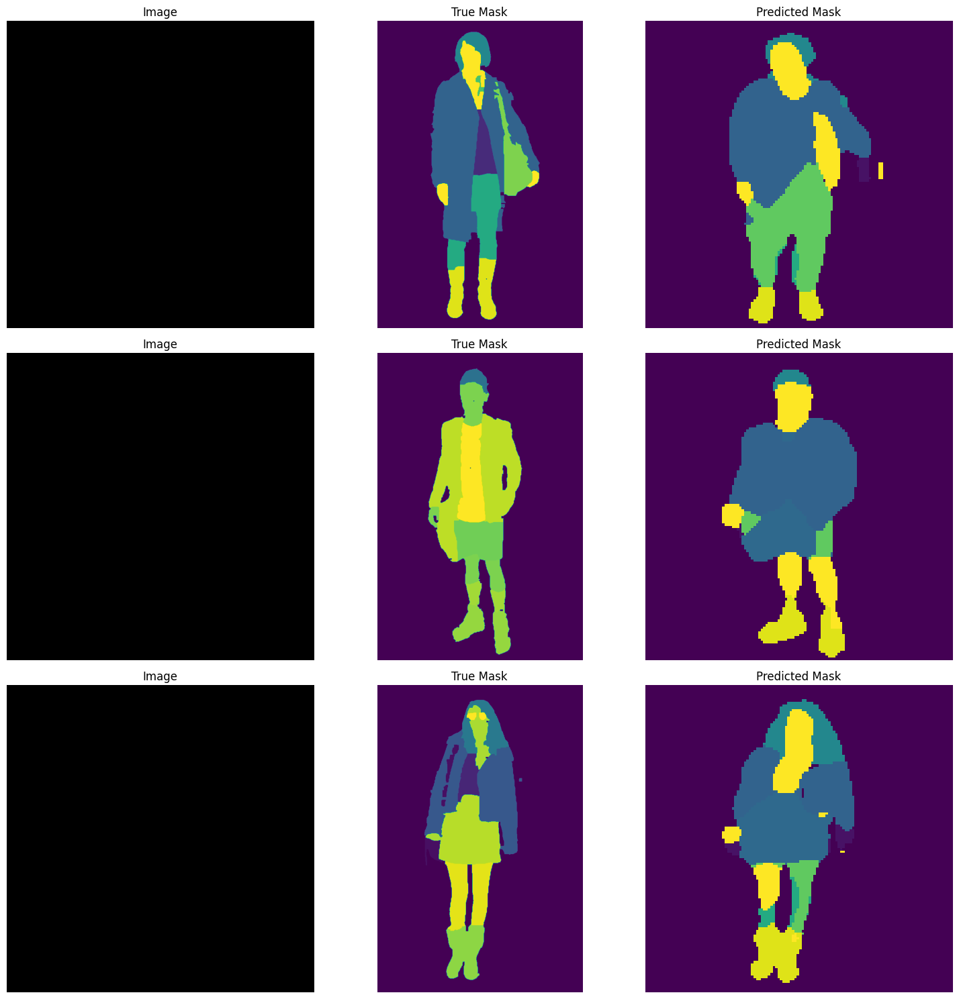

In [ ]:
import matplotlib.pyplot as plt
import torch
import numpy as np

def plot_predictions(model, val_loader, n_samples=3, device='cuda'):
    model.eval()
    fig, axes = plt.subplots(n_samples, 3, figsize=(15, n_samples * 5))

    # Используем два индекса: один для датасета, другой для загрузчика
    for i in range(n_samples):
        # Извлекаем изображение и маску из датасета
        image, mask = val_loader.dataset[i]
        image = image.to(device).unsqueeze(0)  # Переносим на устройство и добавляем размерность батча

        # Получаем предсказания модели
        with torch.no_grad():
            outputs = model(pixel_values=image)  # Вывод модели
            pred_mask = torch.argmax(outputs.logits, dim=1).cpu().squeeze()  # Находим индекс с максимальной вероятностью

        # Преобразуем изображения и маски в numpy для отображения
        image = image.cpu().numpy().squeeze().transpose(1, 2, 0)  # Изменяем порядок осей для отображения
        mask = mask.cpu().numpy().squeeze()

        # Масштабируем изображение в диапазон [0, 1]
        image = np.clip(image, 0, 1)

        # Отображаем изображения и маски
        axes[i, 0].imshow(image)
        axes[i, 0].set_title("Image")
        axes[i, 0].axis('off')

        axes[i, 1].imshow(mask, cmap="viridis")
        axes[i, 1].set_title("True Mask")
        axes[i, 1].axis('off')

        axes[i, 2].imshow(pred_mask, cmap="viridis")
        axes[i, 2].set_title("Predicted Mask")
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

# Пример вызова функции:
plot_predictions(model, val_loader, n_samples=3, device='cuda')


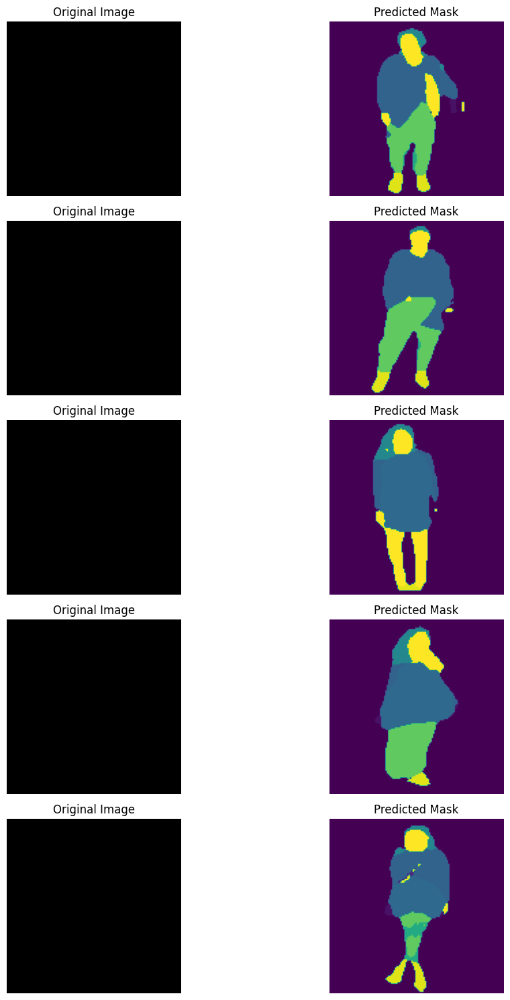

In [ ]:
def visualize_predictions(model, dataloader, device, n_images=5):
    model.eval()  # Устанавливаем модель в режим оценки
    fig, axes = plt.subplots(n_images, 2, figsize=(12, 3 * n_images))
    for i, (images, masks) in enumerate(dataloader):
        if i == n_images:
            break

        image = images[0].cpu().numpy().transpose(1, 2, 0)  # Преобразуем в HxWxC
        mask = masks[0].cpu().numpy()  # Маска в формате (H, W)

        # Прогоняем изображение через модель
        with torch.no_grad():
            outputs = model(pixel_values=images.to(device))

        pred_mask = torch.argmax(outputs.logits, dim=1).cpu().numpy()[0]  # Прогнозируем маску

        # Отображаем оригинальное изображение и маску
        axes[i, 0].imshow(image)
        axes[i, 0].set_title("Original Image")
        axes[i, 0].axis("off")

        axes[i, 1].imshow(pred_mask)  # Показываем предсказанную маску
        axes[i, 1].set_title("Predicted Mask")
        axes[i, 1].axis("off")

    plt.tight_layout()
    plt.show()

# Визуализируем 5 изображений
visualize_predictions(model, val_loader, device, n_images=5)


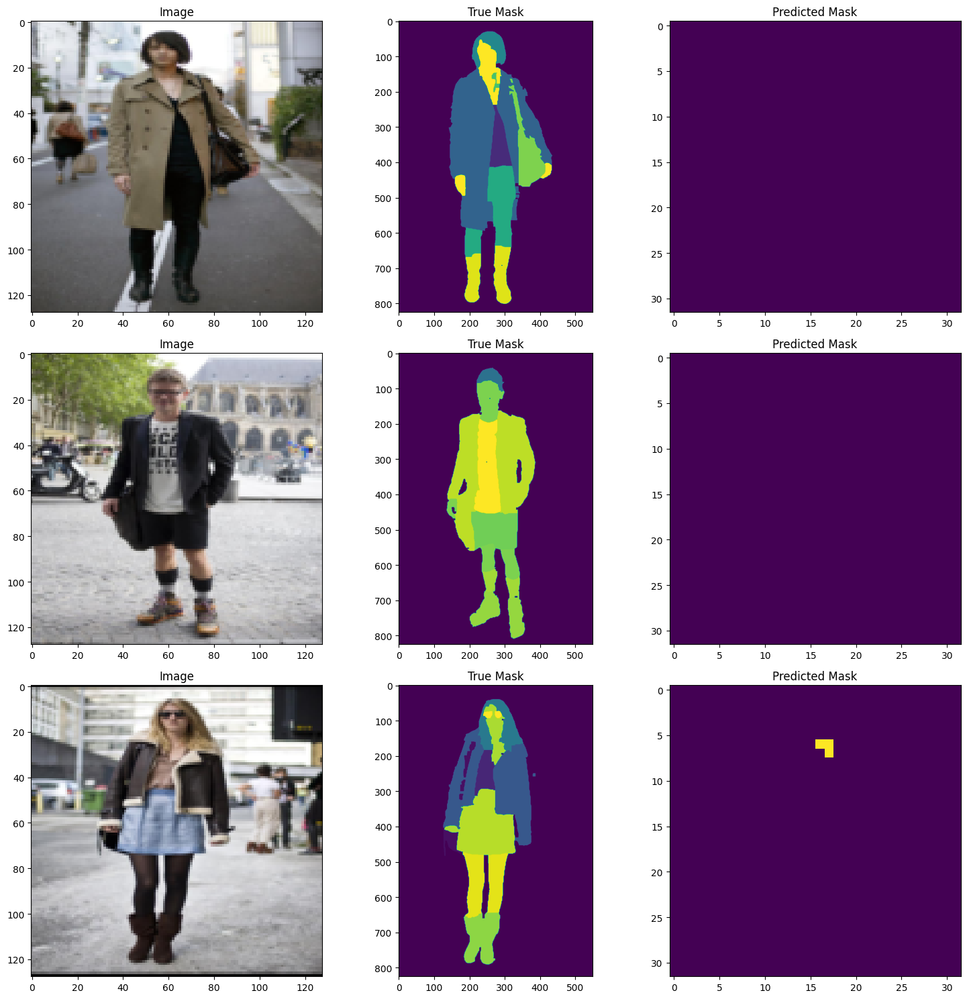

In [ ]:
def plot_predictions(model, dataset, n_samples=3):
    model.eval()
    fig, axes = plt.subplots(n_samples, 3, figsize=(15, n_samples * 5))

    for i in range(n_samples):
        image, mask = dataset[i]
        image = image.cuda().unsqueeze(0)

        # Получаем вывод модели
        outputs = model(image)

        # Извлекаем логиты из объекта SemanticSegmenterOutput и находим предсказанную маску
        pred = torch.argmax(outputs.logits, dim=1).cpu().squeeze()

        # Отображаем изображения и маски
        axes[i, 0].imshow(image.cpu().squeeze().permute(1, 2, 0))  # Переставляем оси для отображения
        axes[i, 0].set_title("Image")

        axes[i, 1].imshow(mask.squeeze(), cmap="viridis")
        axes[i, 1].set_title("True Mask")

        axes[i, 2].imshow(pred, cmap="viridis")
        axes[i, 2].set_title("Predicted Mask")

    plt.tight_layout()
    plt.show()

# Визуализируем 3 изображения и их маски
plot_predictions(model, val_dataset)


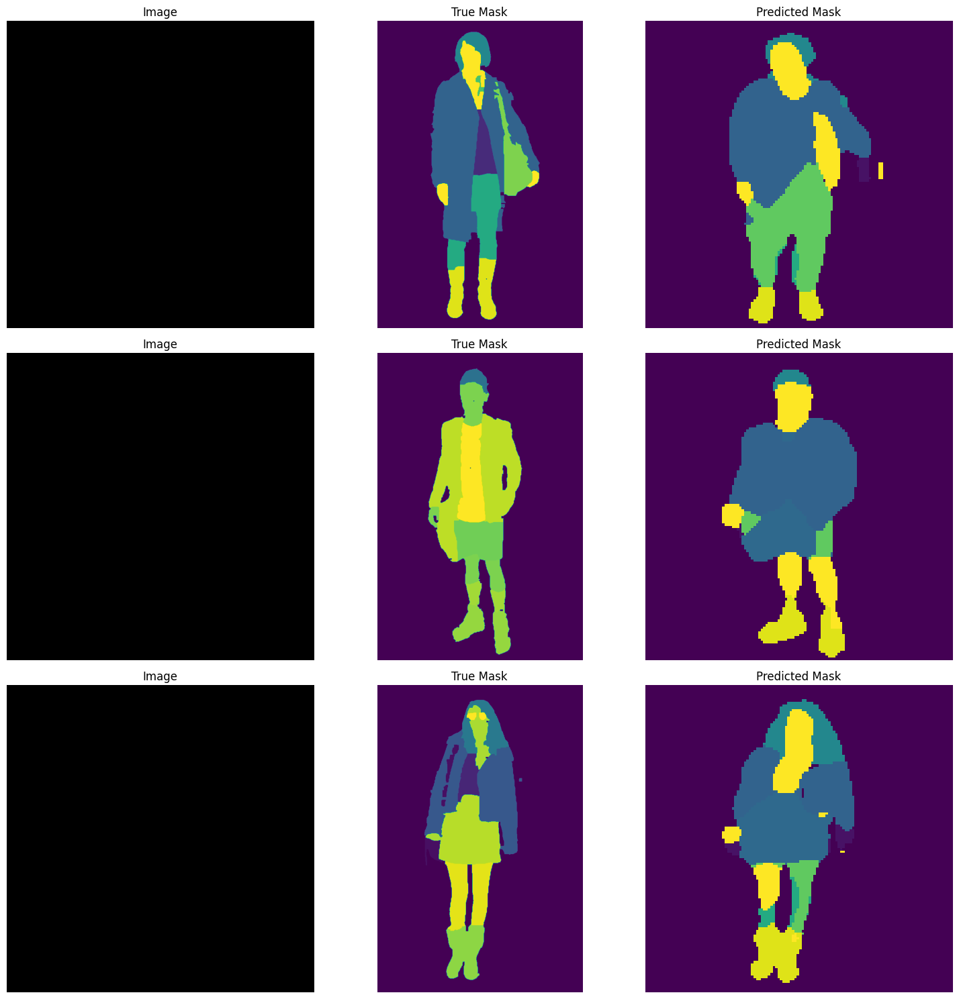

In [ ]:
import matplotlib.pyplot as plt
import torch
import numpy as np

def plot_predictions(model, val_loader, n_samples=3, device='cuda'):
    model.eval()
    fig, axes = plt.subplots(n_samples, 3, figsize=(15, n_samples * 5))

    # Используем два индекса: один для датасета, другой для загрузчика
    for i in range(n_samples):
        # Извлекаем изображение и маску из датасета
        image, mask = val_loader.dataset[i]
        image = image.to(device).unsqueeze(0)  # Переносим на устройство и добавляем размерность батча

        # Получаем предсказания модели
        with torch.no_grad():
            outputs = model(pixel_values=image)  # Вывод модели
            pred_mask = torch.argmax(outputs.logits, dim=1).cpu().squeeze()  # Находим индекс с максимальной вероятностью

        # Преобразуем изображения и маски в numpy для отображения
        image = image.cpu().numpy().squeeze().transpose(1, 2, 0)  # Изменяем порядок осей для отображения
        mask = mask.cpu().numpy().squeeze()

        # Отображаем изображения и маски
        axes[i, 0].imshow(image)
        axes[i, 0].set_title("Image")
        axes[i, 0].axis('off')

        axes[i, 1].imshow(mask, cmap="viridis")
        axes[i, 1].set_title("True Mask")
        axes[i, 1].axis('off')

        axes[i, 2].imshow(pred_mask, cmap="viridis")
        axes[i, 2].set_title("Predicted Mask")
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

# Пример вызова функции:
plot_predictions(model, val_loader, n_samples=3, device='cuda')


TypeError: Invalid shape (1, 825, 550) for image data

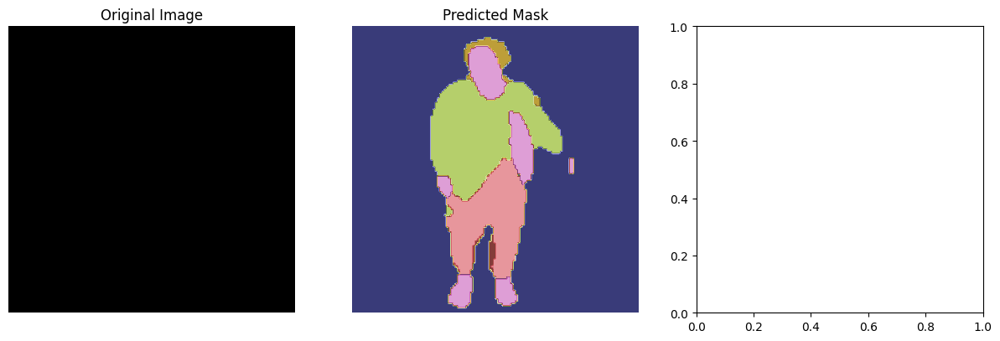

In [ ]:
# Функция для отрисовки предсказанных и реальных масок
def visualize_predictions(model, val_loader, device, n_images=5):
    model.eval()
    with torch.no_grad():
        for i, (images, masks) in enumerate(val_loader):
            if i >= n_images:  # Ограничиваемся только n изображениями
                break

            # Переносим данные на устройство (GPU/CPU)
            images, masks = images.to(device), masks.to(device)

            # Получаем предсказания модели
            outputs = model(pixel_values=images)
            pred_mask = torch.argmax(outputs.logits, dim=1)  # Индекс класса с наибольшей вероятностью

            # Преобразуем тензоры в numpy для отображения
            images = images.cpu().numpy()
            pred_mask = pred_mask.cpu().numpy()
            masks = masks.cpu().numpy()

            # Отображение изображений
            fig, axes = plt.subplots(1, 3, figsize=(15, 5))

            # Отображаем исходное изображение
            axes[0].imshow(np.transpose(images[0], (1, 2, 0)))  # Изменяем порядок осей для отображения
            axes[0].set_title("Original Image")
            axes[0].axis('off')

            # Отображаем предсказанную маску
            axes[1].imshow(pred_mask[0], cmap='tab20b')
            axes[1].set_title("Predicted Mask")
            axes[1].axis('off')

            # Отображаем истинную маску
            axes[2].imshow(masks[0], cmap='tab20b')
            axes[2].set_title("True Mask")
            axes[2].axis('off')

            plt.show()

# Визуализируем 5 изображений
visualize_predictions(model, val_loader, device, n_images=5)


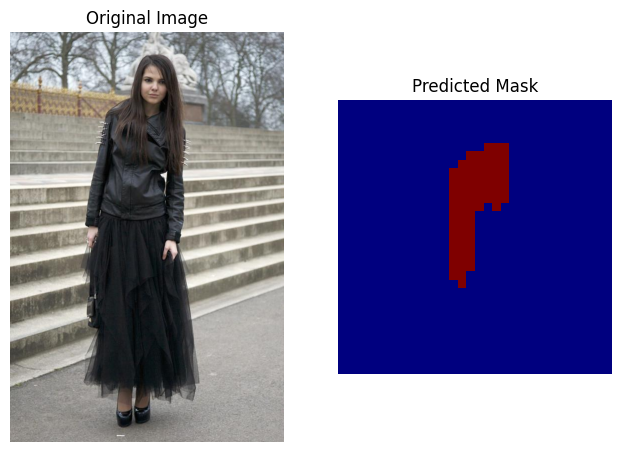

In [ ]:
import torch
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms

# Загрузка и преобразование изображения
image_path = '/content/clothing_segmentation_data/png_images/IMAGES/img_0002.png'
image = Image.open(image_path).convert("RGB")

# Преобразования для изображения (согласно ранее заданным трансформациям)
image_transforms = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
])

# Преобразуем изображение в тензор
image_tensor = image_transforms(image).unsqueeze(0).to(device)  # Добавляем размерность для батча

# Прогоняем изображение через модель
model.eval()
with torch.no_grad():
    outputs = model(pixel_values=image_tensor)
    predicted_mask = torch.argmax(outputs.logits, dim=1).squeeze(0).cpu().numpy()

# Отображаем изображение и маску
plt.figure(figsize=(12, 6))

# Исходное изображение
plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(image)
plt.axis("off")



# Предсказанная маска
plt.subplot(1, 3, 2)
plt.title("Predicted Mask")
plt.imshow(predicted_mask, cmap="jet")
plt.axis("off")

plt.show()


# Прошлые обучения:

In [ ]:
train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=10)

100%|██████████| 25/25 [00:05<00:00,  4.82it/s]


Train Loss: 4.0588, Train IoU: 0.0024
Val Loss: 3.9882, Val IoU: 0.0069




100%|██████████| 25/25 [00:05<00:00,  4.34it/s]


Train Loss: 3.9638, Train IoU: 0.0077
Val Loss: 3.9191, Val IoU: 0.0007




100%|██████████| 25/25 [00:05<00:00,  4.44it/s]


Train Loss: 3.9129, Train IoU: 0.0083
Val Loss: 3.8780, Val IoU: 0.0124




100%|██████████| 25/25 [00:05<00:00,  4.73it/s]


Train Loss: 3.8463, Train IoU: 0.0081
Val Loss: 3.8068, Val IoU: 0.0108




100%|██████████| 25/25 [00:04<00:00,  5.18it/s]


Train Loss: 3.7557, Train IoU: 0.0090
Val Loss: 3.7352, Val IoU: 0.0050




100%|██████████| 25/25 [00:04<00:00,  5.20it/s]


Train Loss: 3.7080, Train IoU: 0.0097
Val Loss: 3.7099, Val IoU: 0.0053




100%|██████████| 25/25 [00:04<00:00,  5.20it/s]


Train Loss: 3.6435, Train IoU: 0.0103
Val Loss: 3.6626, Val IoU: 0.0120




100%|██████████| 25/25 [00:05<00:00,  4.91it/s]


Train Loss: 3.6020, Train IoU: 0.0139
Val Loss: 3.6062, Val IoU: 0.0152




100%|██████████| 25/25 [00:05<00:00,  4.37it/s]


Train Loss: 3.5453, Train IoU: 0.0142
Val Loss: 3.5817, Val IoU: 0.0163




100%|██████████| 25/25 [00:05<00:00,  4.39it/s]


Train Loss: 3.5213, Train IoU: 0.0152
Val Loss: 3.6039, Val IoU: 0.0139




In [ ]:
from transformers import SegformerForSemanticSegmentation, SegformerImageProcessor
from torch.utils.data import DataLoader

# Инициализация модели и процессора
model = SegformerForSemanticSegmentation.from_pretrained("nvidia/segformer-b0-finetuned-ade-512-512",
                                                         num_labels=n_classes).to(device)
processor = SegformerImageProcessor.from_pretrained("nvidia/segformer-b0-finetuned-ade-512-512")

# Преобразования для модели
def preprocess_image(image):
    return processor(image, return_tensors="pt").pixel_values[0]

train_loader = DataLoader(train_dataset, batch_size=16)
val_loader = DataLoader(val_dataset, batch_size=16)

# Оптимизатор и функция потерь
optimizer = optim.Adam(model.parameters(), lr=0.0001)
loss_fn = nn.CrossEntropyLoss(weight=class_weights)

# Цикл обучения
epochs = 10
for epoch in range(epochs):
    model.train()
    train_loss = 0
    train_iou = 0
    for images, masks in tqdm(train_loader):
        images, masks = images.to(device), masks.to(device)

        outputs = model(pixel_values=images)
        loss = loss_fn(outputs.logits, masks)
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
        train_iou += iou(outputs.logits, masks, n_classes)

    print(f"Epoch {epoch+1}, Loss: {train_loss:.4f}, IoU: {train_iou:.4f}")

# Визуализация результатов
plot_predictions(model, val_dataset)


In [ ]:
train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=10)

Validation: 100%|██████████| 13/13 [00:05<00:00,  2.40it/s]


Epoch 1/10
Train Loss: 4.0614, Train IoU: 0.0112
Val Loss: 4.0116, Val IoU: 0.0114


Validation: 100%|██████████| 13/13 [00:05<00:00,  2.20it/s]


Epoch 2/10
Train Loss: 3.9748, Train IoU: 0.0084
Val Loss: 3.9756, Val IoU: 0.0092


Validation: 100%|██████████| 13/13 [00:04<00:00,  2.65it/s]


Epoch 3/10
Train Loss: 3.9357, Train IoU: 0.0070
Val Loss: 3.9600, Val IoU: 0.0100


Validation: 100%|██████████| 13/13 [00:04<00:00,  2.62it/s]


Epoch 4/10
Train Loss: 3.9078, Train IoU: 0.0090
Val Loss: 3.9515, Val IoU: 0.0010


Validation: 100%|██████████| 13/13 [00:05<00:00,  2.27it/s]


Epoch 5/10
Train Loss: 3.8494, Train IoU: 0.0101
Val Loss: 3.8941, Val IoU: 0.0125


Validation: 100%|██████████| 13/13 [00:05<00:00,  2.31it/s]


Epoch 6/10
Train Loss: 3.7570, Train IoU: 0.0116
Val Loss: 3.8290, Val IoU: 0.0134


Validation: 100%|██████████| 13/13 [00:04<00:00,  2.66it/s]


Epoch 7/10
Train Loss: 3.7020, Train IoU: 0.0116
Val Loss: 3.8075, Val IoU: 0.0102


Validation: 100%|██████████| 13/13 [00:04<00:00,  2.65it/s]


Epoch 8/10
Train Loss: 3.6336, Train IoU: 0.0127
Val Loss: 3.8298, Val IoU: 0.0101


Validation: 100%|██████████| 13/13 [00:04<00:00,  2.66it/s]


Epoch 9/10
Train Loss: 3.5976, Train IoU: 0.0135
Val Loss: 3.7654, Val IoU: 0.0182


Validation: 100%|██████████| 13/13 [00:05<00:00,  2.46it/s]

Epoch 10/10
Train Loss: 3.5911, Train IoU: 0.0136
Val Loss: 3.7480, Val IoU: 0.0162


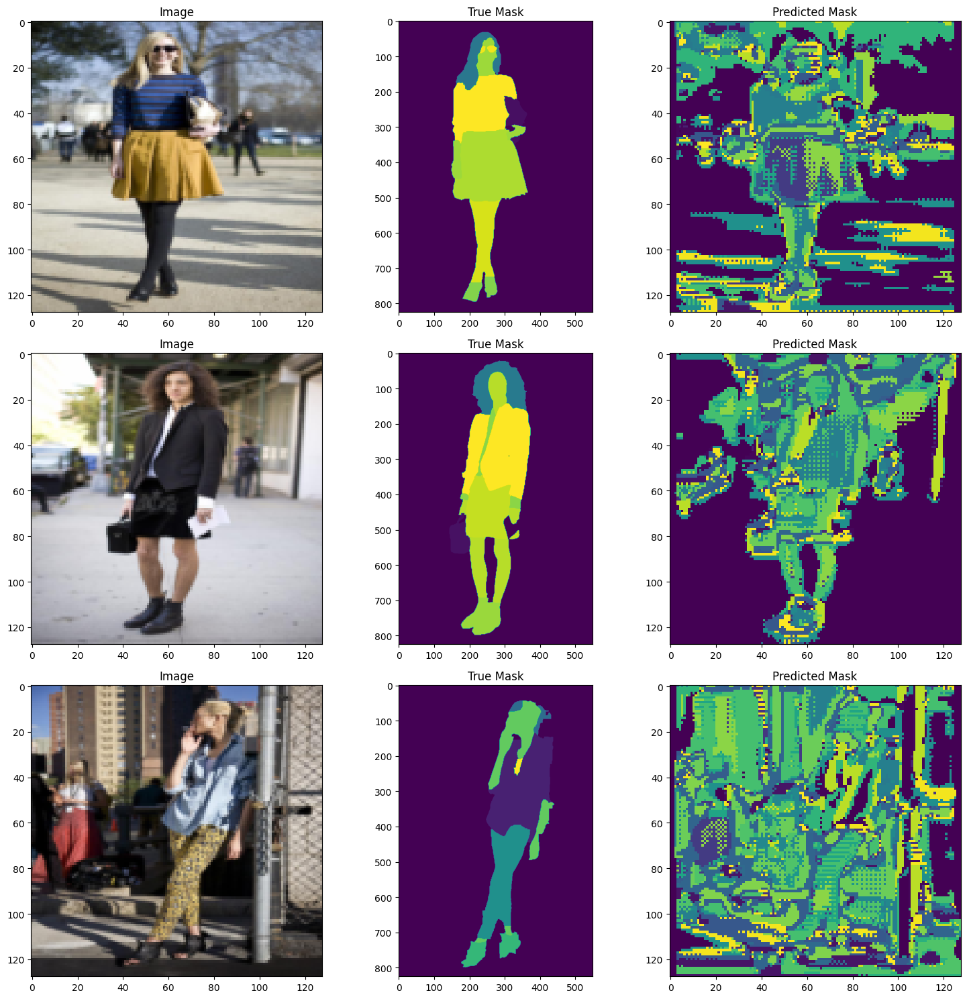

In [ ]:
# Отрисовка предсказаний
def plot_predictions(model, dataset, n_samples=3):
    model.eval()
    fig, axes = plt.subplots(n_samples, 3, figsize=(15, n_samples * 5))
    for i in range(n_samples):
        image, mask = dataset[i]
        image = image.cuda().unsqueeze(0)
        pred = torch.argmax(model(image), dim=1).cpu().squeeze()

        axes[i, 0].imshow(image.cpu().squeeze().permute(1, 2, 0))
        axes[i, 0].set_title("Image")
        axes[i, 1].imshow(mask.squeeze(), cmap="viridis")
        axes[i, 1].set_title("True Mask")
        axes[i, 2].imshow(pred, cmap="viridis")
        axes[i, 2].set_title("Predicted Mask")

    plt.tight_layout()
    plt.show()

plot_predictions(model, val_dataset)